# Face Generation
In this Udacity project, I use generative adversarial networks to generate new images of faces.
### Get the Data
I'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and I'm doing GANs in a project for the first time, Udacity wanted me to test my neural network on MNIST before CelebA.  Running the GANs on MNIST will allow me to see how well my model trains sooner.



In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

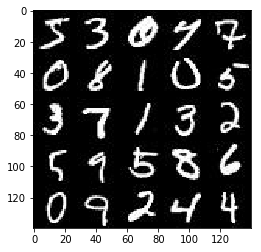

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

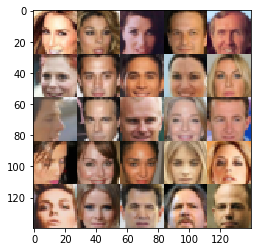

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0


/Users/vivek/anaconda/envs/tensorflow/lib/python3.5/site-packages/ipykernel_launcher.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.
  


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    
    real_inputs = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), "input_real")
    z_inputs = tf.placeholder(tf.float32, (None, z_dim), "input_z")
    learning_rate = tf.placeholder(tf.float32, name="lr")

    return real_inputs, z_inputs, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.1
    keep_prob = 0.9

    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same', activation=None)
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding='same', activation=None)
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha * x2, x2)
        x2 = tf.nn.dropout(x2, keep_prob=keep_prob)
        
        x3 = tf.layers.conv2d(x2, 256, 5, strides=2, padding='same', activation=None)
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha * x3, x3)
        x3 = tf.nn.dropout(x3, keep_prob=keep_prob)
        
        flat = tf.reshape(x3, (-1,  4 * 4 * 256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    keep_prob = 0.9
    
    with tf.variable_scope('generator', reuse=not is_train):
        g1 = tf.layers.dense(z, 7*7*512)
        g1 = tf.reshape(g1, (-1, 7, 7, 512))
        g1 = tf.layers.batch_normalization(g1, training=is_train)
        g1 = tf.maximum(alpha * g1, g1)
        # shape = 7x7x512
        
        g2 = tf.layers.conv2d_transpose(g1, 256, 5, strides=2, padding='same', activation=None)
        g2 = tf.layers.batch_normalization(g2, training=is_train)
        g2 = tf.maximum(alpha * g2, g2)
        g2 = tf.nn.dropout(g2, keep_prob=keep_prob)
        # shape = 14x14x256
        
        g3 = tf.layers.conv2d_transpose(g2, 128, 5, strides=2, padding='same', activation=None)
        g3 = tf.layers.batch_normalization(g3, training=is_train)
        g3 = tf.maximum(alpha * g3, g3)   
        g3 = tf.nn.dropout(g3, keep_prob=keep_prob)
        # shape = 28x28x128
        
        logits = tf.layers.conv2d_transpose(g3, out_channel_dim, 3, strides=1, padding='same', activation=None)
        # shape = 28x28x5
        
        out = tf.tanh(logits)
        
        return out




"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    
    # implementing Function here
    smooth = 0.1
    g_output = generator(input_z, out_channel_dim)
    disc_output_real, disc_logits_real = discriminator(input_real)
    disc_output_fake, disc_logits_fake = discriminator(g_output, reuse=True)
    
    disc_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits = disc_logits_real,
            labels = tf.ones_like(disc_output_real) * (1 - smooth)
        )
    )
    disc_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits = disc_logits_fake,
            labels = tf.zeros_like(disc_output_fake)
        )
    )
    gen_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits = disc_logits_fake,
            labels = tf.ones_like(disc_output_fake)
        )
    )
    
    disc_loss = disc_loss_real + disc_loss_fake
    return disc_loss, gen_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    train_vars = tf.trainable_variables()
    disc_vars = [var for var in train_vars if var.name.startswith('discriminator')]
    gen_vars = [var for var in train_vars if var.name.startswith('generator')]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)

    with tf.control_dependencies(update_ops):
        gen_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=gen_vars)
        disc_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=disc_vars)

        return disc_train_opt, gen_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    disc_loss, gen_loss = model_loss(input_real, input_z, image_channels)
    disc_opt, gen_opt = model_opt(disc_loss, gen_loss, lr, beta1)

    
    saver = tf.train.Saver()
    losses = []
    steps = 0
    total_steps = epoch_count * batch_size

    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images *= 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(
                    disc_opt, 
                    feed_dict={
                        input_real: batch_images, input_z: batch_z, lr: learning_rate 
                    }
                )
                _ = sess.run(
                    gen_opt, 
                    feed_dict={
                        input_real: batch_images, 
                        input_z: batch_z, 
                        lr:learning_rate
                    }
                )
                if steps == 1:
                    print('initial output:')
                    show_generator_output(sess, 16, input_z, image_channels, data_image_mode)
                    
                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = disc_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = gen_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                            "Generator Loss: {:.4f}".format(train_loss_g),
                            "Discriminator Loss: {:.4f}...".format(train_loss_d))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % 100 == 0:
                    show_generator_output(sess, 16, input_z, image_channels, data_image_mode)
                    

        saver.save(sess, './generator.ckpt')
                
    return losses
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

initial output:


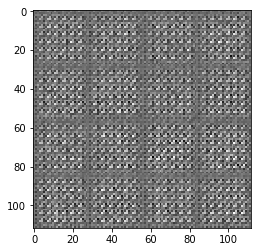

Epoch 1/2... Generator Loss: 9.8908 Discriminator Loss: 0.5217...
Epoch 1/2... Generator Loss: 4.8175 Discriminator Loss: 0.4804...
Epoch 1/2... Generator Loss: 5.4851 Discriminator Loss: 0.4026...
Epoch 1/2... Generator Loss: 1.4902 Discriminator Loss: 0.9049...
Epoch 1/2... Generator Loss: 1.8120 Discriminator Loss: 0.5725...
Epoch 1/2... Generator Loss: 1.8128 Discriminator Loss: 1.1397...
Epoch 1/2... Generator Loss: 0.7530 Discriminator Loss: 1.3879...
Epoch 1/2... Generator Loss: 0.4959 Discriminator Loss: 1.8293...
Epoch 1/2... Generator Loss: 0.6329 Discriminator Loss: 1.8025...
Epoch 1/2... Generator Loss: 1.5455 Discriminator Loss: 0.9497...


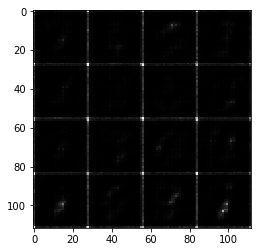

Epoch 1/2... Generator Loss: 0.7882 Discriminator Loss: 1.6206...
Epoch 1/2... Generator Loss: 0.9522 Discriminator Loss: 1.1870...
Epoch 1/2... Generator Loss: 0.5590 Discriminator Loss: 1.3986...
Epoch 1/2... Generator Loss: 0.6614 Discriminator Loss: 1.2208...
Epoch 1/2... Generator Loss: 0.7064 Discriminator Loss: 1.2329...
Epoch 1/2... Generator Loss: 0.5395 Discriminator Loss: 1.4315...
Epoch 1/2... Generator Loss: 0.6705 Discriminator Loss: 1.2842...
Epoch 1/2... Generator Loss: 1.1176 Discriminator Loss: 1.0815...
Epoch 1/2... Generator Loss: 0.3805 Discriminator Loss: 1.7588...
Epoch 1/2... Generator Loss: 1.1414 Discriminator Loss: 1.1931...


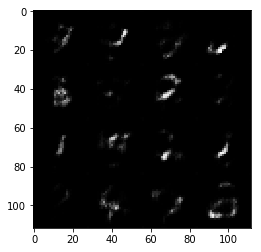

Epoch 1/2... Generator Loss: 0.4776 Discriminator Loss: 1.4583...
Epoch 1/2... Generator Loss: 0.9046 Discriminator Loss: 1.3181...
Epoch 1/2... Generator Loss: 0.7145 Discriminator Loss: 1.4570...
Epoch 1/2... Generator Loss: 0.6735 Discriminator Loss: 1.2470...
Epoch 1/2... Generator Loss: 0.7276 Discriminator Loss: 1.2582...
Epoch 1/2... Generator Loss: 0.6171 Discriminator Loss: 1.3063...
Epoch 1/2... Generator Loss: 0.5264 Discriminator Loss: 1.4346...
Epoch 1/2... Generator Loss: 0.7037 Discriminator Loss: 1.1595...
Epoch 1/2... Generator Loss: 0.8142 Discriminator Loss: 0.9975...
Epoch 1/2... Generator Loss: 1.6161 Discriminator Loss: 1.6302...


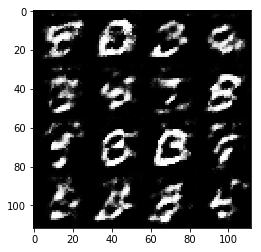

Epoch 1/2... Generator Loss: 0.2755 Discriminator Loss: 1.9949...
Epoch 1/2... Generator Loss: 0.6794 Discriminator Loss: 1.2904...
Epoch 1/2... Generator Loss: 0.5525 Discriminator Loss: 1.4383...
Epoch 1/2... Generator Loss: 0.5829 Discriminator Loss: 1.3448...
Epoch 1/2... Generator Loss: 0.7816 Discriminator Loss: 1.2001...
Epoch 1/2... Generator Loss: 0.8363 Discriminator Loss: 1.4575...
Epoch 1/2... Generator Loss: 1.0474 Discriminator Loss: 1.3096...
Epoch 1/2... Generator Loss: 0.6895 Discriminator Loss: 1.2804...
Epoch 1/2... Generator Loss: 1.2839 Discriminator Loss: 1.2567...
Epoch 1/2... Generator Loss: 0.7769 Discriminator Loss: 1.3099...


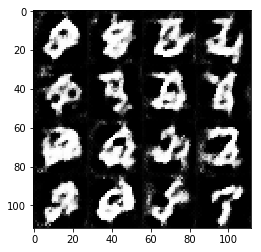

Epoch 1/2... Generator Loss: 1.0168 Discriminator Loss: 1.3685...
Epoch 1/2... Generator Loss: 0.3170 Discriminator Loss: 1.7958...
Epoch 1/2... Generator Loss: 1.0350 Discriminator Loss: 1.0258...
Epoch 1/2... Generator Loss: 0.4970 Discriminator Loss: 1.5929...
Epoch 1/2... Generator Loss: 1.2225 Discriminator Loss: 1.0113...
Epoch 1/2... Generator Loss: 0.9030 Discriminator Loss: 1.1165...
Epoch 1/2... Generator Loss: 0.7136 Discriminator Loss: 1.3729...
Epoch 1/2... Generator Loss: 0.9150 Discriminator Loss: 1.3522...
Epoch 1/2... Generator Loss: 0.9897 Discriminator Loss: 1.2154...
Epoch 1/2... Generator Loss: 0.8887 Discriminator Loss: 1.2095...


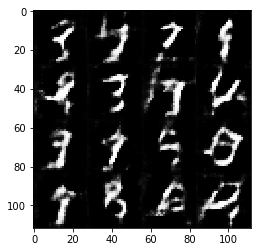

Epoch 1/2... Generator Loss: 0.5849 Discriminator Loss: 1.5247...
Epoch 1/2... Generator Loss: 0.8113 Discriminator Loss: 1.0492...
Epoch 1/2... Generator Loss: 1.7208 Discriminator Loss: 1.7948...
Epoch 1/2... Generator Loss: 0.4106 Discriminator Loss: 1.6429...
Epoch 1/2... Generator Loss: 0.9462 Discriminator Loss: 1.0323...
Epoch 1/2... Generator Loss: 0.8379 Discriminator Loss: 1.1549...
Epoch 1/2... Generator Loss: 0.9223 Discriminator Loss: 1.1421...
Epoch 1/2... Generator Loss: 0.4615 Discriminator Loss: 1.7280...
Epoch 1/2... Generator Loss: 0.8497 Discriminator Loss: 1.3308...
Epoch 1/2... Generator Loss: 0.3142 Discriminator Loss: 1.7612...


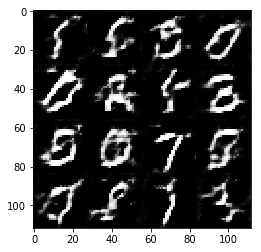

Epoch 1/2... Generator Loss: 0.7664 Discriminator Loss: 1.4547...
Epoch 1/2... Generator Loss: 0.4128 Discriminator Loss: 1.6640...
Epoch 1/2... Generator Loss: 0.3861 Discriminator Loss: 1.6802...
Epoch 1/2... Generator Loss: 0.9879 Discriminator Loss: 1.3897...
Epoch 1/2... Generator Loss: 0.4647 Discriminator Loss: 1.4486...
Epoch 1/2... Generator Loss: 0.6073 Discriminator Loss: 1.3460...
Epoch 1/2... Generator Loss: 0.5379 Discriminator Loss: 1.4041...
Epoch 1/2... Generator Loss: 1.1940 Discriminator Loss: 1.1067...
Epoch 1/2... Generator Loss: 0.6434 Discriminator Loss: 1.2366...
Epoch 1/2... Generator Loss: 0.5772 Discriminator Loss: 1.3935...


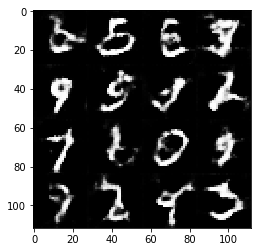

Epoch 1/2... Generator Loss: 1.2329 Discriminator Loss: 1.6491...
Epoch 1/2... Generator Loss: 1.1179 Discriminator Loss: 1.1590...
Epoch 1/2... Generator Loss: 0.4397 Discriminator Loss: 1.4645...
Epoch 1/2... Generator Loss: 0.9999 Discriminator Loss: 1.3191...
Epoch 1/2... Generator Loss: 1.0100 Discriminator Loss: 0.9752...
Epoch 1/2... Generator Loss: 0.9086 Discriminator Loss: 1.2932...
Epoch 1/2... Generator Loss: 1.4414 Discriminator Loss: 1.3602...
Epoch 1/2... Generator Loss: 0.3840 Discriminator Loss: 1.7747...
Epoch 1/2... Generator Loss: 0.8497 Discriminator Loss: 1.3516...
Epoch 1/2... Generator Loss: 0.6145 Discriminator Loss: 1.4261...


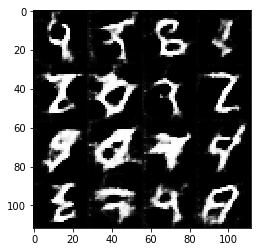

Epoch 1/2... Generator Loss: 0.5618 Discriminator Loss: 1.5721...
Epoch 1/2... Generator Loss: 0.7252 Discriminator Loss: 1.0792...
Epoch 1/2... Generator Loss: 1.5294 Discriminator Loss: 0.8366...
Epoch 1/2... Generator Loss: 0.6698 Discriminator Loss: 1.3046...
Epoch 1/2... Generator Loss: 1.2137 Discriminator Loss: 1.2776...
Epoch 1/2... Generator Loss: 1.2572 Discriminator Loss: 1.2456...
Epoch 1/2... Generator Loss: 0.4341 Discriminator Loss: 1.3710...
Epoch 1/2... Generator Loss: 0.6557 Discriminator Loss: 1.4742...
Epoch 1/2... Generator Loss: 0.6458 Discriminator Loss: 1.3615...
Epoch 1/2... Generator Loss: 1.6056 Discriminator Loss: 1.0908...


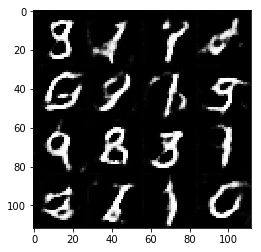

Epoch 1/2... Generator Loss: 0.8822 Discriminator Loss: 1.1603...
Epoch 1/2... Generator Loss: 0.7919 Discriminator Loss: 1.2093...
Epoch 1/2... Generator Loss: 1.1259 Discriminator Loss: 1.5228...
Epoch 1/2... Generator Loss: 0.7402 Discriminator Loss: 1.1220...
Epoch 1/2... Generator Loss: 0.8692 Discriminator Loss: 1.1011...
Epoch 1/2... Generator Loss: 1.0688 Discriminator Loss: 1.1965...
Epoch 1/2... Generator Loss: 1.1052 Discriminator Loss: 1.1936...
Epoch 1/2... Generator Loss: 0.8475 Discriminator Loss: 1.3944...
Epoch 1/2... Generator Loss: 0.8030 Discriminator Loss: 0.9286...
Epoch 1/2... Generator Loss: 0.8456 Discriminator Loss: 1.0989...


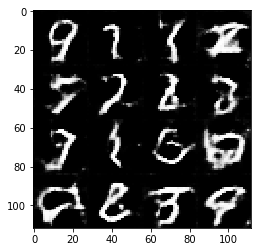

Epoch 1/2... Generator Loss: 0.4620 Discriminator Loss: 1.5271...
Epoch 1/2... Generator Loss: 0.9653 Discriminator Loss: 1.0613...
Epoch 1/2... Generator Loss: 1.5444 Discriminator Loss: 0.9203...
Epoch 1/2... Generator Loss: 0.4175 Discriminator Loss: 1.7281...
Epoch 1/2... Generator Loss: 0.6311 Discriminator Loss: 1.2225...
Epoch 1/2... Generator Loss: 0.7288 Discriminator Loss: 1.2570...
Epoch 1/2... Generator Loss: 0.8184 Discriminator Loss: 1.2926...
Epoch 1/2... Generator Loss: 0.9525 Discriminator Loss: 1.2410...
Epoch 1/2... Generator Loss: 1.1850 Discriminator Loss: 0.9707...
Epoch 1/2... Generator Loss: 0.6863 Discriminator Loss: 1.4840...


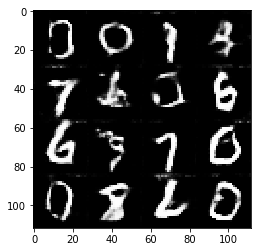

Epoch 1/2... Generator Loss: 0.9861 Discriminator Loss: 1.0153...
Epoch 1/2... Generator Loss: 0.9687 Discriminator Loss: 1.4304...
Epoch 1/2... Generator Loss: 0.6542 Discriminator Loss: 1.5174...
Epoch 1/2... Generator Loss: 0.6988 Discriminator Loss: 1.3812...
Epoch 1/2... Generator Loss: 1.2436 Discriminator Loss: 0.8952...
Epoch 1/2... Generator Loss: 1.0646 Discriminator Loss: 1.1686...
Epoch 1/2... Generator Loss: 0.3798 Discriminator Loss: 1.9233...
Epoch 1/2... Generator Loss: 0.9952 Discriminator Loss: 0.9458...
Epoch 1/2... Generator Loss: 0.7371 Discriminator Loss: 1.1921...
Epoch 1/2... Generator Loss: 0.6445 Discriminator Loss: 1.3980...


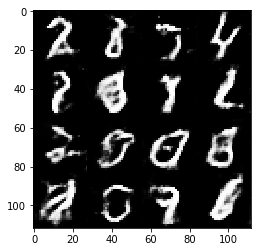

Epoch 1/2... Generator Loss: 1.3187 Discriminator Loss: 1.1184...
Epoch 1/2... Generator Loss: 0.6508 Discriminator Loss: 1.2653...
Epoch 1/2... Generator Loss: 0.9510 Discriminator Loss: 1.0807...
Epoch 1/2... Generator Loss: 1.0375 Discriminator Loss: 1.0621...
Epoch 1/2... Generator Loss: 0.9205 Discriminator Loss: 1.1333...
Epoch 1/2... Generator Loss: 0.6388 Discriminator Loss: 1.4716...
Epoch 1/2... Generator Loss: 0.7448 Discriminator Loss: 1.0779...
Epoch 1/2... Generator Loss: 1.5267 Discriminator Loss: 0.8494...
Epoch 1/2... Generator Loss: 0.7620 Discriminator Loss: 1.1676...
Epoch 1/2... Generator Loss: 1.0639 Discriminator Loss: 1.0903...


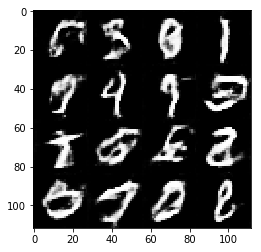

Epoch 1/2... Generator Loss: 0.5269 Discriminator Loss: 1.3834...
Epoch 1/2... Generator Loss: 1.0161 Discriminator Loss: 1.0572...
Epoch 1/2... Generator Loss: 1.2525 Discriminator Loss: 1.0498...
Epoch 1/2... Generator Loss: 0.3982 Discriminator Loss: 1.6434...
Epoch 1/2... Generator Loss: 1.2537 Discriminator Loss: 0.8112...
Epoch 1/2... Generator Loss: 0.3434 Discriminator Loss: 1.4679...
Epoch 1/2... Generator Loss: 0.7452 Discriminator Loss: 1.2815...
Epoch 1/2... Generator Loss: 0.8805 Discriminator Loss: 1.2995...
Epoch 1/2... Generator Loss: 0.9365 Discriminator Loss: 0.9369...
Epoch 1/2... Generator Loss: 1.2248 Discriminator Loss: 0.9703...


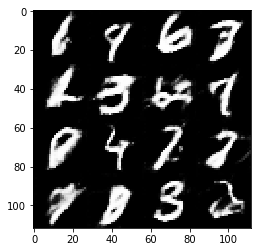

Epoch 1/2... Generator Loss: 1.1349 Discriminator Loss: 1.0870...
Epoch 1/2... Generator Loss: 0.7661 Discriminator Loss: 1.2828...
Epoch 1/2... Generator Loss: 0.8535 Discriminator Loss: 1.1814...
Epoch 1/2... Generator Loss: 1.3587 Discriminator Loss: 0.9798...
Epoch 1/2... Generator Loss: 0.9355 Discriminator Loss: 1.1085...
Epoch 1/2... Generator Loss: 1.2540 Discriminator Loss: 0.9135...
Epoch 1/2... Generator Loss: 0.7591 Discriminator Loss: 1.0182...
Epoch 1/2... Generator Loss: 1.1318 Discriminator Loss: 0.9024...
Epoch 1/2... Generator Loss: 1.0689 Discriminator Loss: 0.9111...
Epoch 1/2... Generator Loss: 1.0653 Discriminator Loss: 1.0945...


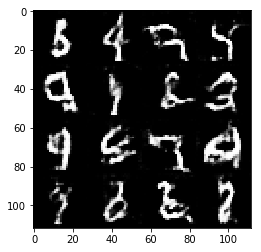

Epoch 1/2... Generator Loss: 1.0322 Discriminator Loss: 1.0929...
Epoch 1/2... Generator Loss: 1.4626 Discriminator Loss: 1.0024...
Epoch 1/2... Generator Loss: 0.2769 Discriminator Loss: 2.0774...
Epoch 1/2... Generator Loss: 0.4634 Discriminator Loss: 1.7017...
Epoch 1/2... Generator Loss: 0.6994 Discriminator Loss: 1.0754...
Epoch 1/2... Generator Loss: 0.8275 Discriminator Loss: 1.2910...
Epoch 1/2... Generator Loss: 1.2025 Discriminator Loss: 1.0481...
Epoch 1/2... Generator Loss: 1.6073 Discriminator Loss: 0.9255...
Epoch 1/2... Generator Loss: 0.6650 Discriminator Loss: 1.1441...
Epoch 1/2... Generator Loss: 1.1557 Discriminator Loss: 0.8163...


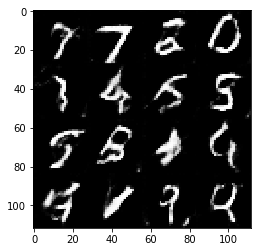

Epoch 1/2... Generator Loss: 0.8773 Discriminator Loss: 1.1110...
Epoch 1/2... Generator Loss: 0.8169 Discriminator Loss: 0.9257...
Epoch 1/2... Generator Loss: 0.7076 Discriminator Loss: 1.0869...
Epoch 1/2... Generator Loss: 1.9201 Discriminator Loss: 0.8675...
Epoch 1/2... Generator Loss: 1.6076 Discriminator Loss: 0.7918...
Epoch 1/2... Generator Loss: 1.0953 Discriminator Loss: 1.0026...
Epoch 1/2... Generator Loss: 0.8463 Discriminator Loss: 0.9420...
Epoch 1/2... Generator Loss: 1.1236 Discriminator Loss: 1.1066...
Epoch 1/2... Generator Loss: 0.8903 Discriminator Loss: 1.0353...
Epoch 1/2... Generator Loss: 0.4671 Discriminator Loss: 1.4079...


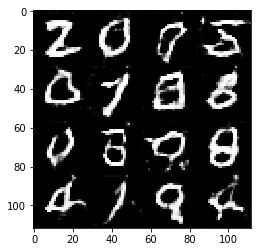

Epoch 1/2... Generator Loss: 0.9363 Discriminator Loss: 1.0399...
Epoch 1/2... Generator Loss: 0.8561 Discriminator Loss: 1.1519...
Epoch 1/2... Generator Loss: 0.4551 Discriminator Loss: 1.4913...
Epoch 1/2... Generator Loss: 0.8053 Discriminator Loss: 1.2706...
Epoch 1/2... Generator Loss: 1.5699 Discriminator Loss: 0.7638...
Epoch 1/2... Generator Loss: 0.8493 Discriminator Loss: 1.1096...
Epoch 1/2... Generator Loss: 0.6924 Discriminator Loss: 1.0806...
Epoch 1/2... Generator Loss: 0.6120 Discriminator Loss: 1.2954...
Epoch 1/2... Generator Loss: 0.9095 Discriminator Loss: 1.0083...
Epoch 1/2... Generator Loss: 0.7264 Discriminator Loss: 1.1229...


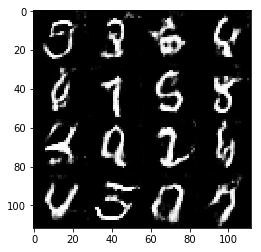

Epoch 1/2... Generator Loss: 1.5695 Discriminator Loss: 0.8632...
Epoch 1/2... Generator Loss: 2.1815 Discriminator Loss: 0.8957...
Epoch 1/2... Generator Loss: 1.2650 Discriminator Loss: 0.7041...
Epoch 1/2... Generator Loss: 0.6647 Discriminator Loss: 1.1485...
Epoch 1/2... Generator Loss: 0.9792 Discriminator Loss: 1.0505...
Epoch 1/2... Generator Loss: 0.4771 Discriminator Loss: 1.3930...
Epoch 1/2... Generator Loss: 0.7995 Discriminator Loss: 1.0528...
Epoch 1/2... Generator Loss: 0.8132 Discriminator Loss: 1.1540...
Epoch 1/2... Generator Loss: 1.1162 Discriminator Loss: 0.8699...
Epoch 1/2... Generator Loss: 1.0765 Discriminator Loss: 0.8706...


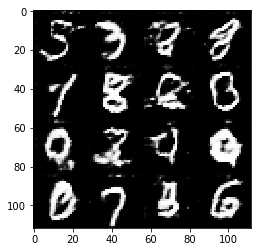

Epoch 1/2... Generator Loss: 0.7499 Discriminator Loss: 1.2375...
Epoch 1/2... Generator Loss: 1.7939 Discriminator Loss: 1.0083...
Epoch 1/2... Generator Loss: 1.1022 Discriminator Loss: 0.9821...
Epoch 1/2... Generator Loss: 1.5475 Discriminator Loss: 0.7933...
Epoch 1/2... Generator Loss: 0.4273 Discriminator Loss: 1.7657...
Epoch 1/2... Generator Loss: 1.1555 Discriminator Loss: 0.9654...
Epoch 1/2... Generator Loss: 1.0562 Discriminator Loss: 0.9278...
Epoch 1/2... Generator Loss: 0.6154 Discriminator Loss: 1.4744...
Epoch 1/2... Generator Loss: 0.3711 Discriminator Loss: 1.8059...
Epoch 1/2... Generator Loss: 0.7937 Discriminator Loss: 1.0356...


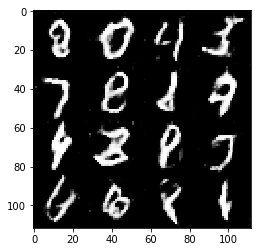

Epoch 1/2... Generator Loss: 1.2622 Discriminator Loss: 0.8657...
Epoch 1/2... Generator Loss: 0.8538 Discriminator Loss: 0.9832...
Epoch 1/2... Generator Loss: 0.8405 Discriminator Loss: 0.8824...
Epoch 1/2... Generator Loss: 0.9525 Discriminator Loss: 1.0668...
Epoch 1/2... Generator Loss: 0.7392 Discriminator Loss: 0.9206...
Epoch 1/2... Generator Loss: 0.3579 Discriminator Loss: 1.6701...
Epoch 1/2... Generator Loss: 1.0550 Discriminator Loss: 1.1138...
Epoch 1/2... Generator Loss: 0.5335 Discriminator Loss: 1.4500...
Epoch 1/2... Generator Loss: 1.3909 Discriminator Loss: 0.7789...
Epoch 1/2... Generator Loss: 1.3723 Discriminator Loss: 0.9393...


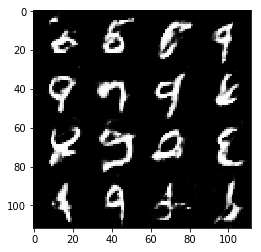

Epoch 1/2... Generator Loss: 0.5064 Discriminator Loss: 1.7019...
Epoch 1/2... Generator Loss: 1.2028 Discriminator Loss: 0.8618...
Epoch 1/2... Generator Loss: 1.6353 Discriminator Loss: 0.8117...
Epoch 1/2... Generator Loss: 0.3107 Discriminator Loss: 2.1572...
Epoch 1/2... Generator Loss: 0.8206 Discriminator Loss: 1.2550...
Epoch 1/2... Generator Loss: 0.9730 Discriminator Loss: 0.9557...
Epoch 1/2... Generator Loss: 1.5496 Discriminator Loss: 0.6898...
Epoch 1/2... Generator Loss: 0.6615 Discriminator Loss: 1.2170...
Epoch 1/2... Generator Loss: 1.0781 Discriminator Loss: 0.9492...
Epoch 1/2... Generator Loss: 0.4816 Discriminator Loss: 1.5984...


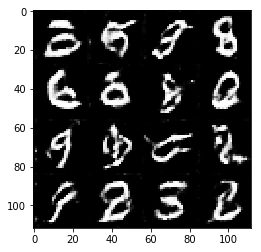

Epoch 1/2... Generator Loss: 0.5384 Discriminator Loss: 1.4095...
Epoch 1/2... Generator Loss: 1.8080 Discriminator Loss: 0.6403...
Epoch 1/2... Generator Loss: 0.7173 Discriminator Loss: 1.4368...
Epoch 1/2... Generator Loss: 2.0739 Discriminator Loss: 0.7341...
Epoch 1/2... Generator Loss: 0.5739 Discriminator Loss: 1.4031...
Epoch 1/2... Generator Loss: 1.3865 Discriminator Loss: 0.7308...
Epoch 1/2... Generator Loss: 1.5220 Discriminator Loss: 0.6338...
Epoch 1/2... Generator Loss: 1.3853 Discriminator Loss: 0.9179...
Epoch 1/2... Generator Loss: 1.0883 Discriminator Loss: 1.1305...
Epoch 1/2... Generator Loss: 1.1014 Discriminator Loss: 0.8434...


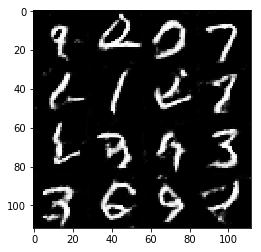

Epoch 1/2... Generator Loss: 0.7675 Discriminator Loss: 1.2549...
Epoch 1/2... Generator Loss: 1.2500 Discriminator Loss: 0.9405...
Epoch 1/2... Generator Loss: 1.8405 Discriminator Loss: 0.6662...
Epoch 1/2... Generator Loss: 0.8254 Discriminator Loss: 1.1884...
Epoch 1/2... Generator Loss: 0.8783 Discriminator Loss: 1.1079...
Epoch 1/2... Generator Loss: 1.2173 Discriminator Loss: 0.8230...
Epoch 1/2... Generator Loss: 0.8907 Discriminator Loss: 1.1083...
Epoch 1/2... Generator Loss: 0.8492 Discriminator Loss: 1.2828...
Epoch 1/2... Generator Loss: 0.8194 Discriminator Loss: 1.1977...
Epoch 1/2... Generator Loss: 0.9141 Discriminator Loss: 1.0544...


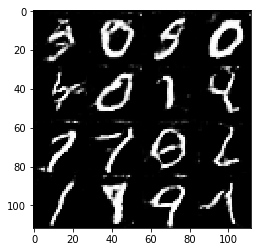

Epoch 1/2... Generator Loss: 1.4071 Discriminator Loss: 0.8665...
Epoch 1/2... Generator Loss: 1.2782 Discriminator Loss: 0.9080...
Epoch 1/2... Generator Loss: 1.6779 Discriminator Loss: 0.6066...
Epoch 1/2... Generator Loss: 1.0463 Discriminator Loss: 1.1854...
Epoch 1/2... Generator Loss: 0.7875 Discriminator Loss: 1.1420...
Epoch 1/2... Generator Loss: 1.1346 Discriminator Loss: 0.9397...
Epoch 1/2... Generator Loss: 1.3674 Discriminator Loss: 0.9596...
Epoch 1/2... Generator Loss: 1.3065 Discriminator Loss: 0.9608...
Epoch 1/2... Generator Loss: 0.9252 Discriminator Loss: 1.3318...
Epoch 1/2... Generator Loss: 1.2803 Discriminator Loss: 0.8843...


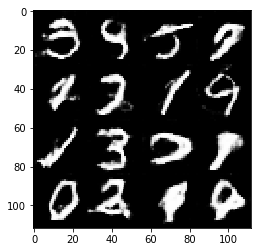

Epoch 1/2... Generator Loss: 1.4873 Discriminator Loss: 0.8003...
Epoch 1/2... Generator Loss: 0.6357 Discriminator Loss: 1.2866...
Epoch 1/2... Generator Loss: 0.9420 Discriminator Loss: 1.2448...
Epoch 1/2... Generator Loss: 1.4095 Discriminator Loss: 0.8174...
Epoch 1/2... Generator Loss: 1.7676 Discriminator Loss: 0.5607...
Epoch 1/2... Generator Loss: 0.8005 Discriminator Loss: 1.0067...
Epoch 1/2... Generator Loss: 0.8592 Discriminator Loss: 1.1850...
Epoch 1/2... Generator Loss: 1.2871 Discriminator Loss: 0.9769...
Epoch 1/2... Generator Loss: 1.0190 Discriminator Loss: 1.0038...
Epoch 1/2... Generator Loss: 1.1010 Discriminator Loss: 0.9555...


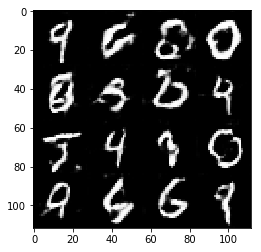

Epoch 1/2... Generator Loss: 1.1654 Discriminator Loss: 1.0050...
Epoch 1/2... Generator Loss: 0.9056 Discriminator Loss: 0.9856...
Epoch 1/2... Generator Loss: 1.0560 Discriminator Loss: 0.9416...
Epoch 1/2... Generator Loss: 0.3957 Discriminator Loss: 2.0904...
Epoch 1/2... Generator Loss: 1.0146 Discriminator Loss: 0.9938...
Epoch 1/2... Generator Loss: 1.2061 Discriminator Loss: 0.8116...
Epoch 1/2... Generator Loss: 1.2282 Discriminator Loss: 0.9473...
Epoch 1/2... Generator Loss: 2.3322 Discriminator Loss: 0.8852...
Epoch 1/2... Generator Loss: 0.5811 Discriminator Loss: 1.2989...
Epoch 1/2... Generator Loss: 1.6026 Discriminator Loss: 0.7493...


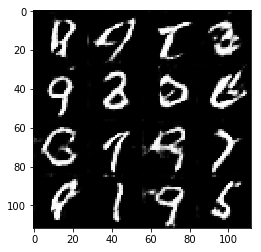

Epoch 1/2... Generator Loss: 1.1276 Discriminator Loss: 1.4007...
Epoch 1/2... Generator Loss: 1.4891 Discriminator Loss: 0.6431...
Epoch 1/2... Generator Loss: 0.5150 Discriminator Loss: 1.6005...
Epoch 1/2... Generator Loss: 1.3678 Discriminator Loss: 0.8088...
Epoch 1/2... Generator Loss: 0.8224 Discriminator Loss: 1.1640...
Epoch 1/2... Generator Loss: 0.9271 Discriminator Loss: 1.0710...
Epoch 1/2... Generator Loss: 1.2536 Discriminator Loss: 0.8987...
Epoch 1/2... Generator Loss: 1.7817 Discriminator Loss: 0.6822...
Epoch 1/2... Generator Loss: 1.3042 Discriminator Loss: 0.8540...
Epoch 1/2... Generator Loss: 0.8477 Discriminator Loss: 0.9924...


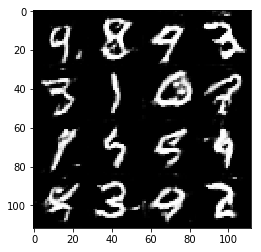

Epoch 1/2... Generator Loss: 1.7991 Discriminator Loss: 0.6064...
Epoch 1/2... Generator Loss: 0.9251 Discriminator Loss: 1.0668...
Epoch 1/2... Generator Loss: 1.4117 Discriminator Loss: 1.2061...
Epoch 1/2... Generator Loss: 0.7676 Discriminator Loss: 1.3877...
Epoch 1/2... Generator Loss: 1.2988 Discriminator Loss: 0.6705...
Epoch 1/2... Generator Loss: 1.8027 Discriminator Loss: 0.8365...
Epoch 1/2... Generator Loss: 1.3952 Discriminator Loss: 0.8726...
Epoch 1/2... Generator Loss: 1.6229 Discriminator Loss: 0.8568...
Epoch 1/2... Generator Loss: 0.9125 Discriminator Loss: 1.1838...
Epoch 1/2... Generator Loss: 1.7118 Discriminator Loss: 0.7500...


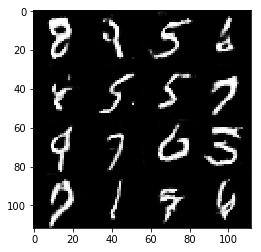

Epoch 1/2... Generator Loss: 0.9570 Discriminator Loss: 0.9490...
Epoch 1/2... Generator Loss: 2.2483 Discriminator Loss: 0.5318...
Epoch 1/2... Generator Loss: 1.4095 Discriminator Loss: 0.8756...
Epoch 1/2... Generator Loss: 1.3636 Discriminator Loss: 0.9030...
Epoch 1/2... Generator Loss: 1.3235 Discriminator Loss: 0.8879...
Epoch 1/2... Generator Loss: 1.2476 Discriminator Loss: 0.8642...
Epoch 1/2... Generator Loss: 0.9809 Discriminator Loss: 0.8430...
Epoch 1/2... Generator Loss: 0.9295 Discriminator Loss: 0.9753...
Epoch 1/2... Generator Loss: 0.8937 Discriminator Loss: 1.1219...
Epoch 1/2... Generator Loss: 0.4338 Discriminator Loss: 1.3877...


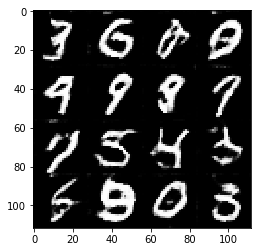

Epoch 1/2... Generator Loss: 0.7032 Discriminator Loss: 1.4563...
Epoch 1/2... Generator Loss: 1.1568 Discriminator Loss: 0.8714...
Epoch 1/2... Generator Loss: 1.0304 Discriminator Loss: 1.1112...
Epoch 1/2... Generator Loss: 0.9605 Discriminator Loss: 0.9664...
Epoch 1/2... Generator Loss: 1.1021 Discriminator Loss: 0.9260...
Epoch 1/2... Generator Loss: 1.3195 Discriminator Loss: 0.7818...
Epoch 1/2... Generator Loss: 1.5418 Discriminator Loss: 0.8169...
Epoch 1/2... Generator Loss: 1.2069 Discriminator Loss: 0.8945...
Epoch 1/2... Generator Loss: 2.1276 Discriminator Loss: 0.6655...
Epoch 1/2... Generator Loss: 1.5004 Discriminator Loss: 0.7289...


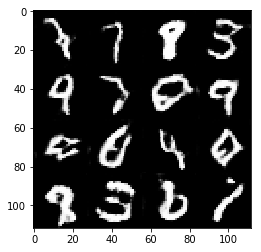

Epoch 1/2... Generator Loss: 1.1523 Discriminator Loss: 0.7940...
Epoch 1/2... Generator Loss: 1.2188 Discriminator Loss: 0.8185...
Epoch 1/2... Generator Loss: 0.8398 Discriminator Loss: 1.1808...
Epoch 1/2... Generator Loss: 0.7730 Discriminator Loss: 1.2263...
Epoch 1/2... Generator Loss: 1.9897 Discriminator Loss: 0.8356...
Epoch 1/2... Generator Loss: 0.6745 Discriminator Loss: 1.0165...
Epoch 1/2... Generator Loss: 1.9499 Discriminator Loss: 0.7653...
Epoch 1/2... Generator Loss: 1.2680 Discriminator Loss: 0.9213...
Epoch 1/2... Generator Loss: 1.0927 Discriminator Loss: 0.8265...
Epoch 1/2... Generator Loss: 1.8883 Discriminator Loss: 0.6177...


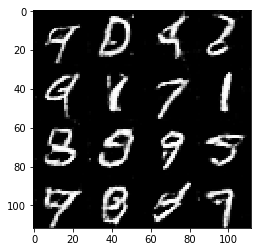

Epoch 1/2... Generator Loss: 1.3642 Discriminator Loss: 0.7674...
Epoch 1/2... Generator Loss: 1.7456 Discriminator Loss: 0.7978...
Epoch 1/2... Generator Loss: 0.9589 Discriminator Loss: 0.8894...
Epoch 1/2... Generator Loss: 1.0371 Discriminator Loss: 0.8971...
Epoch 1/2... Generator Loss: 1.0676 Discriminator Loss: 0.8429...
Epoch 1/2... Generator Loss: 0.4149 Discriminator Loss: 1.6678...
Epoch 1/2... Generator Loss: 0.5101 Discriminator Loss: 1.4623...
Epoch 1/2... Generator Loss: 2.2877 Discriminator Loss: 1.0123...
Epoch 1/2... Generator Loss: 0.8225 Discriminator Loss: 0.9023...
Epoch 1/2... Generator Loss: 1.0590 Discriminator Loss: 0.9134...


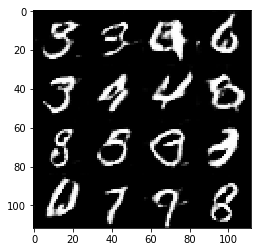

Epoch 1/2... Generator Loss: 1.0105 Discriminator Loss: 0.9550...
Epoch 1/2... Generator Loss: 1.3605 Discriminator Loss: 0.6341...
Epoch 1/2... Generator Loss: 2.0954 Discriminator Loss: 0.6657...
Epoch 1/2... Generator Loss: 1.2751 Discriminator Loss: 0.6642...
Epoch 1/2... Generator Loss: 1.4217 Discriminator Loss: 0.8148...
Epoch 1/2... Generator Loss: 1.2735 Discriminator Loss: 0.9235...
Epoch 1/2... Generator Loss: 1.8371 Discriminator Loss: 0.6579...
Epoch 1/2... Generator Loss: 1.4222 Discriminator Loss: 0.8643...
Epoch 1/2... Generator Loss: 1.4297 Discriminator Loss: 0.7881...
Epoch 1/2... Generator Loss: 1.7527 Discriminator Loss: 0.5595...


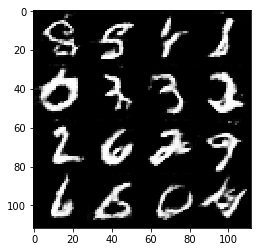

Epoch 1/2... Generator Loss: 1.6587 Discriminator Loss: 0.7113...
Epoch 1/2... Generator Loss: 0.7911 Discriminator Loss: 1.2182...
Epoch 1/2... Generator Loss: 1.1090 Discriminator Loss: 0.9604...
Epoch 1/2... Generator Loss: 1.8592 Discriminator Loss: 0.6578...
Epoch 1/2... Generator Loss: 2.1184 Discriminator Loss: 0.6841...
Epoch 1/2... Generator Loss: 1.2416 Discriminator Loss: 0.9092...
Epoch 1/2... Generator Loss: 1.4808 Discriminator Loss: 0.7426...
Epoch 1/2... Generator Loss: 2.0841 Discriminator Loss: 0.6274...
Epoch 1/2... Generator Loss: 1.5457 Discriminator Loss: 0.9389...
Epoch 1/2... Generator Loss: 0.5382 Discriminator Loss: 1.5838...


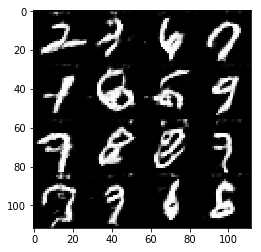

Epoch 1/2... Generator Loss: 1.0413 Discriminator Loss: 0.9526...
Epoch 1/2... Generator Loss: 2.4948 Discriminator Loss: 0.8982...
Epoch 1/2... Generator Loss: 0.9037 Discriminator Loss: 0.9189...
Epoch 1/2... Generator Loss: 2.0343 Discriminator Loss: 0.8190...
Epoch 1/2... Generator Loss: 1.5908 Discriminator Loss: 0.6136...
Epoch 1/2... Generator Loss: 1.2618 Discriminator Loss: 0.9596...
Epoch 1/2... Generator Loss: 0.8972 Discriminator Loss: 1.0189...
Epoch 1/2... Generator Loss: 0.8097 Discriminator Loss: 0.8581...
Epoch 1/2... Generator Loss: 0.7260 Discriminator Loss: 1.5118...
Epoch 1/2... Generator Loss: 2.4576 Discriminator Loss: 0.6088...


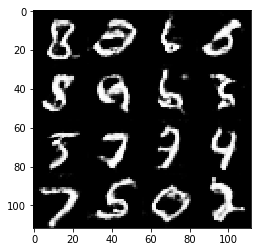

Epoch 1/2... Generator Loss: 1.4070 Discriminator Loss: 0.7305...
Epoch 1/2... Generator Loss: 0.6445 Discriminator Loss: 1.3525...
Epoch 1/2... Generator Loss: 1.3276 Discriminator Loss: 0.9306...
Epoch 1/2... Generator Loss: 2.0178 Discriminator Loss: 0.5942...
Epoch 1/2... Generator Loss: 1.1314 Discriminator Loss: 1.1133...
Epoch 1/2... Generator Loss: 0.8913 Discriminator Loss: 1.0414...
Epoch 1/2... Generator Loss: 1.2032 Discriminator Loss: 0.7660...
Epoch 1/2... Generator Loss: 1.4054 Discriminator Loss: 0.8633...
Epoch 1/2... Generator Loss: 1.5154 Discriminator Loss: 0.8856...
Epoch 1/2... Generator Loss: 1.0493 Discriminator Loss: 0.9001...


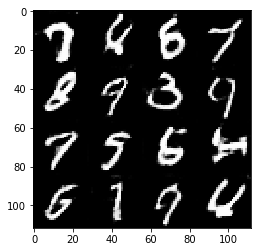

Epoch 1/2... Generator Loss: 2.6342 Discriminator Loss: 0.4669...
Epoch 1/2... Generator Loss: 2.1138 Discriminator Loss: 0.8320...
Epoch 1/2... Generator Loss: 1.2676 Discriminator Loss: 0.6933...
Epoch 1/2... Generator Loss: 0.9858 Discriminator Loss: 1.1058...
Epoch 1/2... Generator Loss: 0.7767 Discriminator Loss: 0.9109...
Epoch 1/2... Generator Loss: 1.2845 Discriminator Loss: 1.0390...
Epoch 1/2... Generator Loss: 2.0682 Discriminator Loss: 0.5490...
Epoch 1/2... Generator Loss: 1.3141 Discriminator Loss: 0.7004...
Epoch 1/2... Generator Loss: 0.5102 Discriminator Loss: 1.7452...
Epoch 1/2... Generator Loss: 0.5459 Discriminator Loss: 1.1633...


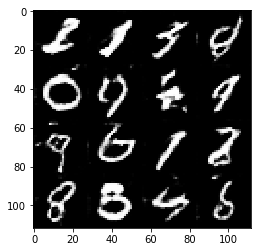

Epoch 1/2... Generator Loss: 1.3226 Discriminator Loss: 0.7159...
Epoch 1/2... Generator Loss: 2.3651 Discriminator Loss: 0.4523...
Epoch 1/2... Generator Loss: 0.8031 Discriminator Loss: 1.1350...
Epoch 1/2... Generator Loss: 1.9214 Discriminator Loss: 0.5224...
Epoch 1/2... Generator Loss: 2.2430 Discriminator Loss: 0.4709...
Epoch 1/2... Generator Loss: 2.8006 Discriminator Loss: 0.4763...
Epoch 1/2... Generator Loss: 1.6482 Discriminator Loss: 0.5866...
Epoch 1/2... Generator Loss: 0.4954 Discriminator Loss: 1.2344...
Epoch 1/2... Generator Loss: 0.7134 Discriminator Loss: 1.1036...
Epoch 1/2... Generator Loss: 0.7819 Discriminator Loss: 1.4203...


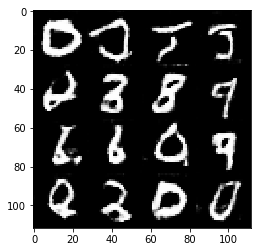

Epoch 1/2... Generator Loss: 1.2003 Discriminator Loss: 0.8941...
Epoch 1/2... Generator Loss: 1.4827 Discriminator Loss: 0.6878...
Epoch 1/2... Generator Loss: 1.3912 Discriminator Loss: 0.6874...
Epoch 1/2... Generator Loss: 1.0983 Discriminator Loss: 1.1072...
Epoch 1/2... Generator Loss: 1.0287 Discriminator Loss: 0.7829...
Epoch 1/2... Generator Loss: 1.8682 Discriminator Loss: 0.7819...
Epoch 1/2... Generator Loss: 2.6828 Discriminator Loss: 0.4750...
Epoch 1/2... Generator Loss: 0.7294 Discriminator Loss: 0.9850...
Epoch 1/2... Generator Loss: 0.5783 Discriminator Loss: 1.2945...
Epoch 1/2... Generator Loss: 1.4592 Discriminator Loss: 0.7893...


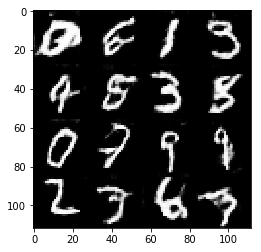

Epoch 1/2... Generator Loss: 1.9925 Discriminator Loss: 0.7583...
Epoch 1/2... Generator Loss: 1.3672 Discriminator Loss: 0.7530...
Epoch 1/2... Generator Loss: 2.8297 Discriminator Loss: 0.4972...
Epoch 1/2... Generator Loss: 2.0905 Discriminator Loss: 0.5540...
Epoch 1/2... Generator Loss: 1.5438 Discriminator Loss: 0.8983...
Epoch 1/2... Generator Loss: 1.6830 Discriminator Loss: 0.5176...
Epoch 1/2... Generator Loss: 1.0563 Discriminator Loss: 1.2511...
Epoch 1/2... Generator Loss: 0.8690 Discriminator Loss: 0.9474...
Epoch 1/2... Generator Loss: 1.1736 Discriminator Loss: 1.1964...
Epoch 1/2... Generator Loss: 1.2023 Discriminator Loss: 0.6825...


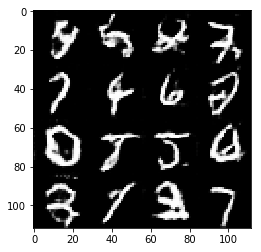

Epoch 1/2... Generator Loss: 2.4817 Discriminator Loss: 0.5128...
Epoch 1/2... Generator Loss: 1.3565 Discriminator Loss: 0.8214...
Epoch 1/2... Generator Loss: 1.0348 Discriminator Loss: 0.9685...
Epoch 1/2... Generator Loss: 1.2254 Discriminator Loss: 0.9347...
Epoch 1/2... Generator Loss: 1.1205 Discriminator Loss: 1.0207...
Epoch 1/2... Generator Loss: 0.9344 Discriminator Loss: 1.0574...
Epoch 1/2... Generator Loss: 0.6875 Discriminator Loss: 1.0685...
Epoch 1/2... Generator Loss: 0.8933 Discriminator Loss: 1.1405...
Epoch 1/2... Generator Loss: 1.8216 Discriminator Loss: 0.7071...
Epoch 1/2... Generator Loss: 0.9373 Discriminator Loss: 1.0855...


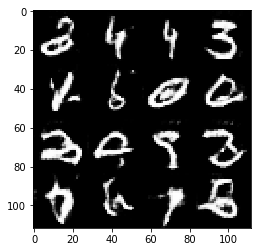

Epoch 1/2... Generator Loss: 0.7028 Discriminator Loss: 1.1028...
Epoch 1/2... Generator Loss: 2.0501 Discriminator Loss: 0.5672...
Epoch 1/2... Generator Loss: 1.1695 Discriminator Loss: 0.9801...
Epoch 1/2... Generator Loss: 1.5026 Discriminator Loss: 0.9123...
Epoch 1/2... Generator Loss: 2.0612 Discriminator Loss: 0.7758...
Epoch 1/2... Generator Loss: 1.2272 Discriminator Loss: 0.7821...
Epoch 1/2... Generator Loss: 1.4111 Discriminator Loss: 0.7586...
Epoch 1/2... Generator Loss: 0.9443 Discriminator Loss: 0.9652...
Epoch 1/2... Generator Loss: 1.2592 Discriminator Loss: 0.9661...
Epoch 1/2... Generator Loss: 1.3620 Discriminator Loss: 0.9201...


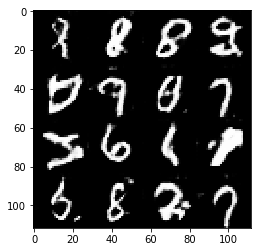

Epoch 1/2... Generator Loss: 0.8535 Discriminator Loss: 0.8470...
Epoch 1/2... Generator Loss: 2.0724 Discriminator Loss: 0.6877...
Epoch 1/2... Generator Loss: 1.3928 Discriminator Loss: 0.6433...
Epoch 1/2... Generator Loss: 0.7133 Discriminator Loss: 1.1774...
Epoch 1/2... Generator Loss: 1.2517 Discriminator Loss: 1.1544...
Epoch 1/2... Generator Loss: 0.9576 Discriminator Loss: 1.0547...
Epoch 1/2... Generator Loss: 1.0363 Discriminator Loss: 0.9804...
Epoch 1/2... Generator Loss: 2.5080 Discriminator Loss: 0.6349...
Epoch 1/2... Generator Loss: 2.0402 Discriminator Loss: 0.5964...
Epoch 1/2... Generator Loss: 1.8379 Discriminator Loss: 0.6750...


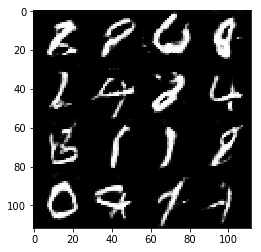

Epoch 1/2... Generator Loss: 1.3087 Discriminator Loss: 1.0220...
Epoch 1/2... Generator Loss: 1.8527 Discriminator Loss: 0.6770...
Epoch 1/2... Generator Loss: 2.0204 Discriminator Loss: 0.5841...
Epoch 1/2... Generator Loss: 1.3885 Discriminator Loss: 0.7893...
Epoch 1/2... Generator Loss: 1.7785 Discriminator Loss: 0.6634...
Epoch 1/2... Generator Loss: 1.8470 Discriminator Loss: 0.7455...
Epoch 1/2... Generator Loss: 2.1800 Discriminator Loss: 0.6036...
Epoch 1/2... Generator Loss: 1.8412 Discriminator Loss: 0.9209...
Epoch 1/2... Generator Loss: 1.3437 Discriminator Loss: 0.8387...
Epoch 1/2... Generator Loss: 1.6858 Discriminator Loss: 0.7129...


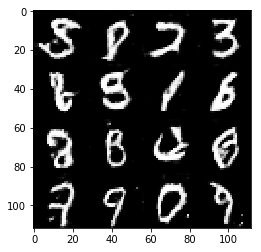

Epoch 1/2... Generator Loss: 2.8818 Discriminator Loss: 0.5163...
Epoch 1/2... Generator Loss: 2.0567 Discriminator Loss: 0.6850...
Epoch 1/2... Generator Loss: 1.5682 Discriminator Loss: 0.7867...
Epoch 1/2... Generator Loss: 1.4065 Discriminator Loss: 0.5975...
Epoch 1/2... Generator Loss: 1.7131 Discriminator Loss: 0.8578...
Epoch 1/2... Generator Loss: 3.2242 Discriminator Loss: 0.4632...
Epoch 1/2... Generator Loss: 3.0359 Discriminator Loss: 0.4917...
Epoch 1/2... Generator Loss: 1.4649 Discriminator Loss: 0.7226...
Epoch 1/2... Generator Loss: 2.1354 Discriminator Loss: 0.6405...
Epoch 1/2... Generator Loss: 0.9540 Discriminator Loss: 1.2275...


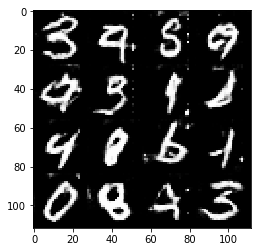

Epoch 1/2... Generator Loss: 2.3887 Discriminator Loss: 0.6479...
Epoch 1/2... Generator Loss: 1.9480 Discriminator Loss: 0.6420...
Epoch 1/2... Generator Loss: 1.5789 Discriminator Loss: 0.8069...
Epoch 1/2... Generator Loss: 1.4376 Discriminator Loss: 0.7006...
Epoch 1/2... Generator Loss: 1.3410 Discriminator Loss: 0.8668...
Epoch 1/2... Generator Loss: 1.0641 Discriminator Loss: 1.0401...
Epoch 1/2... Generator Loss: 2.1373 Discriminator Loss: 0.4621...
Epoch 1/2... Generator Loss: 1.6169 Discriminator Loss: 0.7239...
Epoch 1/2... Generator Loss: 1.4896 Discriminator Loss: 0.7050...
Epoch 1/2... Generator Loss: 1.3063 Discriminator Loss: 0.6756...


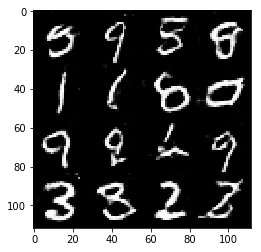

Epoch 1/2... Generator Loss: 2.3214 Discriminator Loss: 0.4774...
Epoch 1/2... Generator Loss: 1.0643 Discriminator Loss: 0.9057...
Epoch 1/2... Generator Loss: 0.8958 Discriminator Loss: 1.1086...
Epoch 1/2... Generator Loss: 2.4595 Discriminator Loss: 0.6502...
Epoch 1/2... Generator Loss: 1.5841 Discriminator Loss: 0.8888...
Epoch 1/2... Generator Loss: 2.4333 Discriminator Loss: 0.5961...
Epoch 1/2... Generator Loss: 0.8797 Discriminator Loss: 1.2791...
Epoch 1/2... Generator Loss: 1.6861 Discriminator Loss: 0.7091...
Epoch 1/2... Generator Loss: 0.4791 Discriminator Loss: 1.4339...
Epoch 1/2... Generator Loss: 2.0524 Discriminator Loss: 0.5902...


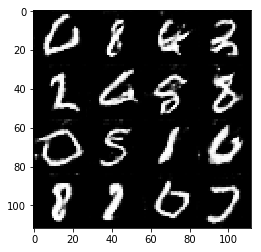

Epoch 1/2... Generator Loss: 1.5290 Discriminator Loss: 0.7108...
Epoch 1/2... Generator Loss: 1.8770 Discriminator Loss: 0.6466...
Epoch 1/2... Generator Loss: 1.8271 Discriminator Loss: 0.8369...
Epoch 1/2... Generator Loss: 1.7271 Discriminator Loss: 0.6658...
Epoch 1/2... Generator Loss: 1.5569 Discriminator Loss: 0.8078...
Epoch 1/2... Generator Loss: 1.5806 Discriminator Loss: 0.8444...
Epoch 1/2... Generator Loss: 3.1246 Discriminator Loss: 0.4481...
Epoch 1/2... Generator Loss: 1.6421 Discriminator Loss: 0.6943...
Epoch 1/2... Generator Loss: 1.2412 Discriminator Loss: 0.7468...
Epoch 1/2... Generator Loss: 1.1340 Discriminator Loss: 0.8505...


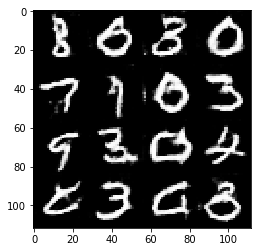

Epoch 1/2... Generator Loss: 1.2801 Discriminator Loss: 0.7780...
Epoch 1/2... Generator Loss: 1.1989 Discriminator Loss: 1.0725...
Epoch 1/2... Generator Loss: 1.1949 Discriminator Loss: 0.8353...
Epoch 1/2... Generator Loss: 2.4785 Discriminator Loss: 0.5378...
Epoch 1/2... Generator Loss: 2.4221 Discriminator Loss: 0.4961...
Epoch 1/2... Generator Loss: 1.6340 Discriminator Loss: 0.8112...
Epoch 1/2... Generator Loss: 1.7329 Discriminator Loss: 0.8218...
Epoch 1/2... Generator Loss: 1.6894 Discriminator Loss: 0.5329...
Epoch 1/2... Generator Loss: 2.1874 Discriminator Loss: 0.7393...
Epoch 1/2... Generator Loss: 1.6733 Discriminator Loss: 0.7488...


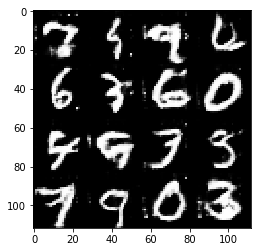

Epoch 1/2... Generator Loss: 0.7229 Discriminator Loss: 1.0850...
Epoch 1/2... Generator Loss: 2.6024 Discriminator Loss: 0.5827...
Epoch 1/2... Generator Loss: 2.4225 Discriminator Loss: 0.7345...
Epoch 1/2... Generator Loss: 1.4328 Discriminator Loss: 0.7963...
Epoch 1/2... Generator Loss: 1.1341 Discriminator Loss: 0.7916...
Epoch 1/2... Generator Loss: 2.3797 Discriminator Loss: 0.7336...
Epoch 1/2... Generator Loss: 1.5741 Discriminator Loss: 0.7384...
Epoch 1/2... Generator Loss: 2.3728 Discriminator Loss: 0.7028...
Epoch 1/2... Generator Loss: 2.0288 Discriminator Loss: 0.6597...
Epoch 1/2... Generator Loss: 1.4347 Discriminator Loss: 0.6782...


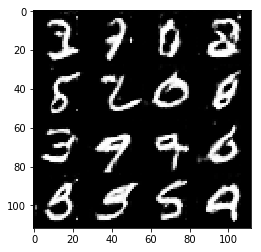

Epoch 1/2... Generator Loss: 2.4455 Discriminator Loss: 0.6289...
Epoch 1/2... Generator Loss: 1.1396 Discriminator Loss: 1.0342...
Epoch 1/2... Generator Loss: 1.0986 Discriminator Loss: 0.8037...
Epoch 1/2... Generator Loss: 1.4677 Discriminator Loss: 0.8931...
Epoch 1/2... Generator Loss: 0.8641 Discriminator Loss: 1.1743...
Epoch 1/2... Generator Loss: 1.0702 Discriminator Loss: 0.7494...
Epoch 1/2... Generator Loss: 1.5543 Discriminator Loss: 0.7707...
Epoch 1/2... Generator Loss: 1.8521 Discriminator Loss: 0.4743...
Epoch 1/2... Generator Loss: 1.0212 Discriminator Loss: 0.7122...
Epoch 1/2... Generator Loss: 1.2820 Discriminator Loss: 0.8311...


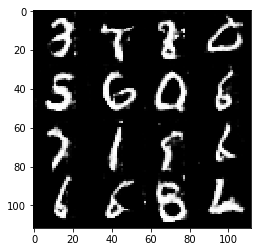

Epoch 1/2... Generator Loss: 0.8437 Discriminator Loss: 1.2852...
Epoch 1/2... Generator Loss: 2.6447 Discriminator Loss: 0.5303...
Epoch 1/2... Generator Loss: 1.1768 Discriminator Loss: 0.9097...
Epoch 1/2... Generator Loss: 1.8150 Discriminator Loss: 0.7411...
Epoch 1/2... Generator Loss: 3.5734 Discriminator Loss: 0.8242...
Epoch 1/2... Generator Loss: 1.8256 Discriminator Loss: 0.6686...
Epoch 1/2... Generator Loss: 1.1128 Discriminator Loss: 0.7761...
Epoch 1/2... Generator Loss: 2.4250 Discriminator Loss: 0.6230...
Epoch 1/2... Generator Loss: 2.2645 Discriminator Loss: 0.6945...
Epoch 1/2... Generator Loss: 1.0336 Discriminator Loss: 1.1899...


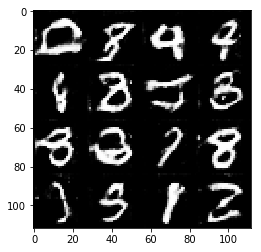

Epoch 1/2... Generator Loss: 1.1609 Discriminator Loss: 0.7477...
Epoch 1/2... Generator Loss: 2.7184 Discriminator Loss: 0.5405...
Epoch 1/2... Generator Loss: 2.5569 Discriminator Loss: 0.6341...
Epoch 1/2... Generator Loss: 1.7459 Discriminator Loss: 0.6936...
Epoch 1/2... Generator Loss: 2.7066 Discriminator Loss: 0.4851...
Epoch 1/2... Generator Loss: 1.8413 Discriminator Loss: 0.6420...
Epoch 1/2... Generator Loss: 1.8546 Discriminator Loss: 0.6919...
Epoch 1/2... Generator Loss: 1.7554 Discriminator Loss: 0.7757...
Epoch 1/2... Generator Loss: 2.1816 Discriminator Loss: 0.5930...
Epoch 1/2... Generator Loss: 3.0913 Discriminator Loss: 0.4417...


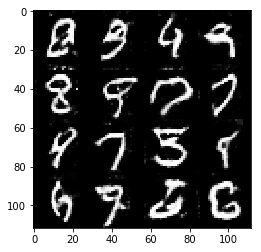

Epoch 1/2... Generator Loss: 3.0264 Discriminator Loss: 0.7723...
Epoch 1/2... Generator Loss: 2.6139 Discriminator Loss: 0.4594...
Epoch 1/2... Generator Loss: 1.5692 Discriminator Loss: 0.8241...
Epoch 1/2... Generator Loss: 1.4743 Discriminator Loss: 0.8060...
Epoch 1/2... Generator Loss: 3.1785 Discriminator Loss: 0.4515...
Epoch 1/2... Generator Loss: 2.5242 Discriminator Loss: 0.5080...
Epoch 1/2... Generator Loss: 1.2700 Discriminator Loss: 0.5981...
Epoch 1/2... Generator Loss: 2.5929 Discriminator Loss: 0.4626...
Epoch 1/2... Generator Loss: 1.0276 Discriminator Loss: 1.3303...
Epoch 1/2... Generator Loss: 2.8637 Discriminator Loss: 0.5162...


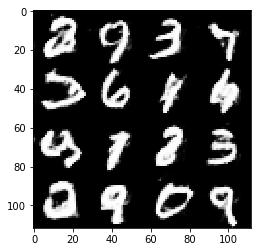

Epoch 1/2... Generator Loss: 2.0772 Discriminator Loss: 0.5339...
Epoch 1/2... Generator Loss: 1.6268 Discriminator Loss: 0.8159...
Epoch 1/2... Generator Loss: 2.1754 Discriminator Loss: 0.5872...
Epoch 1/2... Generator Loss: 1.9250 Discriminator Loss: 0.5944...
Epoch 1/2... Generator Loss: 1.4355 Discriminator Loss: 0.6232...
Epoch 1/2... Generator Loss: 1.6160 Discriminator Loss: 0.6640...
Epoch 1/2... Generator Loss: 1.3582 Discriminator Loss: 0.8006...
Epoch 1/2... Generator Loss: 1.5459 Discriminator Loss: 0.8478...
Epoch 1/2... Generator Loss: 1.2304 Discriminator Loss: 0.7748...
Epoch 1/2... Generator Loss: 2.7945 Discriminator Loss: 0.4845...


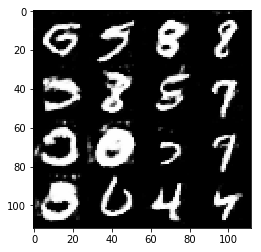

Epoch 1/2... Generator Loss: 2.2687 Discriminator Loss: 0.5444...
Epoch 1/2... Generator Loss: 1.8699 Discriminator Loss: 0.4987...
Epoch 1/2... Generator Loss: 2.1669 Discriminator Loss: 0.5600...
Epoch 1/2... Generator Loss: 1.3078 Discriminator Loss: 0.8123...
Epoch 1/2... Generator Loss: 1.1251 Discriminator Loss: 0.9901...
Epoch 1/2... Generator Loss: 2.6636 Discriminator Loss: 0.4699...
Epoch 1/2... Generator Loss: 1.3639 Discriminator Loss: 0.7293...
Epoch 1/2... Generator Loss: 1.0050 Discriminator Loss: 0.8272...
Epoch 1/2... Generator Loss: 1.6695 Discriminator Loss: 0.6889...
Epoch 1/2... Generator Loss: 1.1943 Discriminator Loss: 0.8853...


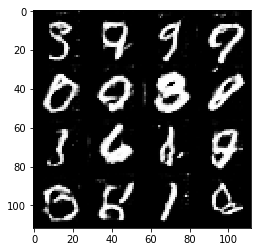

Epoch 1/2... Generator Loss: 2.2385 Discriminator Loss: 0.5887...
Epoch 1/2... Generator Loss: 1.0728 Discriminator Loss: 1.2172...
Epoch 1/2... Generator Loss: 1.2427 Discriminator Loss: 0.8143...
Epoch 1/2... Generator Loss: 2.2119 Discriminator Loss: 0.5433...
Epoch 1/2... Generator Loss: 2.5077 Discriminator Loss: 0.5313...
Epoch 1/2... Generator Loss: 3.0412 Discriminator Loss: 0.4962...
Epoch 1/2... Generator Loss: 1.8574 Discriminator Loss: 0.7077...
Epoch 1/2... Generator Loss: 0.5533 Discriminator Loss: 1.5472...
Epoch 1/2... Generator Loss: 1.0457 Discriminator Loss: 0.7643...
Epoch 1/2... Generator Loss: 1.6161 Discriminator Loss: 0.5302...


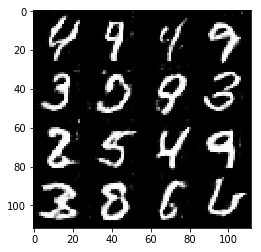

Epoch 1/2... Generator Loss: 2.0078 Discriminator Loss: 0.5935...
Epoch 1/2... Generator Loss: 2.6760 Discriminator Loss: 0.5899...
Epoch 1/2... Generator Loss: 0.9614 Discriminator Loss: 1.2208...
Epoch 1/2... Generator Loss: 0.6772 Discriminator Loss: 1.4460...
Epoch 1/2... Generator Loss: 0.7864 Discriminator Loss: 1.3333...
Epoch 1/2... Generator Loss: 2.1566 Discriminator Loss: 1.1702...
Epoch 1/2... Generator Loss: 2.4971 Discriminator Loss: 0.5455...
Epoch 1/2... Generator Loss: 1.3618 Discriminator Loss: 0.7485...
Epoch 1/2... Generator Loss: 2.3349 Discriminator Loss: 0.5339...
Epoch 1/2... Generator Loss: 1.1303 Discriminator Loss: 1.0709...


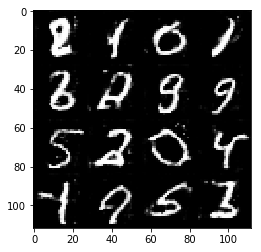

Epoch 1/2... Generator Loss: 0.8156 Discriminator Loss: 0.9058...
Epoch 1/2... Generator Loss: 1.1043 Discriminator Loss: 0.9197...
Epoch 1/2... Generator Loss: 1.7057 Discriminator Loss: 0.6531...
Epoch 1/2... Generator Loss: 1.0189 Discriminator Loss: 1.3114...
Epoch 1/2... Generator Loss: 0.7288 Discriminator Loss: 1.2391...
Epoch 1/2... Generator Loss: 1.6359 Discriminator Loss: 0.8824...
Epoch 1/2... Generator Loss: 2.0037 Discriminator Loss: 0.6571...
Epoch 1/2... Generator Loss: 3.0652 Discriminator Loss: 0.4417...
Epoch 1/2... Generator Loss: 0.8887 Discriminator Loss: 1.0742...
Epoch 1/2... Generator Loss: 2.0830 Discriminator Loss: 0.6444...


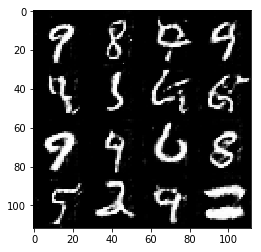

Epoch 2/2... Generator Loss: 1.4580 Discriminator Loss: 0.6650...
Epoch 2/2... Generator Loss: 1.3654 Discriminator Loss: 0.7242...
Epoch 2/2... Generator Loss: 3.3786 Discriminator Loss: 0.6258...
Epoch 2/2... Generator Loss: 3.6262 Discriminator Loss: 0.4421...
Epoch 2/2... Generator Loss: 0.8150 Discriminator Loss: 1.1925...
Epoch 2/2... Generator Loss: 2.4717 Discriminator Loss: 0.7120...
Epoch 2/2... Generator Loss: 1.5707 Discriminator Loss: 0.7020...
Epoch 2/2... Generator Loss: 1.3956 Discriminator Loss: 0.7597...
Epoch 2/2... Generator Loss: 1.2002 Discriminator Loss: 0.8422...
Epoch 2/2... Generator Loss: 1.6530 Discriminator Loss: 0.8808...


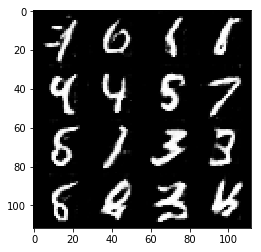

Epoch 2/2... Generator Loss: 1.6230 Discriminator Loss: 0.8485...
Epoch 2/2... Generator Loss: 2.5045 Discriminator Loss: 0.6173...
Epoch 2/2... Generator Loss: 1.0373 Discriminator Loss: 0.8352...
Epoch 2/2... Generator Loss: 2.2226 Discriminator Loss: 0.7360...
Epoch 2/2... Generator Loss: 0.4260 Discriminator Loss: 1.5714...
Epoch 2/2... Generator Loss: 2.2225 Discriminator Loss: 0.5592...
Epoch 2/2... Generator Loss: 1.7579 Discriminator Loss: 0.6354...
Epoch 2/2... Generator Loss: 1.8652 Discriminator Loss: 0.7143...
Epoch 2/2... Generator Loss: 1.6697 Discriminator Loss: 0.6622...
Epoch 2/2... Generator Loss: 0.8245 Discriminator Loss: 0.9225...


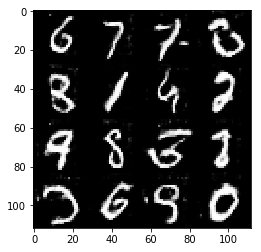

Epoch 2/2... Generator Loss: 0.9999 Discriminator Loss: 0.9457...
Epoch 2/2... Generator Loss: 2.1798 Discriminator Loss: 0.6172...
Epoch 2/2... Generator Loss: 0.8298 Discriminator Loss: 1.0678...
Epoch 2/2... Generator Loss: 2.4441 Discriminator Loss: 0.5254...
Epoch 2/2... Generator Loss: 2.3687 Discriminator Loss: 0.5220...
Epoch 2/2... Generator Loss: 2.4583 Discriminator Loss: 0.5310...
Epoch 2/2... Generator Loss: 1.6712 Discriminator Loss: 0.6277...
Epoch 2/2... Generator Loss: 1.0296 Discriminator Loss: 0.9504...
Epoch 2/2... Generator Loss: 1.8463 Discriminator Loss: 0.6457...
Epoch 2/2... Generator Loss: 1.9659 Discriminator Loss: 0.5938...


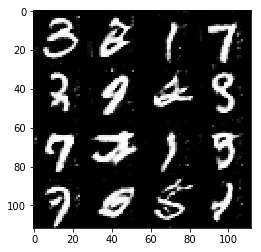

Epoch 2/2... Generator Loss: 0.7793 Discriminator Loss: 1.1365...
Epoch 2/2... Generator Loss: 1.8112 Discriminator Loss: 0.6476...
Epoch 2/2... Generator Loss: 1.2949 Discriminator Loss: 0.7992...
Epoch 2/2... Generator Loss: 1.0293 Discriminator Loss: 1.0610...
Epoch 2/2... Generator Loss: 1.8843 Discriminator Loss: 0.6964...
Epoch 2/2... Generator Loss: 2.3888 Discriminator Loss: 0.5017...
Epoch 2/2... Generator Loss: 1.3369 Discriminator Loss: 0.8819...
Epoch 2/2... Generator Loss: 1.2574 Discriminator Loss: 0.9980...
Epoch 2/2... Generator Loss: 1.8679 Discriminator Loss: 0.6252...
Epoch 2/2... Generator Loss: 1.4600 Discriminator Loss: 1.2287...


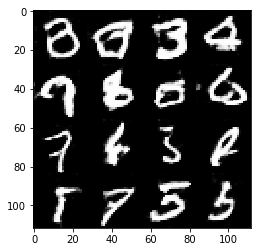

Epoch 2/2... Generator Loss: 1.2222 Discriminator Loss: 1.0216...
Epoch 2/2... Generator Loss: 1.5839 Discriminator Loss: 0.6345...
Epoch 2/2... Generator Loss: 1.9139 Discriminator Loss: 0.6027...
Epoch 2/2... Generator Loss: 1.2314 Discriminator Loss: 0.6605...
Epoch 2/2... Generator Loss: 1.7172 Discriminator Loss: 0.7866...
Epoch 2/2... Generator Loss: 2.2826 Discriminator Loss: 0.5924...
Epoch 2/2... Generator Loss: 1.7575 Discriminator Loss: 0.8856...
Epoch 2/2... Generator Loss: 1.8214 Discriminator Loss: 0.6843...
Epoch 2/2... Generator Loss: 2.1088 Discriminator Loss: 0.6376...
Epoch 2/2... Generator Loss: 1.6078 Discriminator Loss: 0.6485...


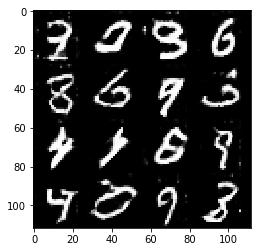

Epoch 2/2... Generator Loss: 2.5060 Discriminator Loss: 0.4970...
Epoch 2/2... Generator Loss: 0.9916 Discriminator Loss: 1.1184...
Epoch 2/2... Generator Loss: 3.5695 Discriminator Loss: 0.5189...
Epoch 2/2... Generator Loss: 1.8067 Discriminator Loss: 0.7115...
Epoch 2/2... Generator Loss: 0.7768 Discriminator Loss: 1.0891...
Epoch 2/2... Generator Loss: 1.2727 Discriminator Loss: 0.5995...
Epoch 2/2... Generator Loss: 1.5979 Discriminator Loss: 0.9075...
Epoch 2/2... Generator Loss: 1.8705 Discriminator Loss: 0.6418...
Epoch 2/2... Generator Loss: 2.5673 Discriminator Loss: 0.5322...
Epoch 2/2... Generator Loss: 2.1188 Discriminator Loss: 0.6493...


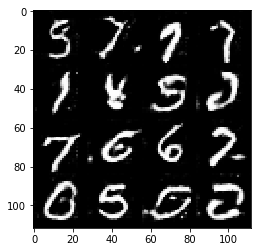

Epoch 2/2... Generator Loss: 1.4487 Discriminator Loss: 0.7999...
Epoch 2/2... Generator Loss: 1.5803 Discriminator Loss: 0.8977...
Epoch 2/2... Generator Loss: 2.3101 Discriminator Loss: 0.5366...
Epoch 2/2... Generator Loss: 3.2958 Discriminator Loss: 0.7355...
Epoch 2/2... Generator Loss: 1.6057 Discriminator Loss: 0.6305...
Epoch 2/2... Generator Loss: 1.8294 Discriminator Loss: 0.6654...
Epoch 2/2... Generator Loss: 1.9044 Discriminator Loss: 0.6449...
Epoch 2/2... Generator Loss: 1.9736 Discriminator Loss: 0.5421...
Epoch 2/2... Generator Loss: 2.0009 Discriminator Loss: 0.4984...
Epoch 2/2... Generator Loss: 1.2928 Discriminator Loss: 0.8800...


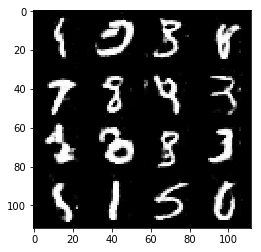

Epoch 2/2... Generator Loss: 1.5756 Discriminator Loss: 0.8414...
Epoch 2/2... Generator Loss: 2.4799 Discriminator Loss: 0.4863...
Epoch 2/2... Generator Loss: 1.5540 Discriminator Loss: 0.6063...
Epoch 2/2... Generator Loss: 1.7670 Discriminator Loss: 0.6433...
Epoch 2/2... Generator Loss: 2.4653 Discriminator Loss: 0.5488...
Epoch 2/2... Generator Loss: 1.2123 Discriminator Loss: 1.0296...
Epoch 2/2... Generator Loss: 0.8794 Discriminator Loss: 1.2209...
Epoch 2/2... Generator Loss: 1.4054 Discriminator Loss: 0.8727...
Epoch 2/2... Generator Loss: 1.8000 Discriminator Loss: 0.6144...
Epoch 2/2... Generator Loss: 0.9470 Discriminator Loss: 0.6877...


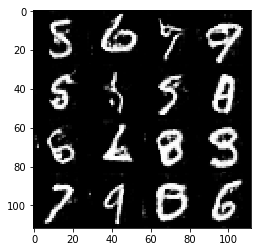

Epoch 2/2... Generator Loss: 1.5779 Discriminator Loss: 0.6779...
Epoch 2/2... Generator Loss: 2.0120 Discriminator Loss: 0.5399...
Epoch 2/2... Generator Loss: 3.6120 Discriminator Loss: 0.4597...
Epoch 2/2... Generator Loss: 1.8010 Discriminator Loss: 0.9600...
Epoch 2/2... Generator Loss: 1.2574 Discriminator Loss: 0.6728...
Epoch 2/2... Generator Loss: 1.2375 Discriminator Loss: 1.0157...
Epoch 2/2... Generator Loss: 0.9233 Discriminator Loss: 1.3851...
Epoch 2/2... Generator Loss: 0.9476 Discriminator Loss: 0.9302...
Epoch 2/2... Generator Loss: 0.9451 Discriminator Loss: 1.1425...
Epoch 2/2... Generator Loss: 2.4521 Discriminator Loss: 0.6403...


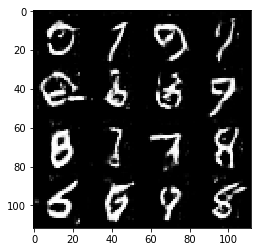

Epoch 2/2... Generator Loss: 2.6382 Discriminator Loss: 0.4759...
Epoch 2/2... Generator Loss: 2.2634 Discriminator Loss: 0.4179...
Epoch 2/2... Generator Loss: 1.7328 Discriminator Loss: 0.6439...
Epoch 2/2... Generator Loss: 1.1661 Discriminator Loss: 0.8730...
Epoch 2/2... Generator Loss: 1.8569 Discriminator Loss: 0.7070...
Epoch 2/2... Generator Loss: 1.4709 Discriminator Loss: 0.6202...
Epoch 2/2... Generator Loss: 2.5522 Discriminator Loss: 0.4817...
Epoch 2/2... Generator Loss: 2.3036 Discriminator Loss: 0.4820...
Epoch 2/2... Generator Loss: 2.4627 Discriminator Loss: 0.4426...
Epoch 2/2... Generator Loss: 0.9788 Discriminator Loss: 0.8302...


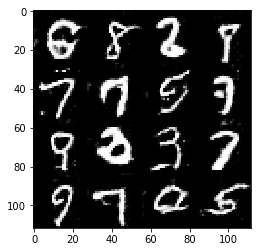

Epoch 2/2... Generator Loss: 1.7121 Discriminator Loss: 0.5965...
Epoch 2/2... Generator Loss: 1.8429 Discriminator Loss: 0.6428...
Epoch 2/2... Generator Loss: 1.5307 Discriminator Loss: 0.6550...
Epoch 2/2... Generator Loss: 1.0192 Discriminator Loss: 0.9997...
Epoch 2/2... Generator Loss: 1.8381 Discriminator Loss: 0.6472...
Epoch 2/2... Generator Loss: 1.3457 Discriminator Loss: 0.8885...
Epoch 2/2... Generator Loss: 1.4264 Discriminator Loss: 0.7568...
Epoch 2/2... Generator Loss: 1.2522 Discriminator Loss: 0.7953...
Epoch 2/2... Generator Loss: 1.8206 Discriminator Loss: 0.6973...
Epoch 2/2... Generator Loss: 2.2579 Discriminator Loss: 0.4522...


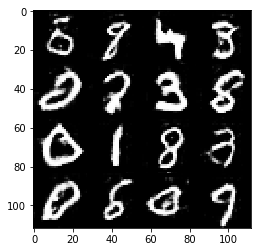

Epoch 2/2... Generator Loss: 1.8468 Discriminator Loss: 0.7991...
Epoch 2/2... Generator Loss: 1.8343 Discriminator Loss: 0.7411...
Epoch 2/2... Generator Loss: 1.9558 Discriminator Loss: 0.7190...
Epoch 2/2... Generator Loss: 0.9915 Discriminator Loss: 0.8529...
Epoch 2/2... Generator Loss: 0.6886 Discriminator Loss: 1.0052...
Epoch 2/2... Generator Loss: 2.0915 Discriminator Loss: 0.5944...
Epoch 2/2... Generator Loss: 1.9603 Discriminator Loss: 0.6238...
Epoch 2/2... Generator Loss: 2.7990 Discriminator Loss: 0.4620...
Epoch 2/2... Generator Loss: 2.7032 Discriminator Loss: 0.4697...
Epoch 2/2... Generator Loss: 0.9052 Discriminator Loss: 0.8248...


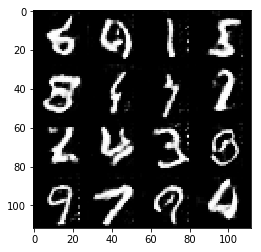

Epoch 2/2... Generator Loss: 1.9210 Discriminator Loss: 0.6581...
Epoch 2/2... Generator Loss: 2.9928 Discriminator Loss: 0.4535...
Epoch 2/2... Generator Loss: 2.1253 Discriminator Loss: 0.6480...
Epoch 2/2... Generator Loss: 1.1017 Discriminator Loss: 1.0711...
Epoch 2/2... Generator Loss: 2.1460 Discriminator Loss: 0.4875...
Epoch 2/2... Generator Loss: 1.2457 Discriminator Loss: 0.7904...
Epoch 2/2... Generator Loss: 2.6199 Discriminator Loss: 0.5685...
Epoch 2/2... Generator Loss: 2.8449 Discriminator Loss: 0.4720...
Epoch 2/2... Generator Loss: 1.4929 Discriminator Loss: 1.0162...
Epoch 2/2... Generator Loss: 2.5958 Discriminator Loss: 0.4336...


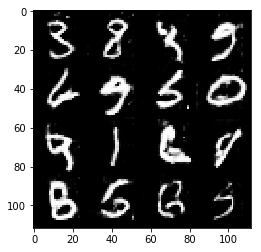

Epoch 2/2... Generator Loss: 0.7922 Discriminator Loss: 0.8813...
Epoch 2/2... Generator Loss: 2.1786 Discriminator Loss: 0.7371...
Epoch 2/2... Generator Loss: 2.6932 Discriminator Loss: 0.5041...
Epoch 2/2... Generator Loss: 3.4810 Discriminator Loss: 0.4209...
Epoch 2/2... Generator Loss: 2.6449 Discriminator Loss: 0.4414...
Epoch 2/2... Generator Loss: 1.8856 Discriminator Loss: 0.5592...
Epoch 2/2... Generator Loss: 2.2039 Discriminator Loss: 0.6491...
Epoch 2/2... Generator Loss: 1.7270 Discriminator Loss: 0.6782...
Epoch 2/2... Generator Loss: 1.4336 Discriminator Loss: 0.8570...
Epoch 2/2... Generator Loss: 4.0445 Discriminator Loss: 0.4657...


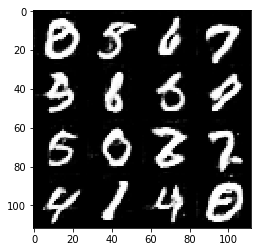

Epoch 2/2... Generator Loss: 1.9005 Discriminator Loss: 0.6562...
Epoch 2/2... Generator Loss: 1.8875 Discriminator Loss: 0.7818...
Epoch 2/2... Generator Loss: 2.6909 Discriminator Loss: 0.5613...
Epoch 2/2... Generator Loss: 1.1872 Discriminator Loss: 0.7945...
Epoch 2/2... Generator Loss: 2.2651 Discriminator Loss: 0.6261...
Epoch 2/2... Generator Loss: 2.2671 Discriminator Loss: 0.7733...
Epoch 2/2... Generator Loss: 1.8880 Discriminator Loss: 0.4839...
Epoch 2/2... Generator Loss: 2.2382 Discriminator Loss: 0.5378...
Epoch 2/2... Generator Loss: 2.1060 Discriminator Loss: 0.5171...
Epoch 2/2... Generator Loss: 2.0420 Discriminator Loss: 0.4876...


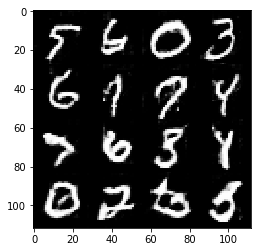

Epoch 2/2... Generator Loss: 2.4384 Discriminator Loss: 0.4948...
Epoch 2/2... Generator Loss: 3.6866 Discriminator Loss: 0.4257...
Epoch 2/2... Generator Loss: 1.3366 Discriminator Loss: 0.8097...
Epoch 2/2... Generator Loss: 1.2434 Discriminator Loss: 1.1695...
Epoch 2/2... Generator Loss: 1.6204 Discriminator Loss: 0.5004...
Epoch 2/2... Generator Loss: 2.1977 Discriminator Loss: 0.4963...
Epoch 2/2... Generator Loss: 1.6321 Discriminator Loss: 0.5827...
Epoch 2/2... Generator Loss: 1.2953 Discriminator Loss: 0.6631...
Epoch 2/2... Generator Loss: 2.5445 Discriminator Loss: 0.4795...
Epoch 2/2... Generator Loss: 1.4809 Discriminator Loss: 0.9576...


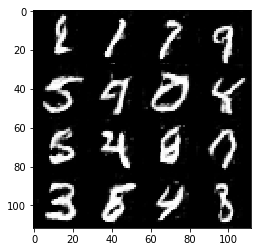

Epoch 2/2... Generator Loss: 2.2182 Discriminator Loss: 0.4740...
Epoch 2/2... Generator Loss: 2.0017 Discriminator Loss: 0.6969...
Epoch 2/2... Generator Loss: 1.0595 Discriminator Loss: 0.9945...
Epoch 2/2... Generator Loss: 2.6895 Discriminator Loss: 0.5213...
Epoch 2/2... Generator Loss: 3.3845 Discriminator Loss: 0.4652...
Epoch 2/2... Generator Loss: 1.5624 Discriminator Loss: 0.7752...
Epoch 2/2... Generator Loss: 1.0463 Discriminator Loss: 1.1464...
Epoch 2/2... Generator Loss: 2.4238 Discriminator Loss: 0.4668...
Epoch 2/2... Generator Loss: 1.7673 Discriminator Loss: 0.5354...
Epoch 2/2... Generator Loss: 1.3272 Discriminator Loss: 0.9396...


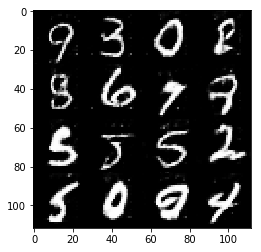

Epoch 2/2... Generator Loss: 1.1885 Discriminator Loss: 0.8410...
Epoch 2/2... Generator Loss: 3.1257 Discriminator Loss: 0.6664...
Epoch 2/2... Generator Loss: 1.8416 Discriminator Loss: 0.5642...
Epoch 2/2... Generator Loss: 1.0806 Discriminator Loss: 1.1471...
Epoch 2/2... Generator Loss: 2.1887 Discriminator Loss: 0.5376...
Epoch 2/2... Generator Loss: 2.0698 Discriminator Loss: 0.4622...
Epoch 2/2... Generator Loss: 2.1576 Discriminator Loss: 0.6380...
Epoch 2/2... Generator Loss: 2.9622 Discriminator Loss: 0.7300...
Epoch 2/2... Generator Loss: 1.3488 Discriminator Loss: 0.6890...
Epoch 2/2... Generator Loss: 3.5523 Discriminator Loss: 1.1223...


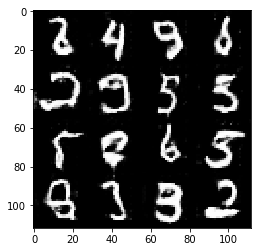

Epoch 2/2... Generator Loss: 2.1977 Discriminator Loss: 0.4848...
Epoch 2/2... Generator Loss: 0.9939 Discriminator Loss: 0.7489...
Epoch 2/2... Generator Loss: 1.9774 Discriminator Loss: 0.6201...
Epoch 2/2... Generator Loss: 0.7513 Discriminator Loss: 1.0613...
Epoch 2/2... Generator Loss: 2.1336 Discriminator Loss: 0.5518...
Epoch 2/2... Generator Loss: 2.2190 Discriminator Loss: 0.7399...
Epoch 2/2... Generator Loss: 2.7028 Discriminator Loss: 0.6000...
Epoch 2/2... Generator Loss: 1.2633 Discriminator Loss: 0.6167...
Epoch 2/2... Generator Loss: 1.5758 Discriminator Loss: 0.7126...
Epoch 2/2... Generator Loss: 1.3337 Discriminator Loss: 0.9795...


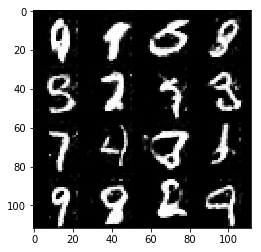

Epoch 2/2... Generator Loss: 1.4797 Discriminator Loss: 1.0095...
Epoch 2/2... Generator Loss: 2.1573 Discriminator Loss: 0.7046...
Epoch 2/2... Generator Loss: 1.9971 Discriminator Loss: 0.4332...
Epoch 2/2... Generator Loss: 2.9063 Discriminator Loss: 1.6570...
Epoch 2/2... Generator Loss: 1.6116 Discriminator Loss: 0.9317...
Epoch 2/2... Generator Loss: 1.2540 Discriminator Loss: 0.8743...
Epoch 2/2... Generator Loss: 1.8698 Discriminator Loss: 0.5706...
Epoch 2/2... Generator Loss: 1.1505 Discriminator Loss: 0.8622...
Epoch 2/2... Generator Loss: 0.8547 Discriminator Loss: 1.1618...
Epoch 2/2... Generator Loss: 0.9215 Discriminator Loss: 0.9037...


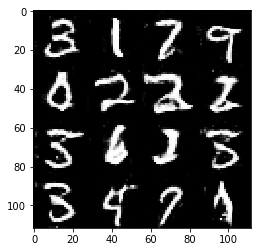

Epoch 2/2... Generator Loss: 1.3093 Discriminator Loss: 0.7048...
Epoch 2/2... Generator Loss: 1.4617 Discriminator Loss: 0.5941...
Epoch 2/2... Generator Loss: 2.2372 Discriminator Loss: 0.4352...
Epoch 2/2... Generator Loss: 1.3134 Discriminator Loss: 0.6184...
Epoch 2/2... Generator Loss: 1.3448 Discriminator Loss: 0.9728...
Epoch 2/2... Generator Loss: 1.7219 Discriminator Loss: 0.7034...
Epoch 2/2... Generator Loss: 2.5255 Discriminator Loss: 0.6404...
Epoch 2/2... Generator Loss: 1.3938 Discriminator Loss: 0.6073...
Epoch 2/2... Generator Loss: 2.7432 Discriminator Loss: 0.5322...
Epoch 2/2... Generator Loss: 2.2645 Discriminator Loss: 0.5661...


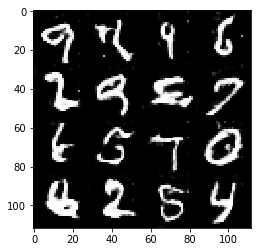

Epoch 2/2... Generator Loss: 2.3321 Discriminator Loss: 0.5187...
Epoch 2/2... Generator Loss: 3.5162 Discriminator Loss: 0.4901...
Epoch 2/2... Generator Loss: 2.0036 Discriminator Loss: 0.5685...
Epoch 2/2... Generator Loss: 0.4468 Discriminator Loss: 1.5076...
Epoch 2/2... Generator Loss: 2.7592 Discriminator Loss: 0.4624...
Epoch 2/2... Generator Loss: 2.8185 Discriminator Loss: 1.0531...
Epoch 2/2... Generator Loss: 1.4150 Discriminator Loss: 0.9070...
Epoch 2/2... Generator Loss: 1.5589 Discriminator Loss: 0.8063...
Epoch 2/2... Generator Loss: 1.5604 Discriminator Loss: 0.6583...
Epoch 2/2... Generator Loss: 1.3744 Discriminator Loss: 0.9483...


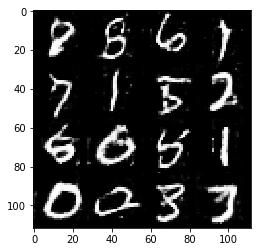

Epoch 2/2... Generator Loss: 2.2252 Discriminator Loss: 0.6701...
Epoch 2/2... Generator Loss: 0.4162 Discriminator Loss: 1.5703...
Epoch 2/2... Generator Loss: 2.1087 Discriminator Loss: 0.4891...
Epoch 2/2... Generator Loss: 2.2409 Discriminator Loss: 0.4935...
Epoch 2/2... Generator Loss: 0.8647 Discriminator Loss: 0.8654...
Epoch 2/2... Generator Loss: 2.2476 Discriminator Loss: 0.6101...
Epoch 2/2... Generator Loss: 3.3810 Discriminator Loss: 0.3995...
Epoch 2/2... Generator Loss: 1.5212 Discriminator Loss: 0.7320...
Epoch 2/2... Generator Loss: 0.6887 Discriminator Loss: 1.7354...
Epoch 2/2... Generator Loss: 2.7001 Discriminator Loss: 0.5270...


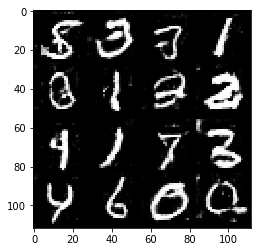

Epoch 2/2... Generator Loss: 1.3184 Discriminator Loss: 1.0952...
Epoch 2/2... Generator Loss: 1.5181 Discriminator Loss: 0.7314...
Epoch 2/2... Generator Loss: 1.8236 Discriminator Loss: 0.5812...
Epoch 2/2... Generator Loss: 1.7844 Discriminator Loss: 0.4724...
Epoch 2/2... Generator Loss: 1.9852 Discriminator Loss: 0.4620...
Epoch 2/2... Generator Loss: 2.6294 Discriminator Loss: 0.4836...
Epoch 2/2... Generator Loss: 1.8996 Discriminator Loss: 0.6539...
Epoch 2/2... Generator Loss: 1.2543 Discriminator Loss: 0.9501...
Epoch 2/2... Generator Loss: 1.9236 Discriminator Loss: 0.7555...
Epoch 2/2... Generator Loss: 1.6195 Discriminator Loss: 0.7181...


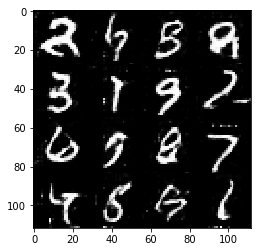

Epoch 2/2... Generator Loss: 2.2357 Discriminator Loss: 0.6635...
Epoch 2/2... Generator Loss: 1.7231 Discriminator Loss: 0.6338...
Epoch 2/2... Generator Loss: 1.5152 Discriminator Loss: 0.5753...
Epoch 2/2... Generator Loss: 1.7550 Discriminator Loss: 0.5002...
Epoch 2/2... Generator Loss: 1.1921 Discriminator Loss: 0.9373...
Epoch 2/2... Generator Loss: 0.9020 Discriminator Loss: 0.8397...
Epoch 2/2... Generator Loss: 2.8493 Discriminator Loss: 0.5109...
Epoch 2/2... Generator Loss: 1.6646 Discriminator Loss: 0.7787...
Epoch 2/2... Generator Loss: 0.9423 Discriminator Loss: 1.1796...
Epoch 2/2... Generator Loss: 1.4882 Discriminator Loss: 0.6623...


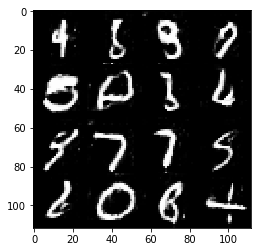

Epoch 2/2... Generator Loss: 3.1524 Discriminator Loss: 0.5281...
Epoch 2/2... Generator Loss: 1.5032 Discriminator Loss: 0.6136...
Epoch 2/2... Generator Loss: 1.8889 Discriminator Loss: 0.7958...
Epoch 2/2... Generator Loss: 2.2981 Discriminator Loss: 0.4948...
Epoch 2/2... Generator Loss: 3.1939 Discriminator Loss: 0.3815...
Epoch 2/2... Generator Loss: 1.2226 Discriminator Loss: 0.8718...
Epoch 2/2... Generator Loss: 1.0665 Discriminator Loss: 0.8615...
Epoch 2/2... Generator Loss: 1.4859 Discriminator Loss: 0.4931...
Epoch 2/2... Generator Loss: 2.3589 Discriminator Loss: 0.5984...
Epoch 2/2... Generator Loss: 3.7225 Discriminator Loss: 0.4324...


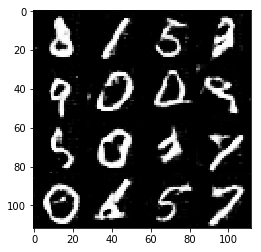

Epoch 2/2... Generator Loss: 0.5391 Discriminator Loss: 1.9864...
Epoch 2/2... Generator Loss: 1.6265 Discriminator Loss: 0.6839...
Epoch 2/2... Generator Loss: 1.8150 Discriminator Loss: 0.7128...
Epoch 2/2... Generator Loss: 1.3469 Discriminator Loss: 0.8790...
Epoch 2/2... Generator Loss: 2.1439 Discriminator Loss: 0.9722...
Epoch 2/2... Generator Loss: 1.9639 Discriminator Loss: 0.5773...
Epoch 2/2... Generator Loss: 1.4730 Discriminator Loss: 0.6753...
Epoch 2/2... Generator Loss: 1.8774 Discriminator Loss: 0.5018...
Epoch 2/2... Generator Loss: 1.6861 Discriminator Loss: 0.6431...
Epoch 2/2... Generator Loss: 3.5958 Discriminator Loss: 0.4333...


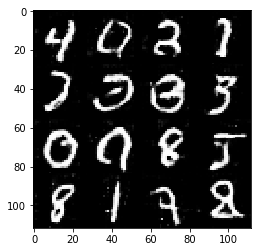

Epoch 2/2... Generator Loss: 2.2694 Discriminator Loss: 0.6380...
Epoch 2/2... Generator Loss: 1.8301 Discriminator Loss: 0.6260...
Epoch 2/2... Generator Loss: 0.2809 Discriminator Loss: 1.6183...
Epoch 2/2... Generator Loss: 2.8076 Discriminator Loss: 0.6320...
Epoch 2/2... Generator Loss: 1.4780 Discriminator Loss: 0.8590...
Epoch 2/2... Generator Loss: 2.5320 Discriminator Loss: 0.4933...
Epoch 2/2... Generator Loss: 2.2253 Discriminator Loss: 0.5347...
Epoch 2/2... Generator Loss: 1.5392 Discriminator Loss: 0.6973...
Epoch 2/2... Generator Loss: 2.1258 Discriminator Loss: 0.5313...
Epoch 2/2... Generator Loss: 2.8369 Discriminator Loss: 0.4618...


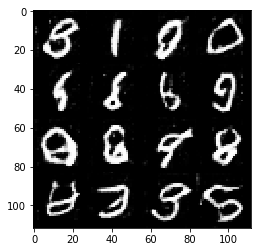

Epoch 2/2... Generator Loss: 3.1670 Discriminator Loss: 0.5148...
Epoch 2/2... Generator Loss: 1.1478 Discriminator Loss: 0.8240...
Epoch 2/2... Generator Loss: 1.2014 Discriminator Loss: 0.6627...
Epoch 2/2... Generator Loss: 2.7664 Discriminator Loss: 0.5188...
Epoch 2/2... Generator Loss: 2.8420 Discriminator Loss: 0.4773...
Epoch 2/2... Generator Loss: 2.2487 Discriminator Loss: 0.5329...
Epoch 2/2... Generator Loss: 1.6001 Discriminator Loss: 0.5839...
Epoch 2/2... Generator Loss: 1.9160 Discriminator Loss: 0.5438...
Epoch 2/2... Generator Loss: 2.4841 Discriminator Loss: 0.6550...
Epoch 2/2... Generator Loss: 3.1785 Discriminator Loss: 0.4024...


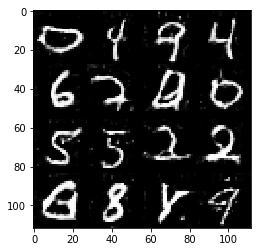

Epoch 2/2... Generator Loss: 1.9765 Discriminator Loss: 0.7444...
Epoch 2/2... Generator Loss: 2.6625 Discriminator Loss: 0.5266...
Epoch 2/2... Generator Loss: 2.3727 Discriminator Loss: 0.4569...
Epoch 2/2... Generator Loss: 0.8316 Discriminator Loss: 0.9745...
Epoch 2/2... Generator Loss: 3.6392 Discriminator Loss: 0.5892...
Epoch 2/2... Generator Loss: 1.2799 Discriminator Loss: 1.0009...
Epoch 2/2... Generator Loss: 1.1882 Discriminator Loss: 0.6504...
Epoch 2/2... Generator Loss: 1.5572 Discriminator Loss: 0.6876...
Epoch 2/2... Generator Loss: 1.8005 Discriminator Loss: 0.8204...
Epoch 2/2... Generator Loss: 0.5353 Discriminator Loss: 1.2240...


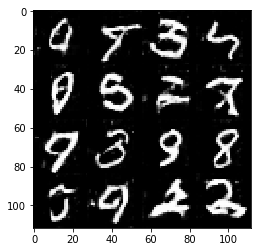

Epoch 2/2... Generator Loss: 1.3266 Discriminator Loss: 1.0194...
Epoch 2/2... Generator Loss: 2.8143 Discriminator Loss: 0.4955...
Epoch 2/2... Generator Loss: 2.4635 Discriminator Loss: 0.4756...
Epoch 2/2... Generator Loss: 2.3099 Discriminator Loss: 0.5834...
Epoch 2/2... Generator Loss: 1.7379 Discriminator Loss: 0.6608...
Epoch 2/2... Generator Loss: 1.8769 Discriminator Loss: 0.6072...
Epoch 2/2... Generator Loss: 1.5415 Discriminator Loss: 0.7394...
Epoch 2/2... Generator Loss: 2.5016 Discriminator Loss: 0.4446...
Epoch 2/2... Generator Loss: 1.6078 Discriminator Loss: 0.8414...
Epoch 2/2... Generator Loss: 3.1823 Discriminator Loss: 0.8229...


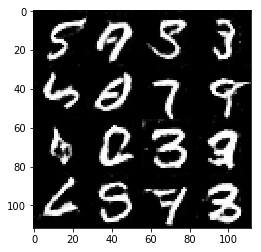

Epoch 2/2... Generator Loss: 1.1686 Discriminator Loss: 0.7203...
Epoch 2/2... Generator Loss: 1.5304 Discriminator Loss: 0.7281...
Epoch 2/2... Generator Loss: 2.7821 Discriminator Loss: 0.5462...
Epoch 2/2... Generator Loss: 0.9251 Discriminator Loss: 0.8340...
Epoch 2/2... Generator Loss: 1.7676 Discriminator Loss: 0.5767...
Epoch 2/2... Generator Loss: 1.9880 Discriminator Loss: 0.7174...
Epoch 2/2... Generator Loss: 1.9236 Discriminator Loss: 0.7616...
Epoch 2/2... Generator Loss: 1.9096 Discriminator Loss: 0.5784...
Epoch 2/2... Generator Loss: 1.5193 Discriminator Loss: 1.1155...
Epoch 2/2... Generator Loss: 1.2509 Discriminator Loss: 0.8409...


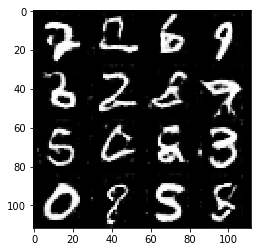

Epoch 2/2... Generator Loss: 1.1280 Discriminator Loss: 0.9181...
Epoch 2/2... Generator Loss: 1.7517 Discriminator Loss: 0.5152...
Epoch 2/2... Generator Loss: 1.8479 Discriminator Loss: 0.6617...
Epoch 2/2... Generator Loss: 2.6626 Discriminator Loss: 0.6765...
Epoch 2/2... Generator Loss: 1.9274 Discriminator Loss: 0.6403...
Epoch 2/2... Generator Loss: 1.4666 Discriminator Loss: 0.6346...
Epoch 2/2... Generator Loss: 2.2499 Discriminator Loss: 0.4987...
Epoch 2/2... Generator Loss: 2.1010 Discriminator Loss: 0.6102...
Epoch 2/2... Generator Loss: 2.2471 Discriminator Loss: 0.5910...
Epoch 2/2... Generator Loss: 2.8621 Discriminator Loss: 0.4437...


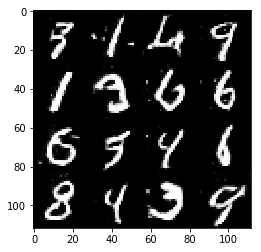

Epoch 2/2... Generator Loss: 2.1282 Discriminator Loss: 0.6512...
Epoch 2/2... Generator Loss: 1.0011 Discriminator Loss: 0.9313...
Epoch 2/2... Generator Loss: 2.5468 Discriminator Loss: 0.7463...
Epoch 2/2... Generator Loss: 2.0672 Discriminator Loss: 0.6407...
Epoch 2/2... Generator Loss: 1.9710 Discriminator Loss: 0.4912...
Epoch 2/2... Generator Loss: 2.3525 Discriminator Loss: 0.6020...
Epoch 2/2... Generator Loss: 1.7497 Discriminator Loss: 0.7746...
Epoch 2/2... Generator Loss: 1.7474 Discriminator Loss: 0.5185...
Epoch 2/2... Generator Loss: 2.0296 Discriminator Loss: 0.6682...
Epoch 2/2... Generator Loss: 2.4794 Discriminator Loss: 0.5399...


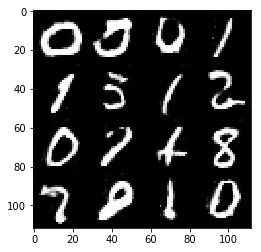

Epoch 2/2... Generator Loss: 1.7417 Discriminator Loss: 0.6522...
Epoch 2/2... Generator Loss: 1.5263 Discriminator Loss: 0.7676...
Epoch 2/2... Generator Loss: 1.5489 Discriminator Loss: 0.6829...
Epoch 2/2... Generator Loss: 1.1152 Discriminator Loss: 1.1951...
Epoch 2/2... Generator Loss: 1.8347 Discriminator Loss: 0.7314...
Epoch 2/2... Generator Loss: 2.3848 Discriminator Loss: 0.5656...
Epoch 2/2... Generator Loss: 1.8766 Discriminator Loss: 0.6687...
Epoch 2/2... Generator Loss: 1.8297 Discriminator Loss: 0.8624...
Epoch 2/2... Generator Loss: 2.1287 Discriminator Loss: 0.5779...
Epoch 2/2... Generator Loss: 1.3488 Discriminator Loss: 0.7196...


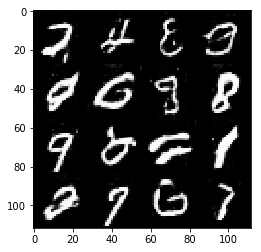

Epoch 2/2... Generator Loss: 2.3349 Discriminator Loss: 0.6886...
Epoch 2/2... Generator Loss: 1.9450 Discriminator Loss: 0.6793...
Epoch 2/2... Generator Loss: 0.7337 Discriminator Loss: 0.7254...
Epoch 2/2... Generator Loss: 2.3092 Discriminator Loss: 0.5250...
Epoch 2/2... Generator Loss: 1.5758 Discriminator Loss: 0.9139...
Epoch 2/2... Generator Loss: 3.4992 Discriminator Loss: 1.8787...
Epoch 2/2... Generator Loss: 2.5936 Discriminator Loss: 0.5803...
Epoch 2/2... Generator Loss: 0.9590 Discriminator Loss: 0.9835...
Epoch 2/2... Generator Loss: 1.3002 Discriminator Loss: 0.9477...
Epoch 2/2... Generator Loss: 1.7547 Discriminator Loss: 0.5184...


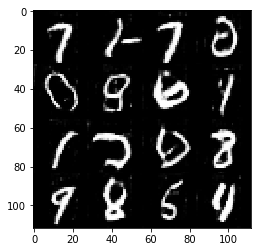

Epoch 2/2... Generator Loss: 2.6838 Discriminator Loss: 0.6359...
Epoch 2/2... Generator Loss: 1.2182 Discriminator Loss: 0.6093...
Epoch 2/2... Generator Loss: 1.4857 Discriminator Loss: 0.6255...
Epoch 2/2... Generator Loss: 2.6910 Discriminator Loss: 0.4060...
Epoch 2/2... Generator Loss: 1.3508 Discriminator Loss: 0.5894...
Epoch 2/2... Generator Loss: 1.4989 Discriminator Loss: 0.9334...
Epoch 2/2... Generator Loss: 2.5833 Discriminator Loss: 0.5612...
Epoch 2/2... Generator Loss: 1.8766 Discriminator Loss: 0.5813...
Epoch 2/2... Generator Loss: 1.9115 Discriminator Loss: 0.4977...
Epoch 2/2... Generator Loss: 3.2365 Discriminator Loss: 0.4938...


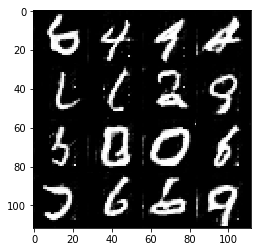

Epoch 2/2... Generator Loss: 1.2954 Discriminator Loss: 0.7560...
Epoch 2/2... Generator Loss: 1.6575 Discriminator Loss: 0.9483...
Epoch 2/2... Generator Loss: 4.1336 Discriminator Loss: 0.3651...
Epoch 2/2... Generator Loss: 3.5206 Discriminator Loss: 0.4931...
Epoch 2/2... Generator Loss: 1.5623 Discriminator Loss: 0.6182...
Epoch 2/2... Generator Loss: 2.2230 Discriminator Loss: 0.7025...
Epoch 2/2... Generator Loss: 1.8865 Discriminator Loss: 0.5956...
Epoch 2/2... Generator Loss: 1.6402 Discriminator Loss: 0.6928...
Epoch 2/2... Generator Loss: 2.8974 Discriminator Loss: 0.6302...
Epoch 2/2... Generator Loss: 1.3279 Discriminator Loss: 1.0934...


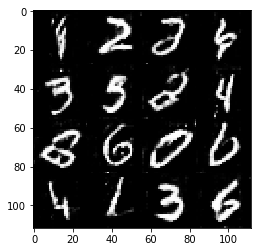

Epoch 2/2... Generator Loss: 2.5206 Discriminator Loss: 0.4811...
Epoch 2/2... Generator Loss: 3.0455 Discriminator Loss: 0.4904...
Epoch 2/2... Generator Loss: 2.1365 Discriminator Loss: 0.5894...
Epoch 2/2... Generator Loss: 1.6128 Discriminator Loss: 0.6727...
Epoch 2/2... Generator Loss: 2.5091 Discriminator Loss: 0.5930...
Epoch 2/2... Generator Loss: 3.2501 Discriminator Loss: 0.4800...
Epoch 2/2... Generator Loss: 2.2101 Discriminator Loss: 0.4447...
Epoch 2/2... Generator Loss: 1.0043 Discriminator Loss: 1.1149...
Epoch 2/2... Generator Loss: 3.4619 Discriminator Loss: 0.4068...
Epoch 2/2... Generator Loss: 2.5357 Discriminator Loss: 0.5126...


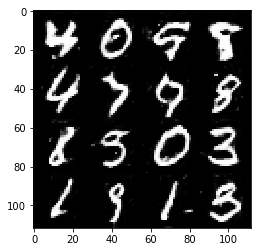

Epoch 2/2... Generator Loss: 1.5908 Discriminator Loss: 0.6924...
Epoch 2/2... Generator Loss: 3.1665 Discriminator Loss: 1.2481...
Epoch 2/2... Generator Loss: 3.4910 Discriminator Loss: 0.4697...
Epoch 2/2... Generator Loss: 1.6718 Discriminator Loss: 0.6023...
Epoch 2/2... Generator Loss: 1.8905 Discriminator Loss: 0.5150...
Epoch 2/2... Generator Loss: 3.3380 Discriminator Loss: 0.4708...
Epoch 2/2... Generator Loss: 3.7525 Discriminator Loss: 0.5699...
Epoch 2/2... Generator Loss: 0.6304 Discriminator Loss: 1.4681...
Epoch 2/2... Generator Loss: 1.7608 Discriminator Loss: 0.9036...
Epoch 2/2... Generator Loss: 1.8063 Discriminator Loss: 0.6247...


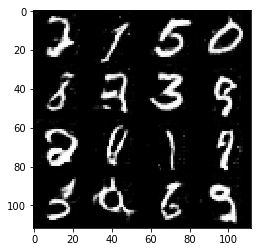

Epoch 2/2... Generator Loss: 1.8080 Discriminator Loss: 0.6400...
Epoch 2/2... Generator Loss: 2.0461 Discriminator Loss: 0.8302...
Epoch 2/2... Generator Loss: 2.5060 Discriminator Loss: 0.4356...
Epoch 2/2... Generator Loss: 1.8798 Discriminator Loss: 0.6399...
Epoch 2/2... Generator Loss: 1.2191 Discriminator Loss: 0.9237...
Epoch 2/2... Generator Loss: 1.5627 Discriminator Loss: 0.7318...
Epoch 2/2... Generator Loss: 0.8937 Discriminator Loss: 1.2502...
Epoch 2/2... Generator Loss: 1.9600 Discriminator Loss: 0.5802...
Epoch 2/2... Generator Loss: 4.0147 Discriminator Loss: 0.5525...
Epoch 2/2... Generator Loss: 3.8089 Discriminator Loss: 0.4262...


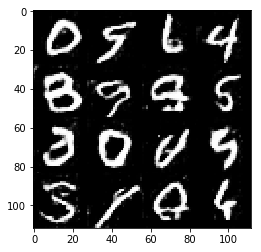

Epoch 2/2... Generator Loss: 1.7823 Discriminator Loss: 0.9257...
Epoch 2/2... Generator Loss: 0.7300 Discriminator Loss: 1.1215...
Epoch 2/2... Generator Loss: 1.2643 Discriminator Loss: 0.9680...
Epoch 2/2... Generator Loss: 0.7976 Discriminator Loss: 0.9779...
Epoch 2/2... Generator Loss: 2.0814 Discriminator Loss: 0.5793...
Epoch 2/2... Generator Loss: 1.9619 Discriminator Loss: 0.6448...
Epoch 2/2... Generator Loss: 1.0673 Discriminator Loss: 1.0423...
Epoch 2/2... Generator Loss: 1.8560 Discriminator Loss: 0.6573...
Epoch 2/2... Generator Loss: 2.1565 Discriminator Loss: 0.7239...
Epoch 2/2... Generator Loss: 2.5794 Discriminator Loss: 0.5091...


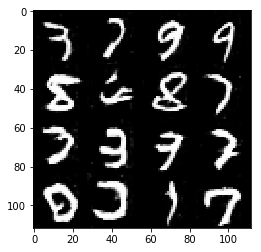

Epoch 2/2... Generator Loss: 0.3911 Discriminator Loss: 1.5481...
Epoch 2/2... Generator Loss: 2.8221 Discriminator Loss: 0.4349...
Epoch 2/2... Generator Loss: 2.6394 Discriminator Loss: 0.5847...
Epoch 2/2... Generator Loss: 2.2429 Discriminator Loss: 0.5765...
Epoch 2/2... Generator Loss: 1.0910 Discriminator Loss: 1.1385...
Epoch 2/2... Generator Loss: 2.0583 Discriminator Loss: 0.5868...
Epoch 2/2... Generator Loss: 1.4504 Discriminator Loss: 0.6645...
Epoch 2/2... Generator Loss: 1.4905 Discriminator Loss: 0.7790...
Epoch 2/2... Generator Loss: 2.5308 Discriminator Loss: 0.5107...
Epoch 2/2... Generator Loss: 1.8068 Discriminator Loss: 0.4730...


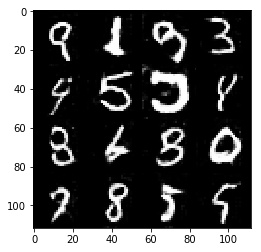

Epoch 2/2... Generator Loss: 1.6909 Discriminator Loss: 0.6998...
Epoch 2/2... Generator Loss: 2.6613 Discriminator Loss: 0.5123...
Epoch 2/2... Generator Loss: 1.6793 Discriminator Loss: 0.5738...
Epoch 2/2... Generator Loss: 1.3659 Discriminator Loss: 0.9357...
Epoch 2/2... Generator Loss: 0.9121 Discriminator Loss: 1.1283...
Epoch 2/2... Generator Loss: 2.4633 Discriminator Loss: 0.5729...
Epoch 2/2... Generator Loss: 0.9863 Discriminator Loss: 1.2142...
Epoch 2/2... Generator Loss: 3.4835 Discriminator Loss: 0.5495...
Epoch 2/2... Generator Loss: 1.7429 Discriminator Loss: 0.5697...
Epoch 2/2... Generator Loss: 2.3730 Discriminator Loss: 0.5489...


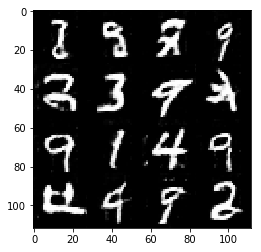

Epoch 2/2... Generator Loss: 1.5600 Discriminator Loss: 0.8194...
Epoch 2/2... Generator Loss: 1.6950 Discriminator Loss: 0.8550...
Epoch 2/2... Generator Loss: 2.5320 Discriminator Loss: 0.4744...
Epoch 2/2... Generator Loss: 3.5015 Discriminator Loss: 0.4048...
Epoch 2/2... Generator Loss: 1.5791 Discriminator Loss: 0.7365...
Epoch 2/2... Generator Loss: 1.2220 Discriminator Loss: 0.7357...
Epoch 2/2... Generator Loss: 2.3178 Discriminator Loss: 0.4581...
Epoch 2/2... Generator Loss: 1.4016 Discriminator Loss: 0.7799...
Epoch 2/2... Generator Loss: 1.4945 Discriminator Loss: 0.9314...
Epoch 2/2... Generator Loss: 2.9398 Discriminator Loss: 0.5558...


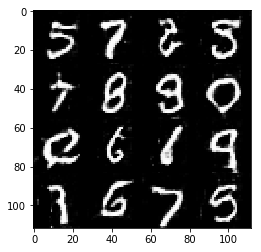

Epoch 2/2... Generator Loss: 2.0592 Discriminator Loss: 0.5570...
Epoch 2/2... Generator Loss: 1.5561 Discriminator Loss: 0.8410...
Epoch 2/2... Generator Loss: 2.5595 Discriminator Loss: 0.4884...
Epoch 2/2... Generator Loss: 0.8636 Discriminator Loss: 0.8310...
Epoch 2/2... Generator Loss: 2.0721 Discriminator Loss: 0.6999...
Epoch 2/2... Generator Loss: 1.8941 Discriminator Loss: 0.5645...
Epoch 2/2... Generator Loss: 3.3989 Discriminator Loss: 0.4745...
Epoch 2/2... Generator Loss: 1.4208 Discriminator Loss: 0.6409...
Epoch 2/2... Generator Loss: 2.6930 Discriminator Loss: 0.5645...
Epoch 2/2... Generator Loss: 1.3605 Discriminator Loss: 0.8319...


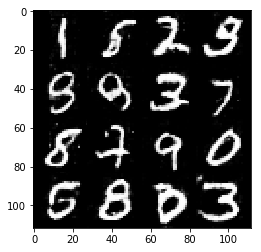

Epoch 2/2... Generator Loss: 3.4410 Discriminator Loss: 0.4806...
Epoch 2/2... Generator Loss: 2.1827 Discriminator Loss: 0.6060...
Epoch 2/2... Generator Loss: 2.0722 Discriminator Loss: 0.5394...
Epoch 2/2... Generator Loss: 1.8268 Discriminator Loss: 0.5540...
Epoch 2/2... Generator Loss: 2.2955 Discriminator Loss: 0.6372...
Epoch 2/2... Generator Loss: 1.6448 Discriminator Loss: 0.9060...
Epoch 2/2... Generator Loss: 3.0856 Discriminator Loss: 0.6166...
Epoch 2/2... Generator Loss: 3.2315 Discriminator Loss: 0.6164...
Epoch 2/2... Generator Loss: 1.2384 Discriminator Loss: 0.9877...
Epoch 2/2... Generator Loss: 2.2265 Discriminator Loss: 0.5553...


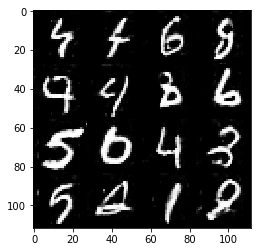

Epoch 2/2... Generator Loss: 2.1178 Discriminator Loss: 0.6026...
Epoch 2/2... Generator Loss: 1.7420 Discriminator Loss: 1.0561...
Epoch 2/2... Generator Loss: 1.5667 Discriminator Loss: 0.5438...
Epoch 2/2... Generator Loss: 2.7877 Discriminator Loss: 0.5091...
Epoch 2/2... Generator Loss: 2.2916 Discriminator Loss: 0.4956...
Epoch 2/2... Generator Loss: 1.9991 Discriminator Loss: 0.5978...
Epoch 2/2... Generator Loss: 0.8138 Discriminator Loss: 0.8396...
Epoch 2/2... Generator Loss: 2.1412 Discriminator Loss: 0.5968...
Epoch 2/2... Generator Loss: 1.8334 Discriminator Loss: 0.5311...
Epoch 2/2... Generator Loss: 3.0273 Discriminator Loss: 0.5358...


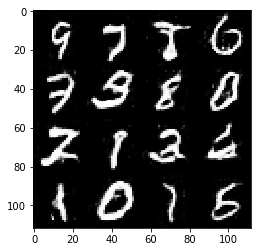

Epoch 2/2... Generator Loss: 3.0815 Discriminator Loss: 0.4390...
Epoch 2/2... Generator Loss: 2.0204 Discriminator Loss: 0.5477...
Epoch 2/2... Generator Loss: 2.7522 Discriminator Loss: 0.4458...
Epoch 2/2... Generator Loss: 2.1623 Discriminator Loss: 0.5835...
Epoch 2/2... Generator Loss: 1.3912 Discriminator Loss: 1.0432...
Epoch 2/2... Generator Loss: 2.5084 Discriminator Loss: 0.4176...
Epoch 2/2... Generator Loss: 2.0707 Discriminator Loss: 0.5803...
Epoch 2/2... Generator Loss: 0.9981 Discriminator Loss: 1.0290...
Epoch 2/2... Generator Loss: 1.2420 Discriminator Loss: 0.7553...
Epoch 2/2... Generator Loss: 2.6726 Discriminator Loss: 0.6852...


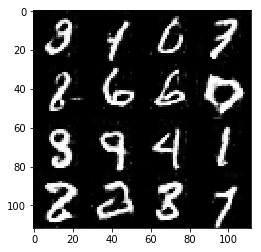

Epoch 2/2... Generator Loss: 3.1555 Discriminator Loss: 1.2112...
Epoch 2/2... Generator Loss: 2.4216 Discriminator Loss: 0.5008...
Epoch 2/2... Generator Loss: 2.4017 Discriminator Loss: 0.4195...
Epoch 2/2... Generator Loss: 3.4288 Discriminator Loss: 0.5507...
Epoch 2/2... Generator Loss: 2.9411 Discriminator Loss: 0.4299...
Epoch 2/2... Generator Loss: 2.0527 Discriminator Loss: 0.6059...
Epoch 2/2... Generator Loss: 1.6446 Discriminator Loss: 0.5780...
Epoch 2/2... Generator Loss: 2.2961 Discriminator Loss: 0.4910...
Epoch 2/2... Generator Loss: 1.6843 Discriminator Loss: 0.5258...
Epoch 2/2... Generator Loss: 1.1451 Discriminator Loss: 0.9574...


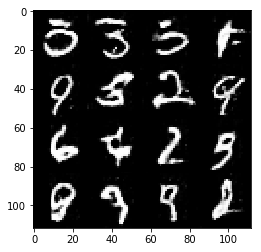

Epoch 2/2... Generator Loss: 1.5790 Discriminator Loss: 0.5496...
Epoch 2/2... Generator Loss: 2.9198 Discriminator Loss: 0.5150...
Epoch 2/2... Generator Loss: 3.8313 Discriminator Loss: 0.6032...
Epoch 2/2... Generator Loss: 1.9553 Discriminator Loss: 0.5141...
Epoch 2/2... Generator Loss: 1.4167 Discriminator Loss: 0.7191...
Epoch 2/2... Generator Loss: 2.4613 Discriminator Loss: 0.5915...
Epoch 2/2... Generator Loss: 1.2116 Discriminator Loss: 0.6358...
Epoch 2/2... Generator Loss: 3.5849 Discriminator Loss: 0.8132...
Epoch 2/2... Generator Loss: 1.5939 Discriminator Loss: 0.5528...
Epoch 2/2... Generator Loss: 1.4373 Discriminator Loss: 0.8306...


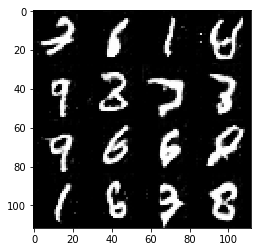

Epoch 2/2... Generator Loss: 2.3286 Discriminator Loss: 0.5899...
Epoch 2/2... Generator Loss: 1.3163 Discriminator Loss: 1.0322...
Epoch 2/2... Generator Loss: 2.2820 Discriminator Loss: 0.5971...
Epoch 2/2... Generator Loss: 3.8636 Discriminator Loss: 0.3876...
Epoch 2/2... Generator Loss: 1.9375 Discriminator Loss: 0.6712...
Epoch 2/2... Generator Loss: 1.4670 Discriminator Loss: 0.6882...
Epoch 2/2... Generator Loss: 4.0998 Discriminator Loss: 0.5322...
Epoch 2/2... Generator Loss: 2.3842 Discriminator Loss: 0.6282...
Epoch 2/2... Generator Loss: 2.3856 Discriminator Loss: 0.5869...
Epoch 2/2... Generator Loss: 3.4062 Discriminator Loss: 0.4875...


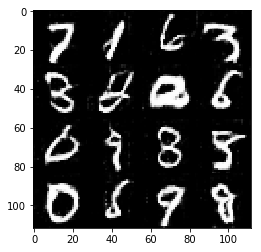

Epoch 2/2... Generator Loss: 2.4778 Discriminator Loss: 0.7243...
Epoch 2/2... Generator Loss: 1.6574 Discriminator Loss: 0.6051...
Epoch 2/2... Generator Loss: 1.7651 Discriminator Loss: 0.7554...
Epoch 2/2... Generator Loss: 2.5561 Discriminator Loss: 0.5603...
Epoch 2/2... Generator Loss: 1.2105 Discriminator Loss: 1.1204...
Epoch 2/2... Generator Loss: 1.9939 Discriminator Loss: 0.7898...
Epoch 2/2... Generator Loss: 0.9425 Discriminator Loss: 1.2699...
Epoch 2/2... Generator Loss: 2.9259 Discriminator Loss: 0.4754...
Epoch 2/2... Generator Loss: 1.5891 Discriminator Loss: 0.4892...
Epoch 2/2... Generator Loss: 1.6030 Discriminator Loss: 0.7432...


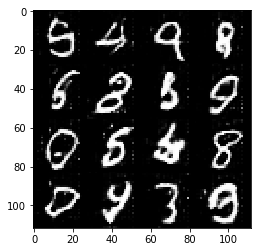

Epoch 2/2... Generator Loss: 2.0409 Discriminator Loss: 0.7675...
Epoch 2/2... Generator Loss: 1.6593 Discriminator Loss: 0.5624...
Epoch 2/2... Generator Loss: 3.1061 Discriminator Loss: 0.4913...
Epoch 2/2... Generator Loss: 2.5031 Discriminator Loss: 0.5251...
Epoch 2/2... Generator Loss: 2.5178 Discriminator Loss: 0.5045...
Epoch 2/2... Generator Loss: 3.8988 Discriminator Loss: 0.4401...
Epoch 2/2... Generator Loss: 2.9441 Discriminator Loss: 0.5112...
Epoch 2/2... Generator Loss: 1.2778 Discriminator Loss: 1.3774...
Epoch 2/2... Generator Loss: 2.1452 Discriminator Loss: 0.6397...
Epoch 2/2... Generator Loss: 3.3610 Discriminator Loss: 0.5190...


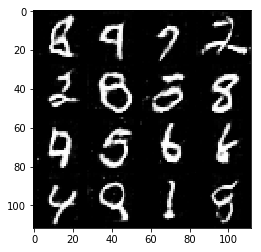

Epoch 2/2... Generator Loss: 1.1308 Discriminator Loss: 0.8464...
Epoch 2/2... Generator Loss: 1.3408 Discriminator Loss: 0.5872...
Epoch 2/2... Generator Loss: 2.4985 Discriminator Loss: 0.5903...
Epoch 2/2... Generator Loss: 2.0510 Discriminator Loss: 0.4923...
Epoch 2/2... Generator Loss: 1.6651 Discriminator Loss: 0.4575...
Epoch 2/2... Generator Loss: 2.6619 Discriminator Loss: 0.4911...
Epoch 2/2... Generator Loss: 2.2728 Discriminator Loss: 0.4563...
Epoch 2/2... Generator Loss: 2.3841 Discriminator Loss: 0.5419...
Epoch 2/2... Generator Loss: 0.9253 Discriminator Loss: 1.3983...
Epoch 2/2... Generator Loss: 1.7454 Discriminator Loss: 1.0106...


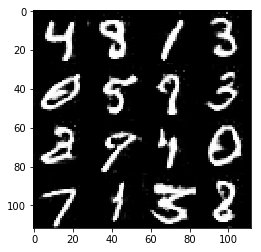

Epoch 2/2... Generator Loss: 1.9904 Discriminator Loss: 0.5853...
Epoch 2/2... Generator Loss: 1.5439 Discriminator Loss: 0.6296...
Epoch 2/2... Generator Loss: 3.4616 Discriminator Loss: 0.4350...
Epoch 2/2... Generator Loss: 3.3026 Discriminator Loss: 0.7314...
Epoch 2/2... Generator Loss: 1.8029 Discriminator Loss: 0.6172...
Epoch 2/2... Generator Loss: 2.4310 Discriminator Loss: 0.5501...
Epoch 2/2... Generator Loss: 2.2017 Discriminator Loss: 0.7958...
Epoch 2/2... Generator Loss: 2.4332 Discriminator Loss: 0.4276...
Epoch 2/2... Generator Loss: 0.6880 Discriminator Loss: 1.6580...
Epoch 2/2... Generator Loss: 2.1714 Discriminator Loss: 0.6403...


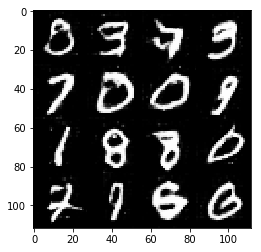

Epoch 2/2... Generator Loss: 4.4200 Discriminator Loss: 0.3776...
Epoch 2/2... Generator Loss: 2.2799 Discriminator Loss: 0.7316...
Epoch 2/2... Generator Loss: 2.4393 Discriminator Loss: 0.4742...
Epoch 2/2... Generator Loss: 2.0394 Discriminator Loss: 0.5016...
Epoch 2/2... Generator Loss: 3.8233 Discriminator Loss: 0.4458...
Epoch 2/2... Generator Loss: 2.1946 Discriminator Loss: 0.4716...
Epoch 2/2... Generator Loss: 1.3313 Discriminator Loss: 0.9248...
Epoch 2/2... Generator Loss: 1.6465 Discriminator Loss: 0.5401...
Epoch 2/2... Generator Loss: 3.5077 Discriminator Loss: 0.3946...
Epoch 2/2... Generator Loss: 2.4334 Discriminator Loss: 0.3890...


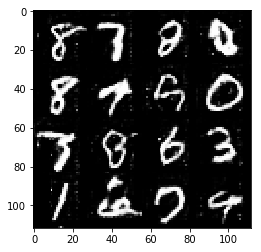

Epoch 2/2... Generator Loss: 1.9197 Discriminator Loss: 0.5605...
Epoch 2/2... Generator Loss: 1.2376 Discriminator Loss: 0.7656...
Epoch 2/2... Generator Loss: 2.0204 Discriminator Loss: 0.8065...
Epoch 2/2... Generator Loss: 1.2450 Discriminator Loss: 0.6869...
Epoch 2/2... Generator Loss: 2.7589 Discriminator Loss: 0.5879...
Epoch 2/2... Generator Loss: 1.0373 Discriminator Loss: 0.8903...
Epoch 2/2... Generator Loss: 3.2303 Discriminator Loss: 0.4632...
Epoch 2/2... Generator Loss: 2.7911 Discriminator Loss: 0.4437...
Epoch 2/2... Generator Loss: 1.5696 Discriminator Loss: 0.5290...
Epoch 2/2... Generator Loss: 2.6680 Discriminator Loss: 0.4365...


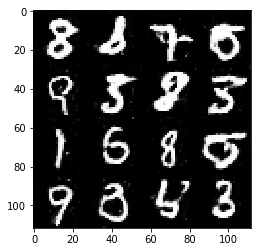

Epoch 2/2... Generator Loss: 2.9299 Discriminator Loss: 0.4372...
Epoch 2/2... Generator Loss: 3.8463 Discriminator Loss: 0.3839...
Epoch 2/2... Generator Loss: 1.6998 Discriminator Loss: 0.9285...
Epoch 2/2... Generator Loss: 1.1968 Discriminator Loss: 0.7951...
Epoch 2/2... Generator Loss: 1.5222 Discriminator Loss: 1.0562...
Epoch 2/2... Generator Loss: 2.5669 Discriminator Loss: 0.5611...
Epoch 2/2... Generator Loss: 5.0200 Discriminator Loss: 0.3760...
Epoch 2/2... Generator Loss: 1.8792 Discriminator Loss: 0.7948...
Epoch 2/2... Generator Loss: 3.7442 Discriminator Loss: 0.4353...
Epoch 2/2... Generator Loss: 1.8361 Discriminator Loss: 0.8449...


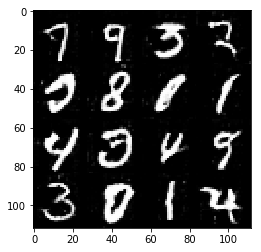

Epoch 2/2... Generator Loss: 1.4173 Discriminator Loss: 0.9754...
Epoch 2/2... Generator Loss: 2.1550 Discriminator Loss: 0.6283...
Epoch 2/2... Generator Loss: 3.2015 Discriminator Loss: 0.4560...
Epoch 2/2... Generator Loss: 0.9236 Discriminator Loss: 1.2577...
Epoch 2/2... Generator Loss: 2.0132 Discriminator Loss: 0.8176...
Epoch 2/2... Generator Loss: 1.6268 Discriminator Loss: 0.6529...
Epoch 2/2... Generator Loss: 1.9417 Discriminator Loss: 0.5510...
Epoch 2/2... Generator Loss: 1.6343 Discriminator Loss: 0.7455...
Epoch 2/2... Generator Loss: 2.1921 Discriminator Loss: 0.5632...
Epoch 2/2... Generator Loss: 1.4341 Discriminator Loss: 0.6896...


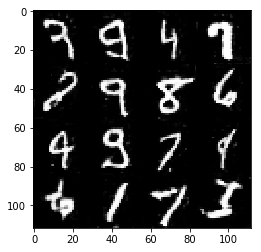

In [13]:
batch_size = 10
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

initial output:


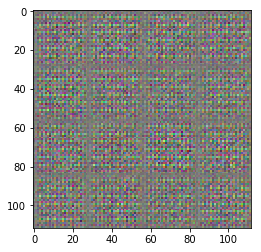

Epoch 1/1... Generator Loss: 6.7128 Discriminator Loss: 0.5137...
Epoch 1/1... Generator Loss: 0.3984 Discriminator Loss: 2.5788...
Epoch 1/1... Generator Loss: 0.4633 Discriminator Loss: 2.0025...
Epoch 1/1... Generator Loss: 6.6830 Discriminator Loss: 1.1965...
Epoch 1/1... Generator Loss: 0.9904 Discriminator Loss: 0.8262...
Epoch 1/1... Generator Loss: 3.4193 Discriminator Loss: 0.9845...
Epoch 1/1... Generator Loss: 2.6372 Discriminator Loss: 0.5784...
Epoch 1/1... Generator Loss: 3.8592 Discriminator Loss: 0.6886...
Epoch 1/1... Generator Loss: 3.1782 Discriminator Loss: 0.5410...
Epoch 1/1... Generator Loss: 0.7079 Discriminator Loss: 1.1697...


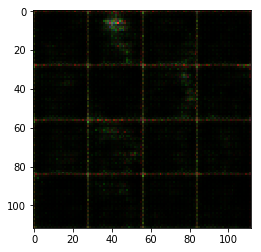

Epoch 1/1... Generator Loss: 5.0627 Discriminator Loss: 0.6463...
Epoch 1/1... Generator Loss: 4.1006 Discriminator Loss: 0.4955...
Epoch 1/1... Generator Loss: 0.6445 Discriminator Loss: 1.7872...
Epoch 1/1... Generator Loss: 0.9404 Discriminator Loss: 1.2641...
Epoch 1/1... Generator Loss: 2.2218 Discriminator Loss: 0.6799...
Epoch 1/1... Generator Loss: 2.7244 Discriminator Loss: 1.2199...
Epoch 1/1... Generator Loss: 0.4301 Discriminator Loss: 1.5784...
Epoch 1/1... Generator Loss: 2.0271 Discriminator Loss: 1.4015...
Epoch 1/1... Generator Loss: 0.9232 Discriminator Loss: 1.2104...
Epoch 1/1... Generator Loss: 1.1047 Discriminator Loss: 0.8811...


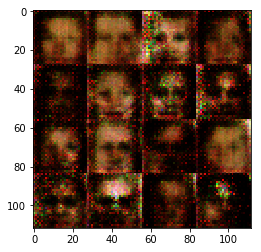

Epoch 1/1... Generator Loss: 1.3552 Discriminator Loss: 0.9413...
Epoch 1/1... Generator Loss: 1.5638 Discriminator Loss: 0.9841...
Epoch 1/1... Generator Loss: 0.2267 Discriminator Loss: 2.3445...
Epoch 1/1... Generator Loss: 0.7077 Discriminator Loss: 1.3625...
Epoch 1/1... Generator Loss: 0.4335 Discriminator Loss: 1.5698...
Epoch 1/1... Generator Loss: 2.3020 Discriminator Loss: 1.6217...
Epoch 1/1... Generator Loss: 2.0817 Discriminator Loss: 0.7422...
Epoch 1/1... Generator Loss: 0.3828 Discriminator Loss: 1.6191...
Epoch 1/1... Generator Loss: 2.4002 Discriminator Loss: 0.7539...
Epoch 1/1... Generator Loss: 2.1815 Discriminator Loss: 1.2095...


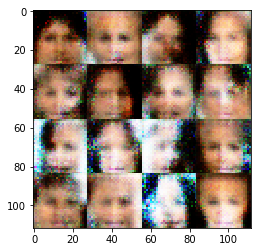

Epoch 1/1... Generator Loss: 2.0801 Discriminator Loss: 0.5859...
Epoch 1/1... Generator Loss: 1.0668 Discriminator Loss: 1.0616...
Epoch 1/1... Generator Loss: 1.0938 Discriminator Loss: 1.0656...
Epoch 1/1... Generator Loss: 1.0491 Discriminator Loss: 1.2489...
Epoch 1/1... Generator Loss: 1.2795 Discriminator Loss: 0.7593...
Epoch 1/1... Generator Loss: 1.6135 Discriminator Loss: 0.7539...
Epoch 1/1... Generator Loss: 0.3257 Discriminator Loss: 1.7400...
Epoch 1/1... Generator Loss: 1.3721 Discriminator Loss: 1.3415...
Epoch 1/1... Generator Loss: 0.6346 Discriminator Loss: 1.2373...
Epoch 1/1... Generator Loss: 0.6332 Discriminator Loss: 1.4673...


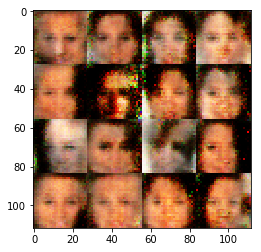

Epoch 1/1... Generator Loss: 0.5959 Discriminator Loss: 1.3853...
Epoch 1/1... Generator Loss: 0.2065 Discriminator Loss: 2.4453...
Epoch 1/1... Generator Loss: 0.2129 Discriminator Loss: 2.0446...
Epoch 1/1... Generator Loss: 1.7429 Discriminator Loss: 0.7624...
Epoch 1/1... Generator Loss: 1.6791 Discriminator Loss: 1.0891...
Epoch 1/1... Generator Loss: 1.3528 Discriminator Loss: 0.9443...
Epoch 1/1... Generator Loss: 0.6073 Discriminator Loss: 1.2745...
Epoch 1/1... Generator Loss: 1.2735 Discriminator Loss: 0.9224...
Epoch 1/1... Generator Loss: 0.2683 Discriminator Loss: 1.9368...
Epoch 1/1... Generator Loss: 0.9436 Discriminator Loss: 0.9649...


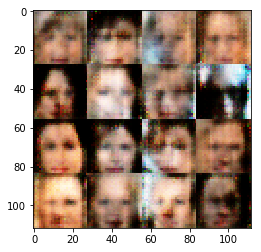

Epoch 1/1... Generator Loss: 1.1965 Discriminator Loss: 0.9091...
Epoch 1/1... Generator Loss: 0.2031 Discriminator Loss: 2.1772...
Epoch 1/1... Generator Loss: 0.6074 Discriminator Loss: 1.3678...
Epoch 1/1... Generator Loss: 1.5484 Discriminator Loss: 0.8812...
Epoch 1/1... Generator Loss: 0.5660 Discriminator Loss: 1.4914...
Epoch 1/1... Generator Loss: 1.0246 Discriminator Loss: 0.9323...
Epoch 1/1... Generator Loss: 1.0114 Discriminator Loss: 1.3275...
Epoch 1/1... Generator Loss: 0.7259 Discriminator Loss: 1.2251...
Epoch 1/1... Generator Loss: 0.7824 Discriminator Loss: 1.0308...
Epoch 1/1... Generator Loss: 0.3015 Discriminator Loss: 1.9099...


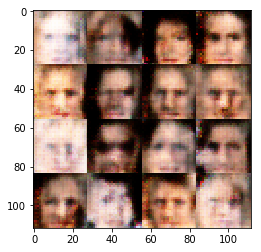

Epoch 1/1... Generator Loss: 0.7400 Discriminator Loss: 1.0963...
Epoch 1/1... Generator Loss: 1.3746 Discriminator Loss: 1.0427...
Epoch 1/1... Generator Loss: 1.2435 Discriminator Loss: 0.8373...
Epoch 1/1... Generator Loss: 1.0307 Discriminator Loss: 0.9352...
Epoch 1/1... Generator Loss: 0.9977 Discriminator Loss: 1.0831...
Epoch 1/1... Generator Loss: 0.4446 Discriminator Loss: 1.4702...
Epoch 1/1... Generator Loss: 1.6973 Discriminator Loss: 1.4622...
Epoch 1/1... Generator Loss: 0.6843 Discriminator Loss: 1.2495...
Epoch 1/1... Generator Loss: 0.8770 Discriminator Loss: 1.1910...
Epoch 1/1... Generator Loss: 0.6478 Discriminator Loss: 1.2454...


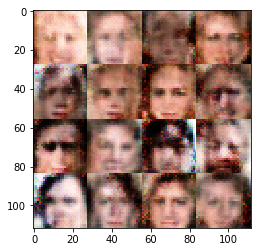

Epoch 1/1... Generator Loss: 1.3323 Discriminator Loss: 1.0346...
Epoch 1/1... Generator Loss: 1.0455 Discriminator Loss: 1.3030...
Epoch 1/1... Generator Loss: 1.0882 Discriminator Loss: 0.8669...
Epoch 1/1... Generator Loss: 1.1113 Discriminator Loss: 1.1622...
Epoch 1/1... Generator Loss: 0.6871 Discriminator Loss: 1.3903...
Epoch 1/1... Generator Loss: 0.8310 Discriminator Loss: 0.9755...
Epoch 1/1... Generator Loss: 1.3072 Discriminator Loss: 0.9030...
Epoch 1/1... Generator Loss: 0.9825 Discriminator Loss: 1.0067...
Epoch 1/1... Generator Loss: 1.5653 Discriminator Loss: 1.0580...
Epoch 1/1... Generator Loss: 1.1776 Discriminator Loss: 1.0068...


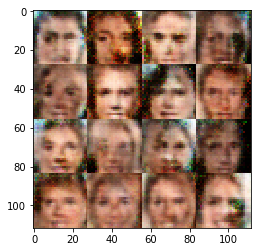

Epoch 1/1... Generator Loss: 0.5127 Discriminator Loss: 1.3704...
Epoch 1/1... Generator Loss: 0.5805 Discriminator Loss: 1.2484...
Epoch 1/1... Generator Loss: 0.8452 Discriminator Loss: 1.1333...
Epoch 1/1... Generator Loss: 0.8074 Discriminator Loss: 1.5048...
Epoch 1/1... Generator Loss: 0.7063 Discriminator Loss: 1.3179...
Epoch 1/1... Generator Loss: 0.9095 Discriminator Loss: 1.4219...
Epoch 1/1... Generator Loss: 0.4646 Discriminator Loss: 1.5608...
Epoch 1/1... Generator Loss: 0.7920 Discriminator Loss: 1.1642...
Epoch 1/1... Generator Loss: 0.8318 Discriminator Loss: 1.0601...
Epoch 1/1... Generator Loss: 1.1766 Discriminator Loss: 0.8819...


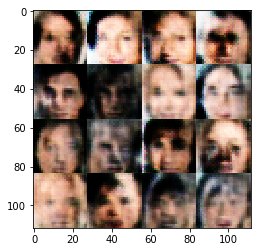

Epoch 1/1... Generator Loss: 0.8793 Discriminator Loss: 0.9442...
Epoch 1/1... Generator Loss: 2.7620 Discriminator Loss: 1.3774...
Epoch 1/1... Generator Loss: 1.3840 Discriminator Loss: 0.8174...
Epoch 1/1... Generator Loss: 1.1780 Discriminator Loss: 1.0124...
Epoch 1/1... Generator Loss: 0.8486 Discriminator Loss: 1.2139...
Epoch 1/1... Generator Loss: 1.1377 Discriminator Loss: 1.1003...
Epoch 1/1... Generator Loss: 0.6997 Discriminator Loss: 1.1898...
Epoch 1/1... Generator Loss: 0.8676 Discriminator Loss: 1.1247...
Epoch 1/1... Generator Loss: 0.6543 Discriminator Loss: 1.2533...
Epoch 1/1... Generator Loss: 0.9960 Discriminator Loss: 1.1812...


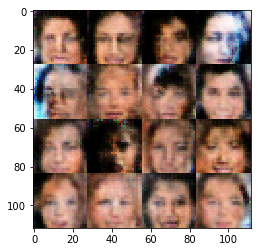

Epoch 1/1... Generator Loss: 0.5746 Discriminator Loss: 1.7939...
Epoch 1/1... Generator Loss: 0.9015 Discriminator Loss: 1.0775...
Epoch 1/1... Generator Loss: 0.9395 Discriminator Loss: 1.3568...
Epoch 1/1... Generator Loss: 0.6454 Discriminator Loss: 1.4212...
Epoch 1/1... Generator Loss: 0.8107 Discriminator Loss: 1.1341...
Epoch 1/1... Generator Loss: 1.0285 Discriminator Loss: 1.2191...
Epoch 1/1... Generator Loss: 0.5544 Discriminator Loss: 1.6661...
Epoch 1/1... Generator Loss: 0.9265 Discriminator Loss: 1.0860...
Epoch 1/1... Generator Loss: 1.0129 Discriminator Loss: 1.2561...
Epoch 1/1... Generator Loss: 0.7754 Discriminator Loss: 1.3583...


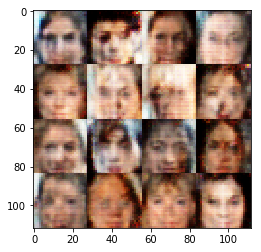

Epoch 1/1... Generator Loss: 0.3978 Discriminator Loss: 1.7855...
Epoch 1/1... Generator Loss: 0.6919 Discriminator Loss: 1.6632...
Epoch 1/1... Generator Loss: 0.6166 Discriminator Loss: 1.4333...
Epoch 1/1... Generator Loss: 0.6884 Discriminator Loss: 1.2358...
Epoch 1/1... Generator Loss: 1.1512 Discriminator Loss: 1.3273...
Epoch 1/1... Generator Loss: 0.7380 Discriminator Loss: 1.2970...
Epoch 1/1... Generator Loss: 1.4718 Discriminator Loss: 0.6628...
Epoch 1/1... Generator Loss: 0.6770 Discriminator Loss: 1.4859...
Epoch 1/1... Generator Loss: 0.3982 Discriminator Loss: 1.8561...
Epoch 1/1... Generator Loss: 0.5250 Discriminator Loss: 1.5272...


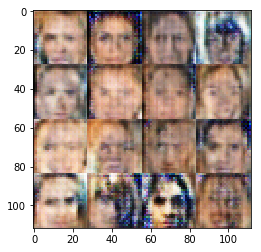

Epoch 1/1... Generator Loss: 0.9732 Discriminator Loss: 1.0447...
Epoch 1/1... Generator Loss: 0.6803 Discriminator Loss: 1.4131...
Epoch 1/1... Generator Loss: 0.6580 Discriminator Loss: 1.4688...
Epoch 1/1... Generator Loss: 0.6593 Discriminator Loss: 1.4051...
Epoch 1/1... Generator Loss: 0.8150 Discriminator Loss: 1.3057...
Epoch 1/1... Generator Loss: 1.2112 Discriminator Loss: 1.4657...
Epoch 1/1... Generator Loss: 0.6844 Discriminator Loss: 1.2364...
Epoch 1/1... Generator Loss: 0.6544 Discriminator Loss: 1.1830...
Epoch 1/1... Generator Loss: 0.6842 Discriminator Loss: 1.2855...
Epoch 1/1... Generator Loss: 0.8603 Discriminator Loss: 1.2868...


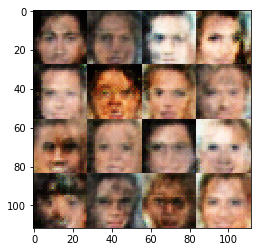

Epoch 1/1... Generator Loss: 0.6107 Discriminator Loss: 1.1864...
Epoch 1/1... Generator Loss: 0.4481 Discriminator Loss: 1.5888...
Epoch 1/1... Generator Loss: 0.7195 Discriminator Loss: 1.4123...
Epoch 1/1... Generator Loss: 0.7052 Discriminator Loss: 1.3033...
Epoch 1/1... Generator Loss: 0.6932 Discriminator Loss: 1.2499...
Epoch 1/1... Generator Loss: 0.7007 Discriminator Loss: 1.4235...
Epoch 1/1... Generator Loss: 0.6014 Discriminator Loss: 1.4221...
Epoch 1/1... Generator Loss: 1.0268 Discriminator Loss: 1.2051...
Epoch 1/1... Generator Loss: 0.8786 Discriminator Loss: 1.3895...
Epoch 1/1... Generator Loss: 0.6460 Discriminator Loss: 1.3526...


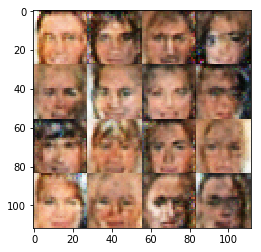

Epoch 1/1... Generator Loss: 0.7099 Discriminator Loss: 1.4675...
Epoch 1/1... Generator Loss: 0.6034 Discriminator Loss: 1.3687...
Epoch 1/1... Generator Loss: 0.9046 Discriminator Loss: 1.1615...
Epoch 1/1... Generator Loss: 0.7446 Discriminator Loss: 1.2142...
Epoch 1/1... Generator Loss: 1.0017 Discriminator Loss: 1.0973...
Epoch 1/1... Generator Loss: 0.6945 Discriminator Loss: 1.1969...
Epoch 1/1... Generator Loss: 0.6629 Discriminator Loss: 1.5042...
Epoch 1/1... Generator Loss: 0.4887 Discriminator Loss: 1.5372...
Epoch 1/1... Generator Loss: 0.8696 Discriminator Loss: 1.1175...
Epoch 1/1... Generator Loss: 0.7553 Discriminator Loss: 1.3642...


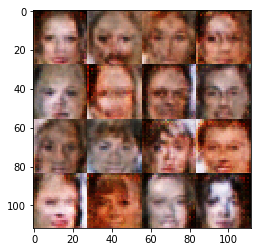

Epoch 1/1... Generator Loss: 1.1049 Discriminator Loss: 1.1730...
Epoch 1/1... Generator Loss: 1.0270 Discriminator Loss: 1.0829...
Epoch 1/1... Generator Loss: 0.7293 Discriminator Loss: 1.1031...
Epoch 1/1... Generator Loss: 0.6433 Discriminator Loss: 1.2698...
Epoch 1/1... Generator Loss: 0.4777 Discriminator Loss: 1.4558...
Epoch 1/1... Generator Loss: 0.6773 Discriminator Loss: 1.4708...
Epoch 1/1... Generator Loss: 0.8481 Discriminator Loss: 1.3907...
Epoch 1/1... Generator Loss: 0.7930 Discriminator Loss: 1.2237...
Epoch 1/1... Generator Loss: 0.7776 Discriminator Loss: 1.3095...
Epoch 1/1... Generator Loss: 0.6147 Discriminator Loss: 1.3834...


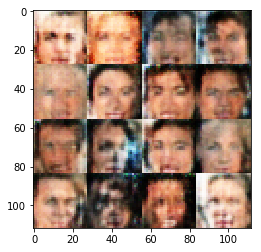

Epoch 1/1... Generator Loss: 0.9811 Discriminator Loss: 1.2484...
Epoch 1/1... Generator Loss: 0.9020 Discriminator Loss: 1.3886...
Epoch 1/1... Generator Loss: 0.6676 Discriminator Loss: 1.2492...
Epoch 1/1... Generator Loss: 0.7822 Discriminator Loss: 1.3586...
Epoch 1/1... Generator Loss: 1.1383 Discriminator Loss: 1.6208...
Epoch 1/1... Generator Loss: 0.7479 Discriminator Loss: 1.4691...
Epoch 1/1... Generator Loss: 0.7361 Discriminator Loss: 1.5585...
Epoch 1/1... Generator Loss: 0.7278 Discriminator Loss: 1.1723...
Epoch 1/1... Generator Loss: 0.6818 Discriminator Loss: 1.2639...
Epoch 1/1... Generator Loss: 0.6332 Discriminator Loss: 1.4810...


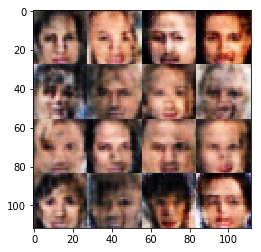

Epoch 1/1... Generator Loss: 0.8459 Discriminator Loss: 1.2536...
Epoch 1/1... Generator Loss: 0.6446 Discriminator Loss: 1.3077...
Epoch 1/1... Generator Loss: 0.5677 Discriminator Loss: 1.7850...
Epoch 1/1... Generator Loss: 0.7543 Discriminator Loss: 1.4085...
Epoch 1/1... Generator Loss: 0.6542 Discriminator Loss: 1.4758...
Epoch 1/1... Generator Loss: 0.9463 Discriminator Loss: 1.4439...
Epoch 1/1... Generator Loss: 0.8289 Discriminator Loss: 1.2903...
Epoch 1/1... Generator Loss: 0.7933 Discriminator Loss: 1.2499...
Epoch 1/1... Generator Loss: 0.8534 Discriminator Loss: 1.3921...
Epoch 1/1... Generator Loss: 0.7000 Discriminator Loss: 1.3969...


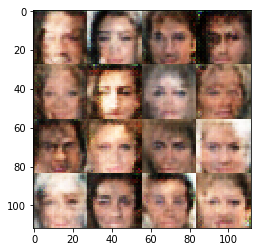

Epoch 1/1... Generator Loss: 0.7542 Discriminator Loss: 1.2325...
Epoch 1/1... Generator Loss: 0.8276 Discriminator Loss: 1.1871...
Epoch 1/1... Generator Loss: 0.6340 Discriminator Loss: 1.3490...
Epoch 1/1... Generator Loss: 1.1781 Discriminator Loss: 1.1849...
Epoch 1/1... Generator Loss: 0.8156 Discriminator Loss: 1.2524...
Epoch 1/1... Generator Loss: 0.5171 Discriminator Loss: 1.5412...
Epoch 1/1... Generator Loss: 0.8652 Discriminator Loss: 1.2088...
Epoch 1/1... Generator Loss: 0.7281 Discriminator Loss: 1.4758...
Epoch 1/1... Generator Loss: 0.6262 Discriminator Loss: 1.4137...
Epoch 1/1... Generator Loss: 0.7261 Discriminator Loss: 1.2044...


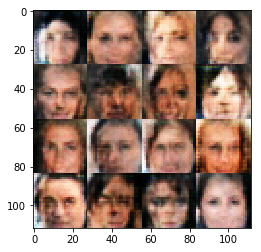

Epoch 1/1... Generator Loss: 0.7737 Discriminator Loss: 1.1481...
Epoch 1/1... Generator Loss: 0.6157 Discriminator Loss: 1.4505...
Epoch 1/1... Generator Loss: 0.3684 Discriminator Loss: 1.6536...
Epoch 1/1... Generator Loss: 0.7558 Discriminator Loss: 1.1905...
Epoch 1/1... Generator Loss: 0.4751 Discriminator Loss: 1.5969...
Epoch 1/1... Generator Loss: 0.8726 Discriminator Loss: 1.3485...
Epoch 1/1... Generator Loss: 0.6313 Discriminator Loss: 1.2656...
Epoch 1/1... Generator Loss: 0.7185 Discriminator Loss: 1.3268...
Epoch 1/1... Generator Loss: 0.8006 Discriminator Loss: 1.3051...
Epoch 1/1... Generator Loss: 0.4947 Discriminator Loss: 1.4883...


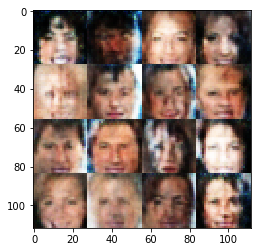

Epoch 1/1... Generator Loss: 0.5072 Discriminator Loss: 1.3337...
Epoch 1/1... Generator Loss: 0.4833 Discriminator Loss: 1.5560...
Epoch 1/1... Generator Loss: 0.7836 Discriminator Loss: 1.1954...
Epoch 1/1... Generator Loss: 0.7904 Discriminator Loss: 1.2302...
Epoch 1/1... Generator Loss: 0.7056 Discriminator Loss: 1.4830...
Epoch 1/1... Generator Loss: 1.0722 Discriminator Loss: 1.0024...
Epoch 1/1... Generator Loss: 0.6382 Discriminator Loss: 1.3328...
Epoch 1/1... Generator Loss: 0.5470 Discriminator Loss: 1.5644...
Epoch 1/1... Generator Loss: 0.6353 Discriminator Loss: 1.3127...
Epoch 1/1... Generator Loss: 0.5463 Discriminator Loss: 1.4174...


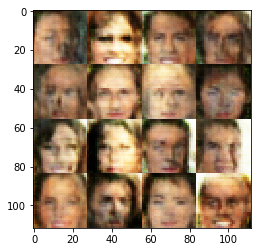

Epoch 1/1... Generator Loss: 0.6300 Discriminator Loss: 1.4663...
Epoch 1/1... Generator Loss: 0.7946 Discriminator Loss: 1.2896...
Epoch 1/1... Generator Loss: 0.5776 Discriminator Loss: 1.4484...
Epoch 1/1... Generator Loss: 0.7355 Discriminator Loss: 1.4291...
Epoch 1/1... Generator Loss: 0.7999 Discriminator Loss: 1.2606...
Epoch 1/1... Generator Loss: 0.8038 Discriminator Loss: 1.3522...
Epoch 1/1... Generator Loss: 0.7607 Discriminator Loss: 1.2381...
Epoch 1/1... Generator Loss: 0.8109 Discriminator Loss: 1.3337...
Epoch 1/1... Generator Loss: 0.8266 Discriminator Loss: 1.3364...
Epoch 1/1... Generator Loss: 0.5557 Discriminator Loss: 1.3966...


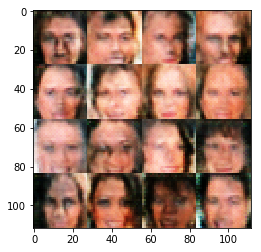

Epoch 1/1... Generator Loss: 0.3445 Discriminator Loss: 1.7922...
Epoch 1/1... Generator Loss: 0.9446 Discriminator Loss: 1.2082...
Epoch 1/1... Generator Loss: 0.5522 Discriminator Loss: 1.5727...
Epoch 1/1... Generator Loss: 0.8088 Discriminator Loss: 1.4037...
Epoch 1/1... Generator Loss: 0.5838 Discriminator Loss: 1.3163...
Epoch 1/1... Generator Loss: 0.8321 Discriminator Loss: 1.2897...
Epoch 1/1... Generator Loss: 0.6773 Discriminator Loss: 1.2882...
Epoch 1/1... Generator Loss: 0.8350 Discriminator Loss: 1.1298...
Epoch 1/1... Generator Loss: 0.5427 Discriminator Loss: 1.5500...
Epoch 1/1... Generator Loss: 0.7647 Discriminator Loss: 1.1652...


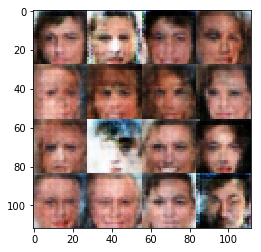

Epoch 1/1... Generator Loss: 0.6134 Discriminator Loss: 1.3568...
Epoch 1/1... Generator Loss: 0.7148 Discriminator Loss: 1.3560...
Epoch 1/1... Generator Loss: 0.5900 Discriminator Loss: 1.6069...
Epoch 1/1... Generator Loss: 0.5692 Discriminator Loss: 1.3881...
Epoch 1/1... Generator Loss: 0.8825 Discriminator Loss: 1.1679...
Epoch 1/1... Generator Loss: 0.8089 Discriminator Loss: 1.3729...
Epoch 1/1... Generator Loss: 0.8752 Discriminator Loss: 1.2546...
Epoch 1/1... Generator Loss: 0.7831 Discriminator Loss: 1.2461...
Epoch 1/1... Generator Loss: 0.8752 Discriminator Loss: 1.1788...
Epoch 1/1... Generator Loss: 0.5684 Discriminator Loss: 1.4643...


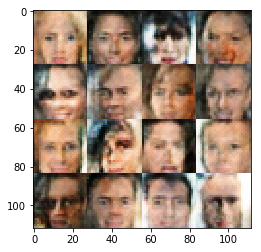

Epoch 1/1... Generator Loss: 0.6446 Discriminator Loss: 1.5578...
Epoch 1/1... Generator Loss: 0.7927 Discriminator Loss: 1.3556...
Epoch 1/1... Generator Loss: 0.7918 Discriminator Loss: 1.2670...
Epoch 1/1... Generator Loss: 0.5239 Discriminator Loss: 1.6315...
Epoch 1/1... Generator Loss: 0.8380 Discriminator Loss: 1.3155...
Epoch 1/1... Generator Loss: 0.6540 Discriminator Loss: 1.4745...
Epoch 1/1... Generator Loss: 0.5220 Discriminator Loss: 1.4506...
Epoch 1/1... Generator Loss: 0.6215 Discriminator Loss: 1.3649...
Epoch 1/1... Generator Loss: 0.8722 Discriminator Loss: 1.5656...
Epoch 1/1... Generator Loss: 0.6886 Discriminator Loss: 1.3081...


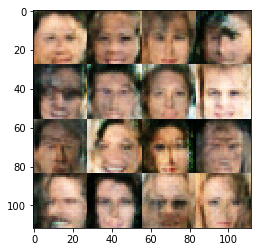

Epoch 1/1... Generator Loss: 0.4848 Discriminator Loss: 1.4203...
Epoch 1/1... Generator Loss: 0.5117 Discriminator Loss: 1.6626...
Epoch 1/1... Generator Loss: 0.5332 Discriminator Loss: 1.4279...
Epoch 1/1... Generator Loss: 0.7122 Discriminator Loss: 1.3323...
Epoch 1/1... Generator Loss: 0.5684 Discriminator Loss: 1.5401...
Epoch 1/1... Generator Loss: 0.9118 Discriminator Loss: 1.1095...
Epoch 1/1... Generator Loss: 0.6251 Discriminator Loss: 1.3991...
Epoch 1/1... Generator Loss: 1.0016 Discriminator Loss: 1.1902...
Epoch 1/1... Generator Loss: 0.8399 Discriminator Loss: 1.2509...
Epoch 1/1... Generator Loss: 0.9351 Discriminator Loss: 1.1051...


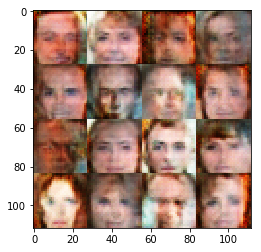

Epoch 1/1... Generator Loss: 1.3311 Discriminator Loss: 1.1394...
Epoch 1/1... Generator Loss: 0.6266 Discriminator Loss: 1.5505...
Epoch 1/1... Generator Loss: 0.5778 Discriminator Loss: 1.4171...
Epoch 1/1... Generator Loss: 0.5599 Discriminator Loss: 1.3103...
Epoch 1/1... Generator Loss: 0.6683 Discriminator Loss: 1.4258...
Epoch 1/1... Generator Loss: 0.5054 Discriminator Loss: 1.5627...
Epoch 1/1... Generator Loss: 0.7899 Discriminator Loss: 1.4930...
Epoch 1/1... Generator Loss: 0.6155 Discriminator Loss: 1.6422...
Epoch 1/1... Generator Loss: 0.7665 Discriminator Loss: 1.2833...
Epoch 1/1... Generator Loss: 0.7046 Discriminator Loss: 1.3576...


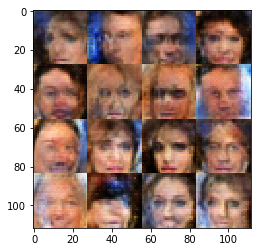

Epoch 1/1... Generator Loss: 0.9445 Discriminator Loss: 1.1118...
Epoch 1/1... Generator Loss: 0.9659 Discriminator Loss: 1.0323...
Epoch 1/1... Generator Loss: 0.7584 Discriminator Loss: 1.3264...
Epoch 1/1... Generator Loss: 0.8846 Discriminator Loss: 1.2614...
Epoch 1/1... Generator Loss: 0.7018 Discriminator Loss: 1.3923...
Epoch 1/1... Generator Loss: 0.5388 Discriminator Loss: 1.5512...
Epoch 1/1... Generator Loss: 0.8175 Discriminator Loss: 1.3779...
Epoch 1/1... Generator Loss: 0.6912 Discriminator Loss: 1.2818...
Epoch 1/1... Generator Loss: 0.6551 Discriminator Loss: 1.7374...
Epoch 1/1... Generator Loss: 0.6557 Discriminator Loss: 1.3006...


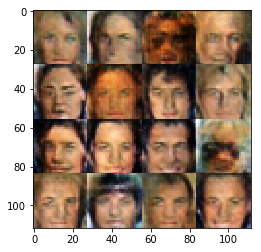

Epoch 1/1... Generator Loss: 0.9189 Discriminator Loss: 1.1332...
Epoch 1/1... Generator Loss: 0.5356 Discriminator Loss: 1.6664...
Epoch 1/1... Generator Loss: 0.7379 Discriminator Loss: 1.3206...
Epoch 1/1... Generator Loss: 1.1031 Discriminator Loss: 1.0628...
Epoch 1/1... Generator Loss: 0.5461 Discriminator Loss: 1.4360...
Epoch 1/1... Generator Loss: 0.9457 Discriminator Loss: 1.2955...
Epoch 1/1... Generator Loss: 0.5336 Discriminator Loss: 1.2612...
Epoch 1/1... Generator Loss: 0.8492 Discriminator Loss: 1.2907...
Epoch 1/1... Generator Loss: 0.6178 Discriminator Loss: 1.4220...
Epoch 1/1... Generator Loss: 0.6986 Discriminator Loss: 1.3462...


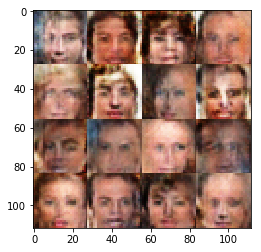

Epoch 1/1... Generator Loss: 0.5913 Discriminator Loss: 1.3740...
Epoch 1/1... Generator Loss: 0.7158 Discriminator Loss: 1.2653...
Epoch 1/1... Generator Loss: 0.8417 Discriminator Loss: 1.2365...
Epoch 1/1... Generator Loss: 0.7952 Discriminator Loss: 1.2520...
Epoch 1/1... Generator Loss: 0.6987 Discriminator Loss: 1.4298...
Epoch 1/1... Generator Loss: 0.9605 Discriminator Loss: 1.4251...
Epoch 1/1... Generator Loss: 0.7401 Discriminator Loss: 1.3687...
Epoch 1/1... Generator Loss: 0.7875 Discriminator Loss: 1.2863...
Epoch 1/1... Generator Loss: 0.7232 Discriminator Loss: 1.3553...
Epoch 1/1... Generator Loss: 0.9812 Discriminator Loss: 1.4127...


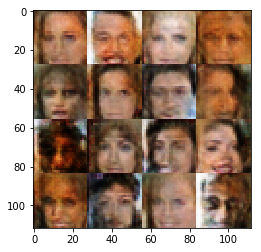

Epoch 1/1... Generator Loss: 0.6343 Discriminator Loss: 1.5502...
Epoch 1/1... Generator Loss: 0.6226 Discriminator Loss: 1.3336...
Epoch 1/1... Generator Loss: 0.6258 Discriminator Loss: 1.5711...
Epoch 1/1... Generator Loss: 0.7531 Discriminator Loss: 1.4805...
Epoch 1/1... Generator Loss: 1.0488 Discriminator Loss: 1.1297...
Epoch 1/1... Generator Loss: 0.6596 Discriminator Loss: 1.4304...
Epoch 1/1... Generator Loss: 0.7040 Discriminator Loss: 1.1176...
Epoch 1/1... Generator Loss: 0.6767 Discriminator Loss: 1.3867...
Epoch 1/1... Generator Loss: 0.6296 Discriminator Loss: 1.4042...
Epoch 1/1... Generator Loss: 0.5806 Discriminator Loss: 1.3821...


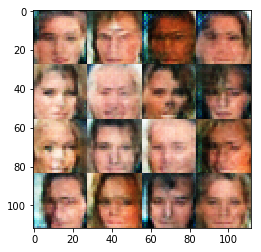

Epoch 1/1... Generator Loss: 0.6093 Discriminator Loss: 1.4575...
Epoch 1/1... Generator Loss: 0.9286 Discriminator Loss: 1.1612...
Epoch 1/1... Generator Loss: 0.8297 Discriminator Loss: 1.1915...
Epoch 1/1... Generator Loss: 0.7479 Discriminator Loss: 1.4553...
Epoch 1/1... Generator Loss: 0.6110 Discriminator Loss: 1.5921...
Epoch 1/1... Generator Loss: 0.7317 Discriminator Loss: 1.3652...
Epoch 1/1... Generator Loss: 0.8113 Discriminator Loss: 1.1547...
Epoch 1/1... Generator Loss: 0.7872 Discriminator Loss: 1.3024...
Epoch 1/1... Generator Loss: 0.4318 Discriminator Loss: 1.6050...
Epoch 1/1... Generator Loss: 0.7181 Discriminator Loss: 1.2606...


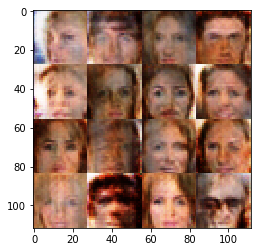

Epoch 1/1... Generator Loss: 0.8649 Discriminator Loss: 1.1025...
Epoch 1/1... Generator Loss: 0.8288 Discriminator Loss: 1.3671...
Epoch 1/1... Generator Loss: 0.4129 Discriminator Loss: 1.6982...
Epoch 1/1... Generator Loss: 0.7253 Discriminator Loss: 1.2908...
Epoch 1/1... Generator Loss: 0.8873 Discriminator Loss: 1.1827...
Epoch 1/1... Generator Loss: 0.5701 Discriminator Loss: 1.4945...
Epoch 1/1... Generator Loss: 0.6504 Discriminator Loss: 1.4547...
Epoch 1/1... Generator Loss: 0.8302 Discriminator Loss: 1.1730...
Epoch 1/1... Generator Loss: 0.5883 Discriminator Loss: 1.3536...
Epoch 1/1... Generator Loss: 0.6170 Discriminator Loss: 1.5681...


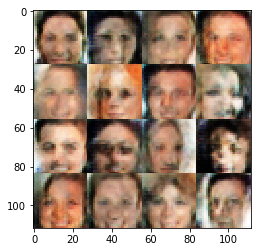

Epoch 1/1... Generator Loss: 0.8647 Discriminator Loss: 1.3189...
Epoch 1/1... Generator Loss: 0.7016 Discriminator Loss: 1.4145...
Epoch 1/1... Generator Loss: 0.8274 Discriminator Loss: 1.3230...
Epoch 1/1... Generator Loss: 0.6792 Discriminator Loss: 1.3332...
Epoch 1/1... Generator Loss: 0.5881 Discriminator Loss: 1.2522...
Epoch 1/1... Generator Loss: 0.7201 Discriminator Loss: 1.3013...
Epoch 1/1... Generator Loss: 0.7211 Discriminator Loss: 1.2581...
Epoch 1/1... Generator Loss: 0.6252 Discriminator Loss: 1.3997...
Epoch 1/1... Generator Loss: 0.7227 Discriminator Loss: 1.3015...
Epoch 1/1... Generator Loss: 0.7128 Discriminator Loss: 1.4453...


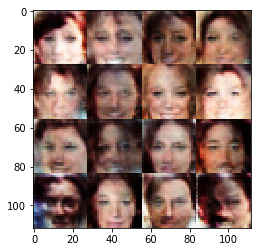

Epoch 1/1... Generator Loss: 0.7691 Discriminator Loss: 1.4168...
Epoch 1/1... Generator Loss: 0.8221 Discriminator Loss: 1.3329...
Epoch 1/1... Generator Loss: 0.5387 Discriminator Loss: 1.7074...
Epoch 1/1... Generator Loss: 0.6613 Discriminator Loss: 1.2103...
Epoch 1/1... Generator Loss: 0.9779 Discriminator Loss: 1.1963...
Epoch 1/1... Generator Loss: 0.6491 Discriminator Loss: 1.3697...
Epoch 1/1... Generator Loss: 0.9719 Discriminator Loss: 1.1664...
Epoch 1/1... Generator Loss: 0.7213 Discriminator Loss: 1.3379...
Epoch 1/1... Generator Loss: 0.8431 Discriminator Loss: 1.2057...
Epoch 1/1... Generator Loss: 0.5996 Discriminator Loss: 1.4101...


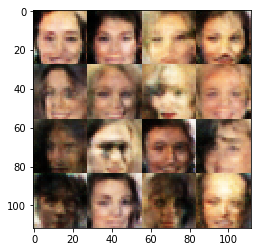

Epoch 1/1... Generator Loss: 0.6450 Discriminator Loss: 1.3542...
Epoch 1/1... Generator Loss: 0.7818 Discriminator Loss: 1.2823...
Epoch 1/1... Generator Loss: 0.8760 Discriminator Loss: 1.2649...
Epoch 1/1... Generator Loss: 0.6337 Discriminator Loss: 1.4010...
Epoch 1/1... Generator Loss: 0.9064 Discriminator Loss: 1.1483...
Epoch 1/1... Generator Loss: 0.7385 Discriminator Loss: 1.3637...
Epoch 1/1... Generator Loss: 0.6879 Discriminator Loss: 1.3954...
Epoch 1/1... Generator Loss: 0.6981 Discriminator Loss: 1.3179...
Epoch 1/1... Generator Loss: 0.5992 Discriminator Loss: 1.4205...
Epoch 1/1... Generator Loss: 0.7082 Discriminator Loss: 1.4971...


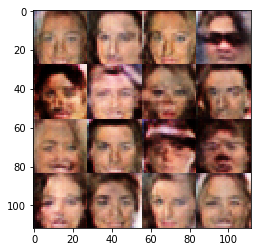

Epoch 1/1... Generator Loss: 0.7250 Discriminator Loss: 1.2665...
Epoch 1/1... Generator Loss: 0.7749 Discriminator Loss: 1.4172...
Epoch 1/1... Generator Loss: 0.6452 Discriminator Loss: 1.5273...
Epoch 1/1... Generator Loss: 0.7392 Discriminator Loss: 1.2657...
Epoch 1/1... Generator Loss: 0.8620 Discriminator Loss: 1.2641...
Epoch 1/1... Generator Loss: 0.5727 Discriminator Loss: 1.4792...
Epoch 1/1... Generator Loss: 0.6881 Discriminator Loss: 1.2237...
Epoch 1/1... Generator Loss: 0.6374 Discriminator Loss: 1.5126...
Epoch 1/1... Generator Loss: 0.6983 Discriminator Loss: 1.3626...
Epoch 1/1... Generator Loss: 0.6586 Discriminator Loss: 1.4704...


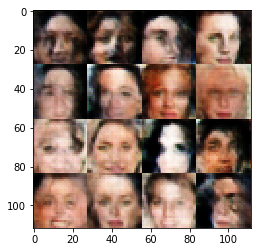

Epoch 1/1... Generator Loss: 0.7528 Discriminator Loss: 1.1991...
Epoch 1/1... Generator Loss: 0.6803 Discriminator Loss: 1.1954...
Epoch 1/1... Generator Loss: 0.8016 Discriminator Loss: 1.2212...
Epoch 1/1... Generator Loss: 0.7137 Discriminator Loss: 1.1869...
Epoch 1/1... Generator Loss: 0.6056 Discriminator Loss: 1.3686...
Epoch 1/1... Generator Loss: 0.8690 Discriminator Loss: 1.2519...
Epoch 1/1... Generator Loss: 0.6997 Discriminator Loss: 1.3468...
Epoch 1/1... Generator Loss: 0.7241 Discriminator Loss: 1.3348...
Epoch 1/1... Generator Loss: 0.6423 Discriminator Loss: 1.4942...
Epoch 1/1... Generator Loss: 0.7100 Discriminator Loss: 1.4146...


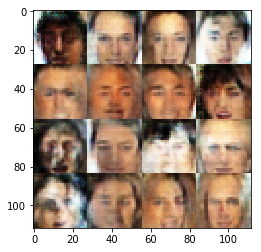

Epoch 1/1... Generator Loss: 0.7436 Discriminator Loss: 1.2448...
Epoch 1/1... Generator Loss: 0.7504 Discriminator Loss: 1.3716...
Epoch 1/1... Generator Loss: 0.7963 Discriminator Loss: 1.2080...
Epoch 1/1... Generator Loss: 0.7730 Discriminator Loss: 1.2733...
Epoch 1/1... Generator Loss: 0.8100 Discriminator Loss: 1.4281...
Epoch 1/1... Generator Loss: 0.7272 Discriminator Loss: 1.2920...
Epoch 1/1... Generator Loss: 0.7853 Discriminator Loss: 1.5017...
Epoch 1/1... Generator Loss: 0.7936 Discriminator Loss: 1.1040...
Epoch 1/1... Generator Loss: 0.8483 Discriminator Loss: 1.1367...
Epoch 1/1... Generator Loss: 0.5478 Discriminator Loss: 1.5545...


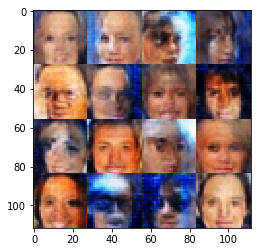

Epoch 1/1... Generator Loss: 0.5932 Discriminator Loss: 1.3524...
Epoch 1/1... Generator Loss: 0.6195 Discriminator Loss: 1.4499...
Epoch 1/1... Generator Loss: 0.6074 Discriminator Loss: 1.3774...
Epoch 1/1... Generator Loss: 0.5668 Discriminator Loss: 1.3425...
Epoch 1/1... Generator Loss: 0.5502 Discriminator Loss: 1.3319...
Epoch 1/1... Generator Loss: 0.8126 Discriminator Loss: 1.3246...
Epoch 1/1... Generator Loss: 0.8220 Discriminator Loss: 1.1550...
Epoch 1/1... Generator Loss: 0.7247 Discriminator Loss: 1.2392...
Epoch 1/1... Generator Loss: 0.7865 Discriminator Loss: 1.2372...
Epoch 1/1... Generator Loss: 0.8202 Discriminator Loss: 1.2175...


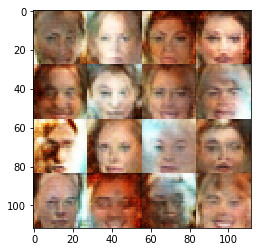

Epoch 1/1... Generator Loss: 0.7354 Discriminator Loss: 1.1673...
Epoch 1/1... Generator Loss: 0.4472 Discriminator Loss: 1.5974...
Epoch 1/1... Generator Loss: 0.5130 Discriminator Loss: 1.5217...
Epoch 1/1... Generator Loss: 0.4270 Discriminator Loss: 1.4551...
Epoch 1/1... Generator Loss: 0.6618 Discriminator Loss: 1.3056...
Epoch 1/1... Generator Loss: 0.8976 Discriminator Loss: 1.1395...
Epoch 1/1... Generator Loss: 0.8401 Discriminator Loss: 1.4184...
Epoch 1/1... Generator Loss: 0.6681 Discriminator Loss: 1.3468...
Epoch 1/1... Generator Loss: 1.0219 Discriminator Loss: 1.1604...
Epoch 1/1... Generator Loss: 0.5724 Discriminator Loss: 1.6042...


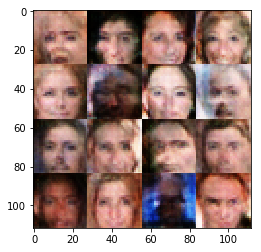

Epoch 1/1... Generator Loss: 0.6040 Discriminator Loss: 1.3629...
Epoch 1/1... Generator Loss: 0.7081 Discriminator Loss: 1.4221...
Epoch 1/1... Generator Loss: 0.6719 Discriminator Loss: 1.3700...
Epoch 1/1... Generator Loss: 0.7624 Discriminator Loss: 1.4583...
Epoch 1/1... Generator Loss: 0.7450 Discriminator Loss: 1.1474...
Epoch 1/1... Generator Loss: 0.7311 Discriminator Loss: 1.1936...
Epoch 1/1... Generator Loss: 0.6502 Discriminator Loss: 1.2534...
Epoch 1/1... Generator Loss: 0.9404 Discriminator Loss: 1.0318...
Epoch 1/1... Generator Loss: 0.9106 Discriminator Loss: 1.2388...
Epoch 1/1... Generator Loss: 0.7893 Discriminator Loss: 1.3443...


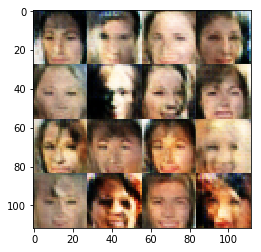

Epoch 1/1... Generator Loss: 0.5050 Discriminator Loss: 1.4535...
Epoch 1/1... Generator Loss: 0.6662 Discriminator Loss: 1.4890...
Epoch 1/1... Generator Loss: 0.6575 Discriminator Loss: 1.2859...
Epoch 1/1... Generator Loss: 0.5666 Discriminator Loss: 1.4406...
Epoch 1/1... Generator Loss: 0.6328 Discriminator Loss: 1.6589...
Epoch 1/1... Generator Loss: 0.4425 Discriminator Loss: 1.5673...
Epoch 1/1... Generator Loss: 0.6105 Discriminator Loss: 1.2677...
Epoch 1/1... Generator Loss: 0.6241 Discriminator Loss: 1.6319...
Epoch 1/1... Generator Loss: 0.5972 Discriminator Loss: 1.5516...
Epoch 1/1... Generator Loss: 0.6146 Discriminator Loss: 1.4103...


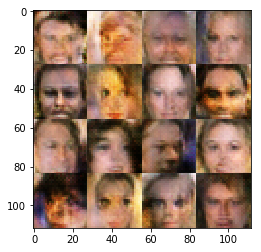

Epoch 1/1... Generator Loss: 0.7422 Discriminator Loss: 1.3069...
Epoch 1/1... Generator Loss: 0.3657 Discriminator Loss: 1.7993...
Epoch 1/1... Generator Loss: 0.8060 Discriminator Loss: 1.2966...
Epoch 1/1... Generator Loss: 0.8269 Discriminator Loss: 1.2200...
Epoch 1/1... Generator Loss: 0.7570 Discriminator Loss: 1.2708...
Epoch 1/1... Generator Loss: 0.4679 Discriminator Loss: 1.4611...
Epoch 1/1... Generator Loss: 0.6583 Discriminator Loss: 1.4461...
Epoch 1/1... Generator Loss: 0.6337 Discriminator Loss: 1.3544...
Epoch 1/1... Generator Loss: 0.3653 Discriminator Loss: 1.7430...
Epoch 1/1... Generator Loss: 0.5262 Discriminator Loss: 1.4776...


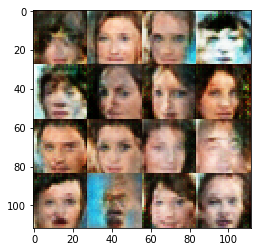

Epoch 1/1... Generator Loss: 0.7574 Discriminator Loss: 1.0472...
Epoch 1/1... Generator Loss: 0.7746 Discriminator Loss: 1.2546...
Epoch 1/1... Generator Loss: 0.9114 Discriminator Loss: 1.2218...
Epoch 1/1... Generator Loss: 0.6992 Discriminator Loss: 1.2725...
Epoch 1/1... Generator Loss: 0.7627 Discriminator Loss: 1.3178...
Epoch 1/1... Generator Loss: 0.5347 Discriminator Loss: 1.4771...
Epoch 1/1... Generator Loss: 0.5877 Discriminator Loss: 1.5283...
Epoch 1/1... Generator Loss: 0.8002 Discriminator Loss: 1.1602...
Epoch 1/1... Generator Loss: 0.8600 Discriminator Loss: 1.3070...
Epoch 1/1... Generator Loss: 0.6876 Discriminator Loss: 1.2909...


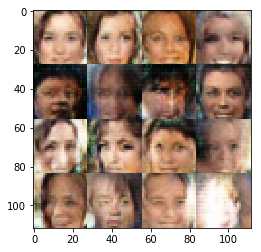

Epoch 1/1... Generator Loss: 0.6954 Discriminator Loss: 1.3845...
Epoch 1/1... Generator Loss: 0.7191 Discriminator Loss: 1.3265...
Epoch 1/1... Generator Loss: 0.6238 Discriminator Loss: 1.5262...
Epoch 1/1... Generator Loss: 0.8249 Discriminator Loss: 1.2566...
Epoch 1/1... Generator Loss: 0.6785 Discriminator Loss: 1.1568...
Epoch 1/1... Generator Loss: 0.5643 Discriminator Loss: 1.9074...
Epoch 1/1... Generator Loss: 0.6059 Discriminator Loss: 1.4113...
Epoch 1/1... Generator Loss: 0.5074 Discriminator Loss: 1.4359...
Epoch 1/1... Generator Loss: 0.4532 Discriminator Loss: 1.7229...
Epoch 1/1... Generator Loss: 0.7197 Discriminator Loss: 1.3055...


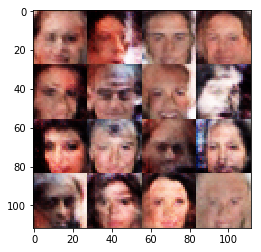

Epoch 1/1... Generator Loss: 0.7376 Discriminator Loss: 1.3989...
Epoch 1/1... Generator Loss: 1.0268 Discriminator Loss: 1.0451...
Epoch 1/1... Generator Loss: 0.7461 Discriminator Loss: 1.4010...
Epoch 1/1... Generator Loss: 0.8399 Discriminator Loss: 1.2552...
Epoch 1/1... Generator Loss: 0.5634 Discriminator Loss: 1.3696...
Epoch 1/1... Generator Loss: 0.5779 Discriminator Loss: 1.3778...
Epoch 1/1... Generator Loss: 0.5317 Discriminator Loss: 1.3886...
Epoch 1/1... Generator Loss: 0.6441 Discriminator Loss: 1.3754...
Epoch 1/1... Generator Loss: 0.7483 Discriminator Loss: 1.2349...
Epoch 1/1... Generator Loss: 1.0307 Discriminator Loss: 1.0721...


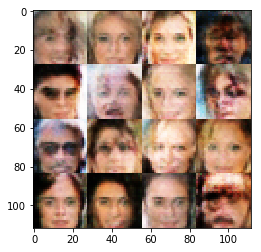

Epoch 1/1... Generator Loss: 0.6081 Discriminator Loss: 1.3801...
Epoch 1/1... Generator Loss: 1.0911 Discriminator Loss: 1.1122...
Epoch 1/1... Generator Loss: 0.6323 Discriminator Loss: 1.4985...
Epoch 1/1... Generator Loss: 0.8706 Discriminator Loss: 1.2454...
Epoch 1/1... Generator Loss: 1.0259 Discriminator Loss: 1.1359...
Epoch 1/1... Generator Loss: 0.6120 Discriminator Loss: 1.2862...
Epoch 1/1... Generator Loss: 0.7599 Discriminator Loss: 1.1268...
Epoch 1/1... Generator Loss: 0.8119 Discriminator Loss: 1.1997...
Epoch 1/1... Generator Loss: 0.5642 Discriminator Loss: 1.3639...
Epoch 1/1... Generator Loss: 0.7602 Discriminator Loss: 1.2757...


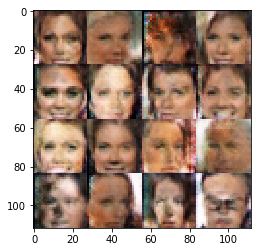

Epoch 1/1... Generator Loss: 0.7981 Discriminator Loss: 1.3058...
Epoch 1/1... Generator Loss: 0.8373 Discriminator Loss: 1.2400...
Epoch 1/1... Generator Loss: 0.5592 Discriminator Loss: 1.5514...
Epoch 1/1... Generator Loss: 0.8231 Discriminator Loss: 1.2621...
Epoch 1/1... Generator Loss: 0.8186 Discriminator Loss: 1.4146...
Epoch 1/1... Generator Loss: 0.6588 Discriminator Loss: 1.3256...
Epoch 1/1... Generator Loss: 0.6938 Discriminator Loss: 1.3050...
Epoch 1/1... Generator Loss: 0.9257 Discriminator Loss: 1.3103...
Epoch 1/1... Generator Loss: 1.0295 Discriminator Loss: 1.1137...
Epoch 1/1... Generator Loss: 0.7403 Discriminator Loss: 1.1693...


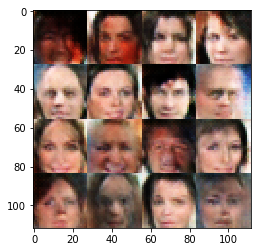

Epoch 1/1... Generator Loss: 0.7831 Discriminator Loss: 1.4205...
Epoch 1/1... Generator Loss: 0.5931 Discriminator Loss: 1.3542...
Epoch 1/1... Generator Loss: 0.4504 Discriminator Loss: 1.7217...
Epoch 1/1... Generator Loss: 0.7605 Discriminator Loss: 1.2794...
Epoch 1/1... Generator Loss: 0.8094 Discriminator Loss: 1.2821...
Epoch 1/1... Generator Loss: 0.7728 Discriminator Loss: 1.3739...
Epoch 1/1... Generator Loss: 0.7442 Discriminator Loss: 1.3853...
Epoch 1/1... Generator Loss: 0.6955 Discriminator Loss: 1.3165...
Epoch 1/1... Generator Loss: 0.8245 Discriminator Loss: 1.1056...
Epoch 1/1... Generator Loss: 0.5263 Discriminator Loss: 1.5241...


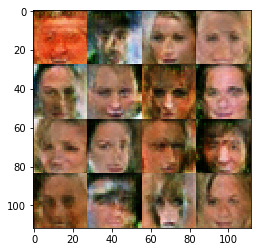

Epoch 1/1... Generator Loss: 0.8220 Discriminator Loss: 1.1109...
Epoch 1/1... Generator Loss: 0.8742 Discriminator Loss: 1.3243...
Epoch 1/1... Generator Loss: 0.7712 Discriminator Loss: 1.4928...
Epoch 1/1... Generator Loss: 0.8092 Discriminator Loss: 1.3022...
Epoch 1/1... Generator Loss: 0.8630 Discriminator Loss: 1.2824...
Epoch 1/1... Generator Loss: 1.0424 Discriminator Loss: 1.1003...
Epoch 1/1... Generator Loss: 0.6469 Discriminator Loss: 1.4145...
Epoch 1/1... Generator Loss: 0.5649 Discriminator Loss: 1.4626...
Epoch 1/1... Generator Loss: 0.7714 Discriminator Loss: 1.1800...
Epoch 1/1... Generator Loss: 0.7335 Discriminator Loss: 1.3451...


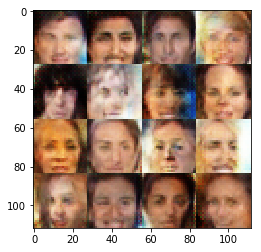

Epoch 1/1... Generator Loss: 0.8741 Discriminator Loss: 1.2737...
Epoch 1/1... Generator Loss: 0.7603 Discriminator Loss: 1.3871...
Epoch 1/1... Generator Loss: 0.5856 Discriminator Loss: 1.5407...
Epoch 1/1... Generator Loss: 1.1171 Discriminator Loss: 0.9946...
Epoch 1/1... Generator Loss: 0.7981 Discriminator Loss: 1.4550...
Epoch 1/1... Generator Loss: 1.0295 Discriminator Loss: 1.1794...
Epoch 1/1... Generator Loss: 0.5487 Discriminator Loss: 1.2703...
Epoch 1/1... Generator Loss: 0.7045 Discriminator Loss: 1.4302...
Epoch 1/1... Generator Loss: 0.6825 Discriminator Loss: 1.3310...
Epoch 1/1... Generator Loss: 0.9475 Discriminator Loss: 1.1715...


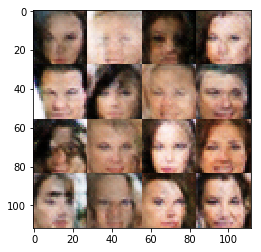

Epoch 1/1... Generator Loss: 0.8562 Discriminator Loss: 1.1935...
Epoch 1/1... Generator Loss: 0.5747 Discriminator Loss: 1.4206...
Epoch 1/1... Generator Loss: 0.9464 Discriminator Loss: 1.2412...
Epoch 1/1... Generator Loss: 0.7475 Discriminator Loss: 1.3192...
Epoch 1/1... Generator Loss: 0.9202 Discriminator Loss: 1.2501...
Epoch 1/1... Generator Loss: 0.8354 Discriminator Loss: 1.2471...
Epoch 1/1... Generator Loss: 0.5429 Discriminator Loss: 1.5060...
Epoch 1/1... Generator Loss: 0.7503 Discriminator Loss: 1.1382...
Epoch 1/1... Generator Loss: 0.7716 Discriminator Loss: 1.4069...
Epoch 1/1... Generator Loss: 0.4895 Discriminator Loss: 1.4991...


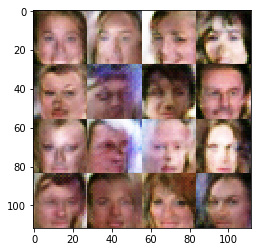

Epoch 1/1... Generator Loss: 0.7475 Discriminator Loss: 1.1665...
Epoch 1/1... Generator Loss: 0.8623 Discriminator Loss: 1.1496...
Epoch 1/1... Generator Loss: 0.6307 Discriminator Loss: 1.4360...
Epoch 1/1... Generator Loss: 0.4127 Discriminator Loss: 1.7737...
Epoch 1/1... Generator Loss: 0.7656 Discriminator Loss: 1.1668...
Epoch 1/1... Generator Loss: 0.7768 Discriminator Loss: 1.2223...
Epoch 1/1... Generator Loss: 0.8896 Discriminator Loss: 1.3477...
Epoch 1/1... Generator Loss: 0.4133 Discriminator Loss: 1.5545...
Epoch 1/1... Generator Loss: 0.8643 Discriminator Loss: 1.2875...
Epoch 1/1... Generator Loss: 0.6559 Discriminator Loss: 1.2522...


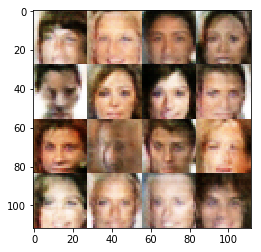

Epoch 1/1... Generator Loss: 0.6962 Discriminator Loss: 1.4683...
Epoch 1/1... Generator Loss: 0.7565 Discriminator Loss: 1.2853...
Epoch 1/1... Generator Loss: 0.7603 Discriminator Loss: 1.2722...
Epoch 1/1... Generator Loss: 0.5406 Discriminator Loss: 1.5138...
Epoch 1/1... Generator Loss: 0.8844 Discriminator Loss: 1.1828...
Epoch 1/1... Generator Loss: 0.8497 Discriminator Loss: 1.2300...
Epoch 1/1... Generator Loss: 0.5733 Discriminator Loss: 1.3363...
Epoch 1/1... Generator Loss: 0.6519 Discriminator Loss: 1.4663...
Epoch 1/1... Generator Loss: 0.7031 Discriminator Loss: 1.2811...
Epoch 1/1... Generator Loss: 0.9225 Discriminator Loss: 1.1481...


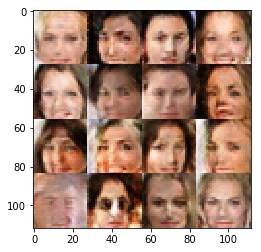

Epoch 1/1... Generator Loss: 0.8945 Discriminator Loss: 1.3357...
Epoch 1/1... Generator Loss: 0.9277 Discriminator Loss: 1.0870...
Epoch 1/1... Generator Loss: 0.6108 Discriminator Loss: 1.3549...
Epoch 1/1... Generator Loss: 1.0698 Discriminator Loss: 1.0032...
Epoch 1/1... Generator Loss: 0.6530 Discriminator Loss: 1.2426...
Epoch 1/1... Generator Loss: 0.5823 Discriminator Loss: 1.5498...
Epoch 1/1... Generator Loss: 0.6450 Discriminator Loss: 1.2987...
Epoch 1/1... Generator Loss: 0.7403 Discriminator Loss: 1.4280...
Epoch 1/1... Generator Loss: 0.6857 Discriminator Loss: 1.3171...
Epoch 1/1... Generator Loss: 0.9026 Discriminator Loss: 1.2313...


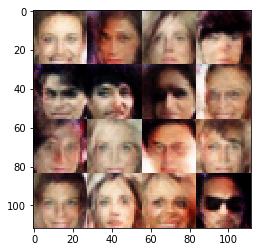

Epoch 1/1... Generator Loss: 0.8018 Discriminator Loss: 1.2916...
Epoch 1/1... Generator Loss: 0.7358 Discriminator Loss: 1.4011...
Epoch 1/1... Generator Loss: 0.6940 Discriminator Loss: 1.1889...
Epoch 1/1... Generator Loss: 0.7683 Discriminator Loss: 1.2016...
Epoch 1/1... Generator Loss: 0.6767 Discriminator Loss: 1.4602...
Epoch 1/1... Generator Loss: 0.7027 Discriminator Loss: 1.3083...
Epoch 1/1... Generator Loss: 0.8801 Discriminator Loss: 1.3509...
Epoch 1/1... Generator Loss: 0.7330 Discriminator Loss: 1.3375...
Epoch 1/1... Generator Loss: 0.5024 Discriminator Loss: 1.8385...
Epoch 1/1... Generator Loss: 0.7610 Discriminator Loss: 1.3343...


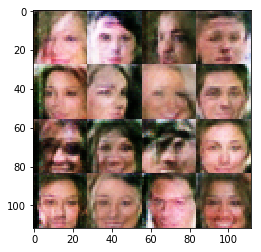

Epoch 1/1... Generator Loss: 0.7006 Discriminator Loss: 1.3322...
Epoch 1/1... Generator Loss: 0.9045 Discriminator Loss: 1.0340...
Epoch 1/1... Generator Loss: 0.6096 Discriminator Loss: 1.5180...
Epoch 1/1... Generator Loss: 0.4992 Discriminator Loss: 1.4899...
Epoch 1/1... Generator Loss: 0.6465 Discriminator Loss: 1.4251...
Epoch 1/1... Generator Loss: 0.7196 Discriminator Loss: 1.5544...
Epoch 1/1... Generator Loss: 0.8166 Discriminator Loss: 1.3030...
Epoch 1/1... Generator Loss: 0.9676 Discriminator Loss: 1.2460...
Epoch 1/1... Generator Loss: 0.5467 Discriminator Loss: 1.4356...
Epoch 1/1... Generator Loss: 0.5363 Discriminator Loss: 1.4626...


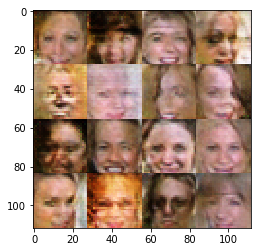

Epoch 1/1... Generator Loss: 0.8553 Discriminator Loss: 1.0030...
Epoch 1/1... Generator Loss: 0.4975 Discriminator Loss: 1.4581...
Epoch 1/1... Generator Loss: 0.4705 Discriminator Loss: 1.6448...
Epoch 1/1... Generator Loss: 0.5869 Discriminator Loss: 1.5058...
Epoch 1/1... Generator Loss: 0.8402 Discriminator Loss: 1.2742...
Epoch 1/1... Generator Loss: 0.6790 Discriminator Loss: 1.3580...
Epoch 1/1... Generator Loss: 0.5767 Discriminator Loss: 1.4275...
Epoch 1/1... Generator Loss: 0.7933 Discriminator Loss: 1.2051...
Epoch 1/1... Generator Loss: 0.5149 Discriminator Loss: 1.5899...
Epoch 1/1... Generator Loss: 0.6962 Discriminator Loss: 1.3778...


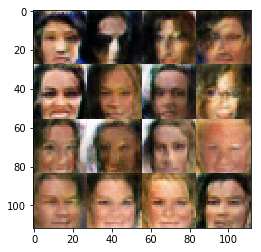

Epoch 1/1... Generator Loss: 0.6350 Discriminator Loss: 1.3746...
Epoch 1/1... Generator Loss: 0.6649 Discriminator Loss: 1.3221...
Epoch 1/1... Generator Loss: 0.8945 Discriminator Loss: 1.2462...
Epoch 1/1... Generator Loss: 0.5391 Discriminator Loss: 1.5579...
Epoch 1/1... Generator Loss: 0.7425 Discriminator Loss: 1.2959...
Epoch 1/1... Generator Loss: 0.6526 Discriminator Loss: 1.2625...
Epoch 1/1... Generator Loss: 0.7464 Discriminator Loss: 1.4383...
Epoch 1/1... Generator Loss: 0.9005 Discriminator Loss: 1.2250...
Epoch 1/1... Generator Loss: 0.5552 Discriminator Loss: 1.3015...
Epoch 1/1... Generator Loss: 0.8360 Discriminator Loss: 1.1973...


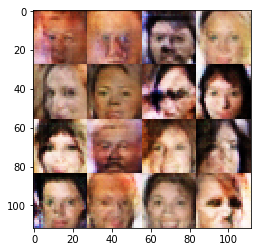

Epoch 1/1... Generator Loss: 0.5757 Discriminator Loss: 1.5739...
Epoch 1/1... Generator Loss: 0.5858 Discriminator Loss: 1.3993...
Epoch 1/1... Generator Loss: 1.0666 Discriminator Loss: 1.0575...
Epoch 1/1... Generator Loss: 0.6800 Discriminator Loss: 1.5728...
Epoch 1/1... Generator Loss: 0.6049 Discriminator Loss: 1.4366...
Epoch 1/1... Generator Loss: 0.8192 Discriminator Loss: 1.3651...
Epoch 1/1... Generator Loss: 0.8694 Discriminator Loss: 1.2661...
Epoch 1/1... Generator Loss: 0.7058 Discriminator Loss: 1.2374...
Epoch 1/1... Generator Loss: 0.7774 Discriminator Loss: 1.3728...
Epoch 1/1... Generator Loss: 0.8031 Discriminator Loss: 1.0652...


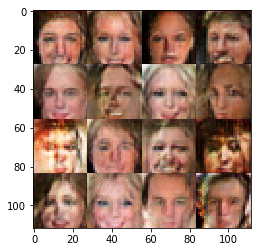

Epoch 1/1... Generator Loss: 0.6914 Discriminator Loss: 1.1863...
Epoch 1/1... Generator Loss: 0.5727 Discriminator Loss: 1.5177...
Epoch 1/1... Generator Loss: 0.7480 Discriminator Loss: 1.4444...
Epoch 1/1... Generator Loss: 0.8800 Discriminator Loss: 1.2500...
Epoch 1/1... Generator Loss: 0.7509 Discriminator Loss: 1.3131...
Epoch 1/1... Generator Loss: 0.6703 Discriminator Loss: 1.3391...
Epoch 1/1... Generator Loss: 0.5899 Discriminator Loss: 1.5445...
Epoch 1/1... Generator Loss: 0.8021 Discriminator Loss: 1.2151...
Epoch 1/1... Generator Loss: 0.6610 Discriminator Loss: 1.4502...
Epoch 1/1... Generator Loss: 0.7338 Discriminator Loss: 1.3023...


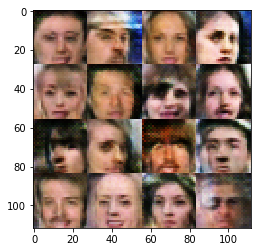

Epoch 1/1... Generator Loss: 0.7267 Discriminator Loss: 1.3220...
Epoch 1/1... Generator Loss: 0.6064 Discriminator Loss: 1.4609...
Epoch 1/1... Generator Loss: 0.7985 Discriminator Loss: 1.3036...
Epoch 1/1... Generator Loss: 0.8552 Discriminator Loss: 1.3865...
Epoch 1/1... Generator Loss: 0.8533 Discriminator Loss: 1.1096...
Epoch 1/1... Generator Loss: 0.6377 Discriminator Loss: 1.3107...
Epoch 1/1... Generator Loss: 0.5693 Discriminator Loss: 1.5933...
Epoch 1/1... Generator Loss: 0.6620 Discriminator Loss: 1.3178...
Epoch 1/1... Generator Loss: 0.7733 Discriminator Loss: 1.4008...
Epoch 1/1... Generator Loss: 0.8802 Discriminator Loss: 1.2514...


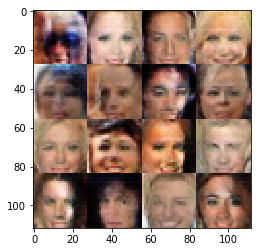

Epoch 1/1... Generator Loss: 0.7034 Discriminator Loss: 1.3792...
Epoch 1/1... Generator Loss: 0.6768 Discriminator Loss: 1.4203...
Epoch 1/1... Generator Loss: 0.6672 Discriminator Loss: 1.4147...
Epoch 1/1... Generator Loss: 0.5033 Discriminator Loss: 1.7823...
Epoch 1/1... Generator Loss: 0.7968 Discriminator Loss: 1.2059...
Epoch 1/1... Generator Loss: 0.8119 Discriminator Loss: 1.3180...
Epoch 1/1... Generator Loss: 0.5166 Discriminator Loss: 1.4224...
Epoch 1/1... Generator Loss: 0.8102 Discriminator Loss: 1.3535...
Epoch 1/1... Generator Loss: 0.9554 Discriminator Loss: 1.0337...
Epoch 1/1... Generator Loss: 0.8798 Discriminator Loss: 1.2352...


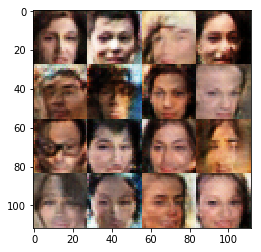

Epoch 1/1... Generator Loss: 0.6474 Discriminator Loss: 1.5038...
Epoch 1/1... Generator Loss: 0.8795 Discriminator Loss: 1.1928...
Epoch 1/1... Generator Loss: 0.6192 Discriminator Loss: 1.4291...
Epoch 1/1... Generator Loss: 0.6105 Discriminator Loss: 1.4052...
Epoch 1/1... Generator Loss: 0.4882 Discriminator Loss: 1.3972...
Epoch 1/1... Generator Loss: 0.6660 Discriminator Loss: 1.4115...
Epoch 1/1... Generator Loss: 0.9174 Discriminator Loss: 1.1532...
Epoch 1/1... Generator Loss: 0.9798 Discriminator Loss: 1.0456...
Epoch 1/1... Generator Loss: 0.8260 Discriminator Loss: 1.4066...
Epoch 1/1... Generator Loss: 0.5576 Discriminator Loss: 1.5682...


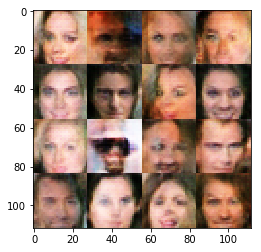

Epoch 1/1... Generator Loss: 0.6586 Discriminator Loss: 1.2392...
Epoch 1/1... Generator Loss: 0.9680 Discriminator Loss: 1.0996...
Epoch 1/1... Generator Loss: 0.6532 Discriminator Loss: 1.4383...
Epoch 1/1... Generator Loss: 0.5688 Discriminator Loss: 1.4005...
Epoch 1/1... Generator Loss: 0.6457 Discriminator Loss: 1.3441...
Epoch 1/1... Generator Loss: 0.6231 Discriminator Loss: 1.3816...
Epoch 1/1... Generator Loss: 0.7931 Discriminator Loss: 1.3615...
Epoch 1/1... Generator Loss: 0.5640 Discriminator Loss: 1.6162...
Epoch 1/1... Generator Loss: 0.5933 Discriminator Loss: 1.4076...
Epoch 1/1... Generator Loss: 0.7915 Discriminator Loss: 1.2758...


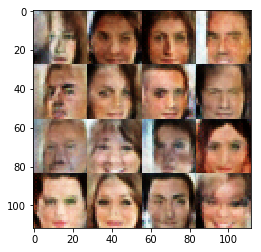

Epoch 1/1... Generator Loss: 0.9753 Discriminator Loss: 1.2098...
Epoch 1/1... Generator Loss: 0.7629 Discriminator Loss: 1.1214...
Epoch 1/1... Generator Loss: 0.6668 Discriminator Loss: 1.3528...
Epoch 1/1... Generator Loss: 0.5782 Discriminator Loss: 1.4673...
Epoch 1/1... Generator Loss: 0.7958 Discriminator Loss: 1.3246...
Epoch 1/1... Generator Loss: 0.7835 Discriminator Loss: 1.4359...
Epoch 1/1... Generator Loss: 0.8452 Discriminator Loss: 1.2364...
Epoch 1/1... Generator Loss: 0.6472 Discriminator Loss: 1.3582...
Epoch 1/1... Generator Loss: 0.7919 Discriminator Loss: 1.1951...
Epoch 1/1... Generator Loss: 0.6128 Discriminator Loss: 1.4149...


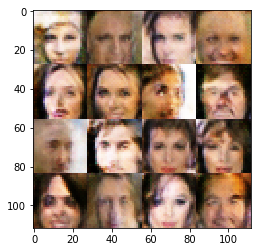

Epoch 1/1... Generator Loss: 0.7385 Discriminator Loss: 1.3073...
Epoch 1/1... Generator Loss: 0.6166 Discriminator Loss: 1.3631...
Epoch 1/1... Generator Loss: 0.8387 Discriminator Loss: 1.3138...
Epoch 1/1... Generator Loss: 0.6401 Discriminator Loss: 1.3910...
Epoch 1/1... Generator Loss: 0.5673 Discriminator Loss: 1.4166...
Epoch 1/1... Generator Loss: 0.7850 Discriminator Loss: 1.1917...
Epoch 1/1... Generator Loss: 0.5708 Discriminator Loss: 1.4175...
Epoch 1/1... Generator Loss: 0.7530 Discriminator Loss: 1.3093...
Epoch 1/1... Generator Loss: 0.8236 Discriminator Loss: 1.1991...
Epoch 1/1... Generator Loss: 0.6507 Discriminator Loss: 1.5046...


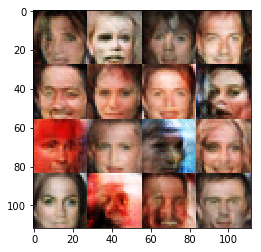

Epoch 1/1... Generator Loss: 0.6922 Discriminator Loss: 1.3887...
Epoch 1/1... Generator Loss: 0.7417 Discriminator Loss: 1.3075...
Epoch 1/1... Generator Loss: 0.6814 Discriminator Loss: 1.3358...
Epoch 1/1... Generator Loss: 0.7240 Discriminator Loss: 1.3121...
Epoch 1/1... Generator Loss: 0.7022 Discriminator Loss: 1.3711...
Epoch 1/1... Generator Loss: 0.8583 Discriminator Loss: 1.3155...
Epoch 1/1... Generator Loss: 0.5847 Discriminator Loss: 1.5747...
Epoch 1/1... Generator Loss: 0.6871 Discriminator Loss: 1.3714...
Epoch 1/1... Generator Loss: 0.8588 Discriminator Loss: 1.4149...
Epoch 1/1... Generator Loss: 0.7374 Discriminator Loss: 1.2003...


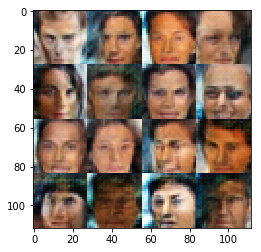

Epoch 1/1... Generator Loss: 0.6310 Discriminator Loss: 1.3673...
Epoch 1/1... Generator Loss: 0.6799 Discriminator Loss: 1.3947...
Epoch 1/1... Generator Loss: 0.7408 Discriminator Loss: 1.5072...
Epoch 1/1... Generator Loss: 0.7734 Discriminator Loss: 1.2810...
Epoch 1/1... Generator Loss: 0.9091 Discriminator Loss: 1.2872...
Epoch 1/1... Generator Loss: 0.5224 Discriminator Loss: 1.6082...
Epoch 1/1... Generator Loss: 0.8154 Discriminator Loss: 1.2516...
Epoch 1/1... Generator Loss: 0.4368 Discriminator Loss: 1.5395...
Epoch 1/1... Generator Loss: 0.6750 Discriminator Loss: 1.3228...
Epoch 1/1... Generator Loss: 0.7219 Discriminator Loss: 1.5063...


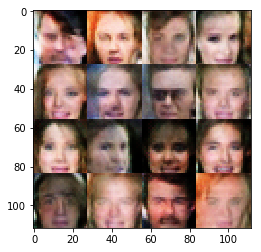

Epoch 1/1... Generator Loss: 0.7340 Discriminator Loss: 1.3323...
Epoch 1/1... Generator Loss: 0.5327 Discriminator Loss: 1.5122...
Epoch 1/1... Generator Loss: 0.5677 Discriminator Loss: 1.4430...
Epoch 1/1... Generator Loss: 0.8923 Discriminator Loss: 1.1509...
Epoch 1/1... Generator Loss: 0.7882 Discriminator Loss: 1.0316...
Epoch 1/1... Generator Loss: 0.6940 Discriminator Loss: 1.3435...
Epoch 1/1... Generator Loss: 0.7951 Discriminator Loss: 1.1617...
Epoch 1/1... Generator Loss: 0.5602 Discriminator Loss: 1.5078...
Epoch 1/1... Generator Loss: 0.6299 Discriminator Loss: 1.5275...
Epoch 1/1... Generator Loss: 0.6439 Discriminator Loss: 1.4653...


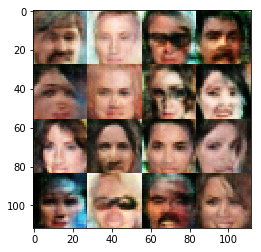

Epoch 1/1... Generator Loss: 0.8630 Discriminator Loss: 1.1525...
Epoch 1/1... Generator Loss: 0.7024 Discriminator Loss: 1.5282...
Epoch 1/1... Generator Loss: 0.5585 Discriminator Loss: 1.4655...
Epoch 1/1... Generator Loss: 0.8753 Discriminator Loss: 1.2557...
Epoch 1/1... Generator Loss: 0.7345 Discriminator Loss: 1.4289...
Epoch 1/1... Generator Loss: 0.6021 Discriminator Loss: 1.3370...
Epoch 1/1... Generator Loss: 0.7355 Discriminator Loss: 1.1638...
Epoch 1/1... Generator Loss: 0.6081 Discriminator Loss: 1.3808...
Epoch 1/1... Generator Loss: 0.7907 Discriminator Loss: 1.3833...
Epoch 1/1... Generator Loss: 0.8145 Discriminator Loss: 1.3984...


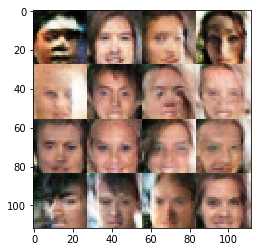

Epoch 1/1... Generator Loss: 0.4764 Discriminator Loss: 1.6083...
Epoch 1/1... Generator Loss: 0.7870 Discriminator Loss: 1.1551...
Epoch 1/1... Generator Loss: 0.7005 Discriminator Loss: 1.3868...
Epoch 1/1... Generator Loss: 0.7528 Discriminator Loss: 1.4104...
Epoch 1/1... Generator Loss: 0.6599 Discriminator Loss: 1.3437...
Epoch 1/1... Generator Loss: 0.7937 Discriminator Loss: 1.2608...
Epoch 1/1... Generator Loss: 0.5878 Discriminator Loss: 1.2200...
Epoch 1/1... Generator Loss: 0.6011 Discriminator Loss: 1.5327...
Epoch 1/1... Generator Loss: 0.5737 Discriminator Loss: 1.4709...
Epoch 1/1... Generator Loss: 0.5809 Discriminator Loss: 1.3934...


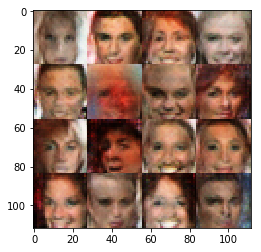

Epoch 1/1... Generator Loss: 0.8044 Discriminator Loss: 1.2547...
Epoch 1/1... Generator Loss: 0.6882 Discriminator Loss: 1.3749...
Epoch 1/1... Generator Loss: 0.8230 Discriminator Loss: 1.1305...
Epoch 1/1... Generator Loss: 0.6888 Discriminator Loss: 1.4435...
Epoch 1/1... Generator Loss: 0.8428 Discriminator Loss: 1.2110...
Epoch 1/1... Generator Loss: 0.4471 Discriminator Loss: 1.6439...
Epoch 1/1... Generator Loss: 0.5974 Discriminator Loss: 1.4101...
Epoch 1/1... Generator Loss: 0.6134 Discriminator Loss: 1.4514...
Epoch 1/1... Generator Loss: 0.7208 Discriminator Loss: 1.4393...
Epoch 1/1... Generator Loss: 0.4093 Discriminator Loss: 1.6813...


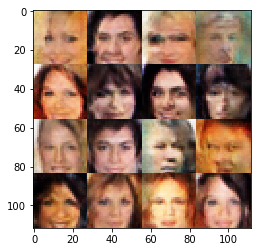

Epoch 1/1... Generator Loss: 0.7233 Discriminator Loss: 1.2855...
Epoch 1/1... Generator Loss: 0.8703 Discriminator Loss: 1.3210...
Epoch 1/1... Generator Loss: 0.5548 Discriminator Loss: 1.4508...
Epoch 1/1... Generator Loss: 0.7128 Discriminator Loss: 1.3295...
Epoch 1/1... Generator Loss: 0.9575 Discriminator Loss: 1.2020...
Epoch 1/1... Generator Loss: 0.8052 Discriminator Loss: 1.5109...
Epoch 1/1... Generator Loss: 0.7480 Discriminator Loss: 1.2880...
Epoch 1/1... Generator Loss: 0.8091 Discriminator Loss: 1.3166...
Epoch 1/1... Generator Loss: 0.6352 Discriminator Loss: 1.3908...
Epoch 1/1... Generator Loss: 0.8173 Discriminator Loss: 1.2181...


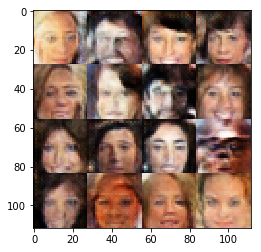

Epoch 1/1... Generator Loss: 1.0718 Discriminator Loss: 1.2779...
Epoch 1/1... Generator Loss: 0.8944 Discriminator Loss: 1.0357...
Epoch 1/1... Generator Loss: 0.7423 Discriminator Loss: 1.3899...
Epoch 1/1... Generator Loss: 0.9502 Discriminator Loss: 1.2453...
Epoch 1/1... Generator Loss: 0.7916 Discriminator Loss: 1.3721...
Epoch 1/1... Generator Loss: 0.5711 Discriminator Loss: 1.4477...
Epoch 1/1... Generator Loss: 0.7173 Discriminator Loss: 1.1730...
Epoch 1/1... Generator Loss: 0.5323 Discriminator Loss: 1.5381...
Epoch 1/1... Generator Loss: 0.5070 Discriminator Loss: 1.5654...
Epoch 1/1... Generator Loss: 0.7375 Discriminator Loss: 1.2064...


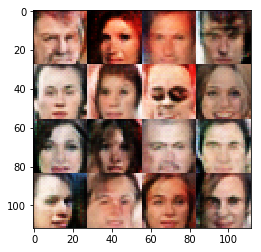

Epoch 1/1... Generator Loss: 0.6213 Discriminator Loss: 1.4404...
Epoch 1/1... Generator Loss: 0.8184 Discriminator Loss: 1.4471...
Epoch 1/1... Generator Loss: 0.6513 Discriminator Loss: 1.3698...
Epoch 1/1... Generator Loss: 0.7814 Discriminator Loss: 1.3728...
Epoch 1/1... Generator Loss: 0.8050 Discriminator Loss: 1.3603...
Epoch 1/1... Generator Loss: 0.6308 Discriminator Loss: 1.4204...
Epoch 1/1... Generator Loss: 0.6306 Discriminator Loss: 1.3721...
Epoch 1/1... Generator Loss: 0.6621 Discriminator Loss: 1.3275...
Epoch 1/1... Generator Loss: 0.7605 Discriminator Loss: 1.4206...
Epoch 1/1... Generator Loss: 0.5903 Discriminator Loss: 1.4746...


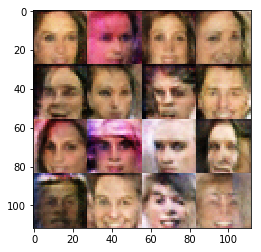

Epoch 1/1... Generator Loss: 0.6833 Discriminator Loss: 1.1985...
Epoch 1/1... Generator Loss: 0.7240 Discriminator Loss: 1.3098...
Epoch 1/1... Generator Loss: 0.8242 Discriminator Loss: 1.3363...
Epoch 1/1... Generator Loss: 0.8552 Discriminator Loss: 1.2731...
Epoch 1/1... Generator Loss: 0.8715 Discriminator Loss: 1.3125...
Epoch 1/1... Generator Loss: 0.9299 Discriminator Loss: 1.2013...
Epoch 1/1... Generator Loss: 0.6328 Discriminator Loss: 1.3752...
Epoch 1/1... Generator Loss: 0.4999 Discriminator Loss: 1.5019...
Epoch 1/1... Generator Loss: 0.6666 Discriminator Loss: 1.3260...
Epoch 1/1... Generator Loss: 0.8228 Discriminator Loss: 1.1995...


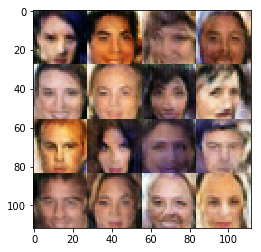

Epoch 1/1... Generator Loss: 0.6316 Discriminator Loss: 1.4095...
Epoch 1/1... Generator Loss: 0.9401 Discriminator Loss: 1.1363...
Epoch 1/1... Generator Loss: 0.8342 Discriminator Loss: 1.2631...
Epoch 1/1... Generator Loss: 0.6266 Discriminator Loss: 1.5833...
Epoch 1/1... Generator Loss: 0.9694 Discriminator Loss: 1.2448...
Epoch 1/1... Generator Loss: 0.6135 Discriminator Loss: 1.4664...
Epoch 1/1... Generator Loss: 0.5492 Discriminator Loss: 1.4660...
Epoch 1/1... Generator Loss: 0.6424 Discriminator Loss: 1.3915...
Epoch 1/1... Generator Loss: 0.6858 Discriminator Loss: 1.3992...
Epoch 1/1... Generator Loss: 0.6658 Discriminator Loss: 1.5282...


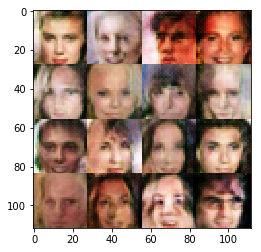

Epoch 1/1... Generator Loss: 0.7927 Discriminator Loss: 1.2982...
Epoch 1/1... Generator Loss: 0.7617 Discriminator Loss: 1.1629...
Epoch 1/1... Generator Loss: 0.6395 Discriminator Loss: 1.5167...
Epoch 1/1... Generator Loss: 0.6646 Discriminator Loss: 1.4825...
Epoch 1/1... Generator Loss: 0.9242 Discriminator Loss: 1.2311...
Epoch 1/1... Generator Loss: 0.6256 Discriminator Loss: 1.2646...
Epoch 1/1... Generator Loss: 0.7114 Discriminator Loss: 1.3145...
Epoch 1/1... Generator Loss: 0.7910 Discriminator Loss: 1.3493...
Epoch 1/1... Generator Loss: 0.5046 Discriminator Loss: 1.6191...
Epoch 1/1... Generator Loss: 0.6147 Discriminator Loss: 1.5486...


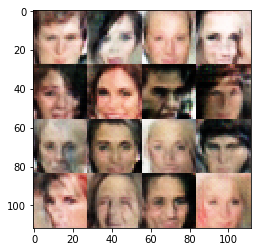

Epoch 1/1... Generator Loss: 0.8740 Discriminator Loss: 1.2716...
Epoch 1/1... Generator Loss: 0.7484 Discriminator Loss: 1.3316...
Epoch 1/1... Generator Loss: 0.6206 Discriminator Loss: 1.5186...
Epoch 1/1... Generator Loss: 0.6648 Discriminator Loss: 1.5373...
Epoch 1/1... Generator Loss: 0.7486 Discriminator Loss: 1.2388...
Epoch 1/1... Generator Loss: 0.8177 Discriminator Loss: 1.2755...
Epoch 1/1... Generator Loss: 0.7951 Discriminator Loss: 1.1294...
Epoch 1/1... Generator Loss: 0.7949 Discriminator Loss: 1.2238...
Epoch 1/1... Generator Loss: 0.6667 Discriminator Loss: 1.2636...
Epoch 1/1... Generator Loss: 0.7654 Discriminator Loss: 1.3128...


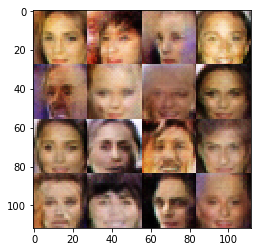

Epoch 1/1... Generator Loss: 0.9162 Discriminator Loss: 1.2432...
Epoch 1/1... Generator Loss: 0.7811 Discriminator Loss: 1.2193...
Epoch 1/1... Generator Loss: 0.6347 Discriminator Loss: 1.4791...
Epoch 1/1... Generator Loss: 0.7157 Discriminator Loss: 1.2518...
Epoch 1/1... Generator Loss: 0.6477 Discriminator Loss: 1.3797...
Epoch 1/1... Generator Loss: 0.6662 Discriminator Loss: 1.3224...
Epoch 1/1... Generator Loss: 0.9135 Discriminator Loss: 1.2607...
Epoch 1/1... Generator Loss: 0.6641 Discriminator Loss: 1.2431...
Epoch 1/1... Generator Loss: 0.6240 Discriminator Loss: 1.5968...
Epoch 1/1... Generator Loss: 0.6208 Discriminator Loss: 1.4295...


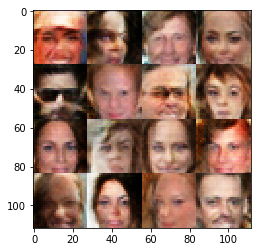

Epoch 1/1... Generator Loss: 0.6427 Discriminator Loss: 1.3443...
Epoch 1/1... Generator Loss: 0.6986 Discriminator Loss: 1.3306...
Epoch 1/1... Generator Loss: 0.6766 Discriminator Loss: 1.3356...
Epoch 1/1... Generator Loss: 0.5975 Discriminator Loss: 1.4251...
Epoch 1/1... Generator Loss: 0.7616 Discriminator Loss: 1.3314...
Epoch 1/1... Generator Loss: 0.6634 Discriminator Loss: 1.4236...
Epoch 1/1... Generator Loss: 0.6056 Discriminator Loss: 1.5376...
Epoch 1/1... Generator Loss: 0.6488 Discriminator Loss: 1.3136...
Epoch 1/1... Generator Loss: 0.5093 Discriminator Loss: 1.4121...
Epoch 1/1... Generator Loss: 0.9445 Discriminator Loss: 1.0635...


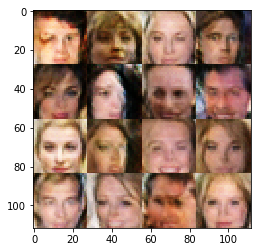

Epoch 1/1... Generator Loss: 0.6803 Discriminator Loss: 1.2066...
Epoch 1/1... Generator Loss: 0.7254 Discriminator Loss: 1.3761...
Epoch 1/1... Generator Loss: 0.5831 Discriminator Loss: 1.5651...
Epoch 1/1... Generator Loss: 0.7336 Discriminator Loss: 1.3700...
Epoch 1/1... Generator Loss: 0.9173 Discriminator Loss: 1.0810...
Epoch 1/1... Generator Loss: 0.4113 Discriminator Loss: 1.5242...
Epoch 1/1... Generator Loss: 0.8624 Discriminator Loss: 1.3360...
Epoch 1/1... Generator Loss: 0.7918 Discriminator Loss: 1.2575...
Epoch 1/1... Generator Loss: 0.5911 Discriminator Loss: 1.5246...
Epoch 1/1... Generator Loss: 0.9499 Discriminator Loss: 1.1457...


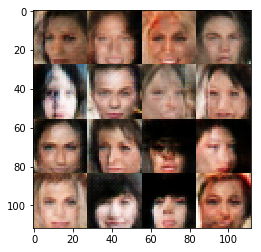

Epoch 1/1... Generator Loss: 1.0291 Discriminator Loss: 1.2086...
Epoch 1/1... Generator Loss: 0.8488 Discriminator Loss: 1.4226...
Epoch 1/1... Generator Loss: 0.7077 Discriminator Loss: 1.3287...
Epoch 1/1... Generator Loss: 0.9689 Discriminator Loss: 1.2276...
Epoch 1/1... Generator Loss: 0.5935 Discriminator Loss: 1.3603...
Epoch 1/1... Generator Loss: 0.7059 Discriminator Loss: 1.2423...
Epoch 1/1... Generator Loss: 0.6556 Discriminator Loss: 1.4368...
Epoch 1/1... Generator Loss: 0.7013 Discriminator Loss: 1.2261...
Epoch 1/1... Generator Loss: 0.6663 Discriminator Loss: 1.5099...
Epoch 1/1... Generator Loss: 0.7324 Discriminator Loss: 1.3336...


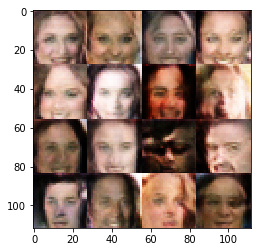

Epoch 1/1... Generator Loss: 0.8279 Discriminator Loss: 1.3266...
Epoch 1/1... Generator Loss: 0.7242 Discriminator Loss: 1.2644...
Epoch 1/1... Generator Loss: 0.6030 Discriminator Loss: 1.5276...
Epoch 1/1... Generator Loss: 0.6182 Discriminator Loss: 1.3618...
Epoch 1/1... Generator Loss: 0.6155 Discriminator Loss: 1.5091...
Epoch 1/1... Generator Loss: 0.9853 Discriminator Loss: 1.1804...
Epoch 1/1... Generator Loss: 0.5508 Discriminator Loss: 1.4535...
Epoch 1/1... Generator Loss: 0.8101 Discriminator Loss: 1.2522...
Epoch 1/1... Generator Loss: 0.7181 Discriminator Loss: 1.4212...
Epoch 1/1... Generator Loss: 0.5446 Discriminator Loss: 1.5278...


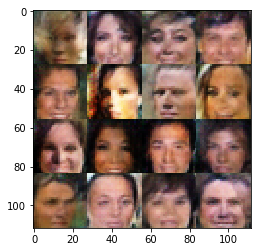

Epoch 1/1... Generator Loss: 0.8226 Discriminator Loss: 1.2773...
Epoch 1/1... Generator Loss: 0.6667 Discriminator Loss: 1.3696...
Epoch 1/1... Generator Loss: 0.8159 Discriminator Loss: 1.1802...
Epoch 1/1... Generator Loss: 0.7869 Discriminator Loss: 1.3293...
Epoch 1/1... Generator Loss: 0.8761 Discriminator Loss: 1.2677...
Epoch 1/1... Generator Loss: 0.8498 Discriminator Loss: 1.1986...
Epoch 1/1... Generator Loss: 0.8370 Discriminator Loss: 1.0799...
Epoch 1/1... Generator Loss: 0.4046 Discriminator Loss: 1.6479...
Epoch 1/1... Generator Loss: 0.8185 Discriminator Loss: 1.1877...
Epoch 1/1... Generator Loss: 0.8460 Discriminator Loss: 1.0224...


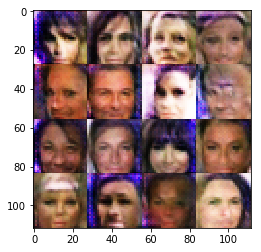

Epoch 1/1... Generator Loss: 0.7879 Discriminator Loss: 1.2118...
Epoch 1/1... Generator Loss: 0.5607 Discriminator Loss: 1.4251...
Epoch 1/1... Generator Loss: 0.7173 Discriminator Loss: 1.4921...
Epoch 1/1... Generator Loss: 0.5864 Discriminator Loss: 1.3718...
Epoch 1/1... Generator Loss: 0.7942 Discriminator Loss: 1.1902...
Epoch 1/1... Generator Loss: 0.6651 Discriminator Loss: 1.1845...
Epoch 1/1... Generator Loss: 0.7266 Discriminator Loss: 1.3416...
Epoch 1/1... Generator Loss: 0.7914 Discriminator Loss: 1.3673...
Epoch 1/1... Generator Loss: 0.6297 Discriminator Loss: 1.4190...
Epoch 1/1... Generator Loss: 0.8681 Discriminator Loss: 1.4685...


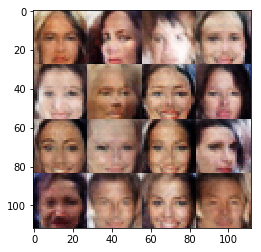

Epoch 1/1... Generator Loss: 0.9124 Discriminator Loss: 1.1725...
Epoch 1/1... Generator Loss: 0.6540 Discriminator Loss: 1.4292...
Epoch 1/1... Generator Loss: 0.7311 Discriminator Loss: 1.4137...
Epoch 1/1... Generator Loss: 0.8073 Discriminator Loss: 1.2291...
Epoch 1/1... Generator Loss: 0.7391 Discriminator Loss: 1.4761...
Epoch 1/1... Generator Loss: 0.7112 Discriminator Loss: 1.2452...
Epoch 1/1... Generator Loss: 0.7435 Discriminator Loss: 1.3972...
Epoch 1/1... Generator Loss: 0.6039 Discriminator Loss: 1.5982...
Epoch 1/1... Generator Loss: 0.7206 Discriminator Loss: 1.2040...
Epoch 1/1... Generator Loss: 0.7173 Discriminator Loss: 1.2774...


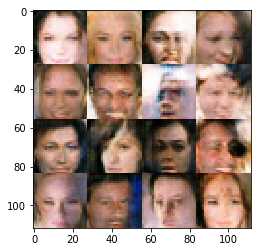

Epoch 1/1... Generator Loss: 0.6309 Discriminator Loss: 1.4138...
Epoch 1/1... Generator Loss: 0.6471 Discriminator Loss: 1.2089...
Epoch 1/1... Generator Loss: 0.7714 Discriminator Loss: 1.2399...
Epoch 1/1... Generator Loss: 0.5772 Discriminator Loss: 1.4875...
Epoch 1/1... Generator Loss: 0.5177 Discriminator Loss: 1.6456...
Epoch 1/1... Generator Loss: 0.6338 Discriminator Loss: 1.4295...
Epoch 1/1... Generator Loss: 0.7350 Discriminator Loss: 1.3791...
Epoch 1/1... Generator Loss: 0.9569 Discriminator Loss: 1.1470...
Epoch 1/1... Generator Loss: 1.0109 Discriminator Loss: 1.2513...
Epoch 1/1... Generator Loss: 0.8995 Discriminator Loss: 1.2233...


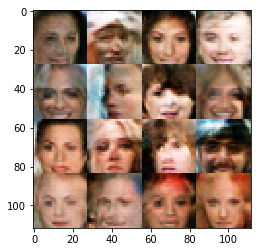

Epoch 1/1... Generator Loss: 0.7817 Discriminator Loss: 1.3016...
Epoch 1/1... Generator Loss: 0.6476 Discriminator Loss: 1.4912...
Epoch 1/1... Generator Loss: 0.7726 Discriminator Loss: 1.2221...
Epoch 1/1... Generator Loss: 0.8040 Discriminator Loss: 1.4305...
Epoch 1/1... Generator Loss: 0.7039 Discriminator Loss: 1.4183...
Epoch 1/1... Generator Loss: 0.6522 Discriminator Loss: 1.4082...
Epoch 1/1... Generator Loss: 0.6548 Discriminator Loss: 1.3946...
Epoch 1/1... Generator Loss: 0.7926 Discriminator Loss: 1.2242...
Epoch 1/1... Generator Loss: 0.6100 Discriminator Loss: 1.5888...
Epoch 1/1... Generator Loss: 0.5902 Discriminator Loss: 1.3914...


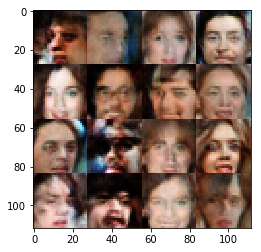

Epoch 1/1... Generator Loss: 0.8909 Discriminator Loss: 1.0759...
Epoch 1/1... Generator Loss: 0.5532 Discriminator Loss: 1.4471...
Epoch 1/1... Generator Loss: 1.0228 Discriminator Loss: 1.0781...
Epoch 1/1... Generator Loss: 0.6412 Discriminator Loss: 1.4111...
Epoch 1/1... Generator Loss: 0.8755 Discriminator Loss: 1.3067...
Epoch 1/1... Generator Loss: 0.8158 Discriminator Loss: 1.1809...
Epoch 1/1... Generator Loss: 0.7628 Discriminator Loss: 1.2785...
Epoch 1/1... Generator Loss: 0.6105 Discriminator Loss: 1.4081...
Epoch 1/1... Generator Loss: 0.8440 Discriminator Loss: 1.1623...
Epoch 1/1... Generator Loss: 0.5050 Discriminator Loss: 1.4685...


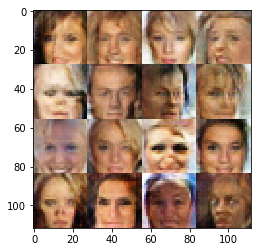

Epoch 1/1... Generator Loss: 0.6405 Discriminator Loss: 1.4230...
Epoch 1/1... Generator Loss: 0.7430 Discriminator Loss: 1.1665...
Epoch 1/1... Generator Loss: 0.6196 Discriminator Loss: 1.4928...
Epoch 1/1... Generator Loss: 0.9848 Discriminator Loss: 1.2790...
Epoch 1/1... Generator Loss: 0.5991 Discriminator Loss: 1.6047...
Epoch 1/1... Generator Loss: 0.7293 Discriminator Loss: 1.3399...
Epoch 1/1... Generator Loss: 0.8144 Discriminator Loss: 1.3892...
Epoch 1/1... Generator Loss: 0.7467 Discriminator Loss: 1.4448...
Epoch 1/1... Generator Loss: 0.8278 Discriminator Loss: 1.3027...
Epoch 1/1... Generator Loss: 0.5913 Discriminator Loss: 1.6950...


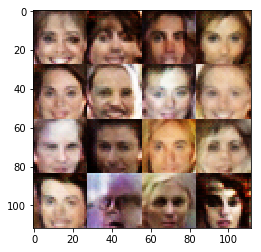

Epoch 1/1... Generator Loss: 0.4608 Discriminator Loss: 1.6209...
Epoch 1/1... Generator Loss: 0.7500 Discriminator Loss: 1.2774...
Epoch 1/1... Generator Loss: 0.9882 Discriminator Loss: 1.1882...
Epoch 1/1... Generator Loss: 1.1231 Discriminator Loss: 0.9986...
Epoch 1/1... Generator Loss: 0.6777 Discriminator Loss: 1.4689...
Epoch 1/1... Generator Loss: 0.9359 Discriminator Loss: 1.2042...
Epoch 1/1... Generator Loss: 0.8437 Discriminator Loss: 1.3060...
Epoch 1/1... Generator Loss: 0.6574 Discriminator Loss: 1.5815...
Epoch 1/1... Generator Loss: 0.8415 Discriminator Loss: 1.1654...
Epoch 1/1... Generator Loss: 0.7547 Discriminator Loss: 1.2873...


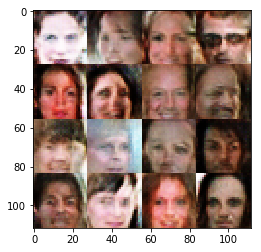

Epoch 1/1... Generator Loss: 0.6345 Discriminator Loss: 1.5205...
Epoch 1/1... Generator Loss: 0.6032 Discriminator Loss: 1.2982...
Epoch 1/1... Generator Loss: 0.8044 Discriminator Loss: 1.1494...
Epoch 1/1... Generator Loss: 0.7142 Discriminator Loss: 1.3771...
Epoch 1/1... Generator Loss: 0.6594 Discriminator Loss: 1.3192...
Epoch 1/1... Generator Loss: 0.7863 Discriminator Loss: 1.6086...
Epoch 1/1... Generator Loss: 0.8488 Discriminator Loss: 1.3107...
Epoch 1/1... Generator Loss: 0.5085 Discriminator Loss: 1.4685...
Epoch 1/1... Generator Loss: 0.6636 Discriminator Loss: 1.3778...
Epoch 1/1... Generator Loss: 0.4754 Discriminator Loss: 1.5655...


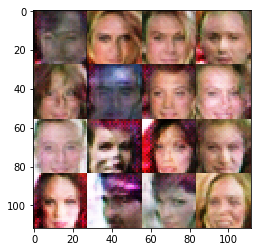

Epoch 1/1... Generator Loss: 0.7325 Discriminator Loss: 1.2956...
Epoch 1/1... Generator Loss: 0.8107 Discriminator Loss: 1.1998...
Epoch 1/1... Generator Loss: 0.8850 Discriminator Loss: 1.2370...
Epoch 1/1... Generator Loss: 0.8442 Discriminator Loss: 1.3203...
Epoch 1/1... Generator Loss: 0.4167 Discriminator Loss: 1.8135...
Epoch 1/1... Generator Loss: 0.5038 Discriminator Loss: 1.5369...
Epoch 1/1... Generator Loss: 0.6496 Discriminator Loss: 1.3185...
Epoch 1/1... Generator Loss: 1.0171 Discriminator Loss: 1.0927...
Epoch 1/1... Generator Loss: 0.7043 Discriminator Loss: 1.3851...
Epoch 1/1... Generator Loss: 0.4514 Discriminator Loss: 1.6240...


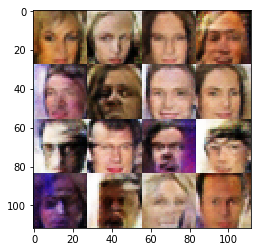

Epoch 1/1... Generator Loss: 0.5860 Discriminator Loss: 1.5550...
Epoch 1/1... Generator Loss: 0.7351 Discriminator Loss: 1.2903...
Epoch 1/1... Generator Loss: 0.5818 Discriminator Loss: 1.4981...
Epoch 1/1... Generator Loss: 0.5631 Discriminator Loss: 1.5451...
Epoch 1/1... Generator Loss: 0.6854 Discriminator Loss: 1.4531...
Epoch 1/1... Generator Loss: 0.9431 Discriminator Loss: 1.0967...
Epoch 1/1... Generator Loss: 0.6000 Discriminator Loss: 1.4688...
Epoch 1/1... Generator Loss: 0.6335 Discriminator Loss: 1.4794...
Epoch 1/1... Generator Loss: 0.7398 Discriminator Loss: 1.3105...
Epoch 1/1... Generator Loss: 0.7881 Discriminator Loss: 1.3317...


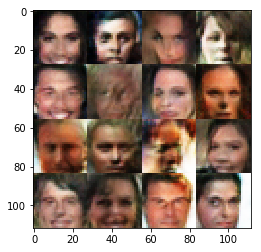

Epoch 1/1... Generator Loss: 0.8897 Discriminator Loss: 1.3377...
Epoch 1/1... Generator Loss: 0.7807 Discriminator Loss: 1.2952...
Epoch 1/1... Generator Loss: 0.8784 Discriminator Loss: 1.0542...
Epoch 1/1... Generator Loss: 0.7700 Discriminator Loss: 1.1990...
Epoch 1/1... Generator Loss: 0.5948 Discriminator Loss: 1.4233...
Epoch 1/1... Generator Loss: 0.7722 Discriminator Loss: 1.4023...
Epoch 1/1... Generator Loss: 0.7099 Discriminator Loss: 1.3534...
Epoch 1/1... Generator Loss: 1.0312 Discriminator Loss: 1.1448...
Epoch 1/1... Generator Loss: 0.5741 Discriminator Loss: 1.4343...
Epoch 1/1... Generator Loss: 0.8305 Discriminator Loss: 1.2487...


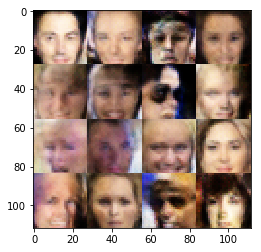

Epoch 1/1... Generator Loss: 0.6910 Discriminator Loss: 1.3123...
Epoch 1/1... Generator Loss: 0.8059 Discriminator Loss: 1.1070...
Epoch 1/1... Generator Loss: 0.8961 Discriminator Loss: 1.1355...
Epoch 1/1... Generator Loss: 0.5220 Discriminator Loss: 1.6834...
Epoch 1/1... Generator Loss: 0.8065 Discriminator Loss: 1.1578...
Epoch 1/1... Generator Loss: 0.8977 Discriminator Loss: 1.1958...
Epoch 1/1... Generator Loss: 1.0810 Discriminator Loss: 0.9828...
Epoch 1/1... Generator Loss: 0.7648 Discriminator Loss: 1.3752...
Epoch 1/1... Generator Loss: 0.7357 Discriminator Loss: 1.1731...
Epoch 1/1... Generator Loss: 0.6800 Discriminator Loss: 1.5962...


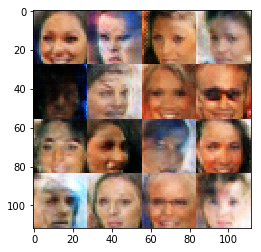

Epoch 1/1... Generator Loss: 0.8025 Discriminator Loss: 1.3961...
Epoch 1/1... Generator Loss: 0.6244 Discriminator Loss: 1.3604...
Epoch 1/1... Generator Loss: 0.7588 Discriminator Loss: 1.5093...
Epoch 1/1... Generator Loss: 0.6236 Discriminator Loss: 1.4680...
Epoch 1/1... Generator Loss: 0.5560 Discriminator Loss: 1.4495...
Epoch 1/1... Generator Loss: 0.7117 Discriminator Loss: 1.3157...
Epoch 1/1... Generator Loss: 0.7036 Discriminator Loss: 1.4066...
Epoch 1/1... Generator Loss: 0.7287 Discriminator Loss: 1.2540...
Epoch 1/1... Generator Loss: 0.7436 Discriminator Loss: 1.3167...
Epoch 1/1... Generator Loss: 0.6154 Discriminator Loss: 1.4534...


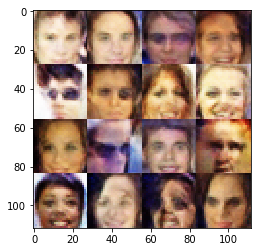

Epoch 1/1... Generator Loss: 1.0298 Discriminator Loss: 1.0695...
Epoch 1/1... Generator Loss: 0.7240 Discriminator Loss: 1.2714...
Epoch 1/1... Generator Loss: 0.7854 Discriminator Loss: 1.1167...
Epoch 1/1... Generator Loss: 0.5497 Discriminator Loss: 1.3294...
Epoch 1/1... Generator Loss: 0.7862 Discriminator Loss: 1.1529...
Epoch 1/1... Generator Loss: 0.6984 Discriminator Loss: 1.4043...
Epoch 1/1... Generator Loss: 0.7685 Discriminator Loss: 1.2968...
Epoch 1/1... Generator Loss: 0.8172 Discriminator Loss: 1.3309...
Epoch 1/1... Generator Loss: 0.6676 Discriminator Loss: 1.3444...
Epoch 1/1... Generator Loss: 0.8053 Discriminator Loss: 1.3977...


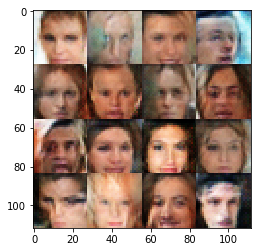

Epoch 1/1... Generator Loss: 0.7034 Discriminator Loss: 1.4040...
Epoch 1/1... Generator Loss: 0.7105 Discriminator Loss: 1.3809...
Epoch 1/1... Generator Loss: 0.6821 Discriminator Loss: 1.3729...
Epoch 1/1... Generator Loss: 0.8560 Discriminator Loss: 1.2749...
Epoch 1/1... Generator Loss: 0.7952 Discriminator Loss: 1.1618...
Epoch 1/1... Generator Loss: 0.7302 Discriminator Loss: 1.1740...
Epoch 1/1... Generator Loss: 0.7172 Discriminator Loss: 1.2628...
Epoch 1/1... Generator Loss: 0.6807 Discriminator Loss: 1.5444...
Epoch 1/1... Generator Loss: 0.7412 Discriminator Loss: 1.1785...
Epoch 1/1... Generator Loss: 0.7961 Discriminator Loss: 1.2338...


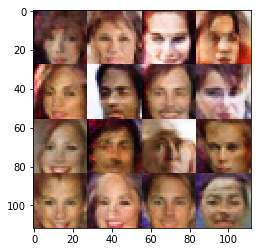

Epoch 1/1... Generator Loss: 0.7633 Discriminator Loss: 1.2969...
Epoch 1/1... Generator Loss: 0.6708 Discriminator Loss: 1.3340...
Epoch 1/1... Generator Loss: 0.7363 Discriminator Loss: 1.4213...
Epoch 1/1... Generator Loss: 0.8230 Discriminator Loss: 1.3531...
Epoch 1/1... Generator Loss: 0.5757 Discriminator Loss: 1.6901...
Epoch 1/1... Generator Loss: 0.7005 Discriminator Loss: 1.3715...
Epoch 1/1... Generator Loss: 0.6704 Discriminator Loss: 1.4552...
Epoch 1/1... Generator Loss: 0.6488 Discriminator Loss: 1.2226...
Epoch 1/1... Generator Loss: 0.5492 Discriminator Loss: 1.4474...
Epoch 1/1... Generator Loss: 0.7880 Discriminator Loss: 1.3145...


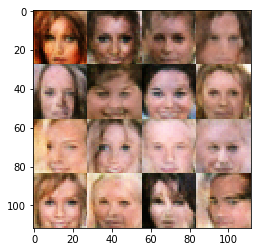

Epoch 1/1... Generator Loss: 0.7821 Discriminator Loss: 1.2158...
Epoch 1/1... Generator Loss: 0.6805 Discriminator Loss: 1.3894...
Epoch 1/1... Generator Loss: 0.7796 Discriminator Loss: 1.3163...
Epoch 1/1... Generator Loss: 0.4381 Discriminator Loss: 1.8293...
Epoch 1/1... Generator Loss: 0.5991 Discriminator Loss: 1.2459...
Epoch 1/1... Generator Loss: 0.8086 Discriminator Loss: 1.2998...
Epoch 1/1... Generator Loss: 0.7780 Discriminator Loss: 1.3425...
Epoch 1/1... Generator Loss: 0.8397 Discriminator Loss: 1.1279...
Epoch 1/1... Generator Loss: 0.9803 Discriminator Loss: 1.2283...
Epoch 1/1... Generator Loss: 0.5533 Discriminator Loss: 1.4073...


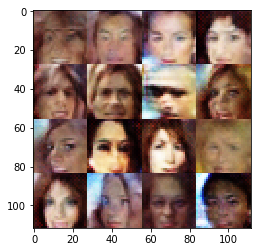

Epoch 1/1... Generator Loss: 0.6796 Discriminator Loss: 1.2984...
Epoch 1/1... Generator Loss: 0.5197 Discriminator Loss: 1.9476...
Epoch 1/1... Generator Loss: 0.7473 Discriminator Loss: 1.3006...
Epoch 1/1... Generator Loss: 0.7991 Discriminator Loss: 1.0412...
Epoch 1/1... Generator Loss: 0.7657 Discriminator Loss: 1.4487...
Epoch 1/1... Generator Loss: 0.8286 Discriminator Loss: 1.1875...
Epoch 1/1... Generator Loss: 0.9058 Discriminator Loss: 1.2153...
Epoch 1/1... Generator Loss: 0.6273 Discriminator Loss: 1.2386...
Epoch 1/1... Generator Loss: 0.8157 Discriminator Loss: 1.2082...
Epoch 1/1... Generator Loss: 0.7664 Discriminator Loss: 1.3291...


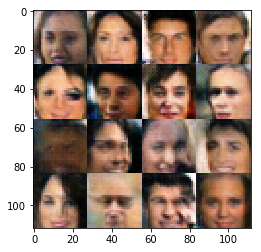

Epoch 1/1... Generator Loss: 0.7950 Discriminator Loss: 1.3216...
Epoch 1/1... Generator Loss: 0.7043 Discriminator Loss: 1.3694...
Epoch 1/1... Generator Loss: 0.6720 Discriminator Loss: 1.5635...
Epoch 1/1... Generator Loss: 0.8126 Discriminator Loss: 1.1894...
Epoch 1/1... Generator Loss: 0.7124 Discriminator Loss: 1.3572...
Epoch 1/1... Generator Loss: 0.6292 Discriminator Loss: 1.4493...
Epoch 1/1... Generator Loss: 0.7063 Discriminator Loss: 1.3954...
Epoch 1/1... Generator Loss: 0.6789 Discriminator Loss: 1.4504...
Epoch 1/1... Generator Loss: 0.5873 Discriminator Loss: 1.6925...
Epoch 1/1... Generator Loss: 1.0280 Discriminator Loss: 1.3767...


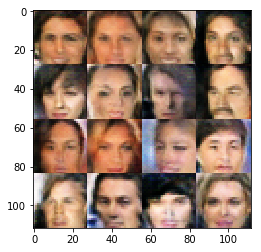

Epoch 1/1... Generator Loss: 0.7644 Discriminator Loss: 1.2104...
Epoch 1/1... Generator Loss: 0.4850 Discriminator Loss: 1.5959...
Epoch 1/1... Generator Loss: 0.8025 Discriminator Loss: 1.1696...
Epoch 1/1... Generator Loss: 0.6846 Discriminator Loss: 1.4654...
Epoch 1/1... Generator Loss: 0.8314 Discriminator Loss: 1.2747...
Epoch 1/1... Generator Loss: 0.6870 Discriminator Loss: 1.4749...
Epoch 1/1... Generator Loss: 0.6658 Discriminator Loss: 1.3776...
Epoch 1/1... Generator Loss: 0.6702 Discriminator Loss: 1.4100...
Epoch 1/1... Generator Loss: 0.8258 Discriminator Loss: 1.2597...
Epoch 1/1... Generator Loss: 0.5562 Discriminator Loss: 1.4747...


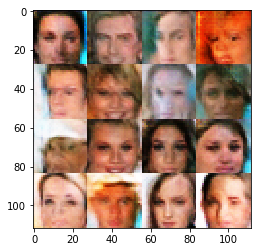

Epoch 1/1... Generator Loss: 0.7721 Discriminator Loss: 1.3547...
Epoch 1/1... Generator Loss: 0.7616 Discriminator Loss: 1.2863...
Epoch 1/1... Generator Loss: 0.7838 Discriminator Loss: 1.4292...
Epoch 1/1... Generator Loss: 0.7340 Discriminator Loss: 1.3505...
Epoch 1/1... Generator Loss: 0.8718 Discriminator Loss: 1.2300...
Epoch 1/1... Generator Loss: 0.8169 Discriminator Loss: 1.2168...
Epoch 1/1... Generator Loss: 0.7495 Discriminator Loss: 1.3341...
Epoch 1/1... Generator Loss: 0.4402 Discriminator Loss: 1.9617...
Epoch 1/1... Generator Loss: 0.8403 Discriminator Loss: 1.3811...
Epoch 1/1... Generator Loss: 0.7290 Discriminator Loss: 1.4098...


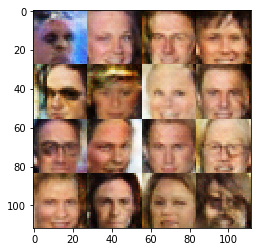

Epoch 1/1... Generator Loss: 0.5769 Discriminator Loss: 1.5454...
Epoch 1/1... Generator Loss: 0.6619 Discriminator Loss: 1.6061...
Epoch 1/1... Generator Loss: 0.5605 Discriminator Loss: 1.3766...
Epoch 1/1... Generator Loss: 0.7758 Discriminator Loss: 1.1867...
Epoch 1/1... Generator Loss: 0.6252 Discriminator Loss: 1.3490...
Epoch 1/1... Generator Loss: 0.4908 Discriminator Loss: 1.7282...
Epoch 1/1... Generator Loss: 0.7361 Discriminator Loss: 1.2736...
Epoch 1/1... Generator Loss: 1.0778 Discriminator Loss: 1.0841...
Epoch 1/1... Generator Loss: 0.6390 Discriminator Loss: 1.4291...
Epoch 1/1... Generator Loss: 0.9180 Discriminator Loss: 1.0872...


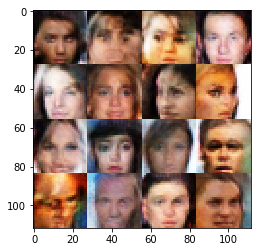

Epoch 1/1... Generator Loss: 0.7764 Discriminator Loss: 1.2436...
Epoch 1/1... Generator Loss: 0.6362 Discriminator Loss: 1.4807...
Epoch 1/1... Generator Loss: 0.8276 Discriminator Loss: 1.1557...
Epoch 1/1... Generator Loss: 0.9718 Discriminator Loss: 1.1578...
Epoch 1/1... Generator Loss: 0.7865 Discriminator Loss: 1.5129...
Epoch 1/1... Generator Loss: 0.5287 Discriminator Loss: 1.4043...
Epoch 1/1... Generator Loss: 0.6264 Discriminator Loss: 1.4774...
Epoch 1/1... Generator Loss: 0.7551 Discriminator Loss: 1.2637...
Epoch 1/1... Generator Loss: 0.7175 Discriminator Loss: 1.5164...
Epoch 1/1... Generator Loss: 0.7333 Discriminator Loss: 1.3231...


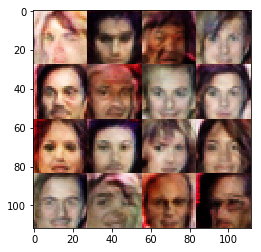

Epoch 1/1... Generator Loss: 0.7545 Discriminator Loss: 1.1513...
Epoch 1/1... Generator Loss: 0.5262 Discriminator Loss: 1.7416...
Epoch 1/1... Generator Loss: 0.8334 Discriminator Loss: 1.3264...
Epoch 1/1... Generator Loss: 0.6410 Discriminator Loss: 1.3699...
Epoch 1/1... Generator Loss: 0.6743 Discriminator Loss: 1.4039...
Epoch 1/1... Generator Loss: 0.9723 Discriminator Loss: 1.2187...
Epoch 1/1... Generator Loss: 0.6570 Discriminator Loss: 1.4508...
Epoch 1/1... Generator Loss: 0.9167 Discriminator Loss: 1.2463...
Epoch 1/1... Generator Loss: 0.5700 Discriminator Loss: 1.4486...
Epoch 1/1... Generator Loss: 0.6717 Discriminator Loss: 1.4012...


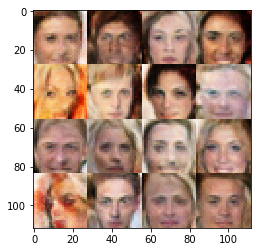

Epoch 1/1... Generator Loss: 0.9914 Discriminator Loss: 1.0978...
Epoch 1/1... Generator Loss: 0.6304 Discriminator Loss: 1.4336...
Epoch 1/1... Generator Loss: 0.7238 Discriminator Loss: 1.2445...
Epoch 1/1... Generator Loss: 0.6279 Discriminator Loss: 1.4035...
Epoch 1/1... Generator Loss: 0.6498 Discriminator Loss: 1.3765...
Epoch 1/1... Generator Loss: 0.5809 Discriminator Loss: 1.4400...
Epoch 1/1... Generator Loss: 0.5510 Discriminator Loss: 1.5526...
Epoch 1/1... Generator Loss: 0.5923 Discriminator Loss: 1.3401...
Epoch 1/1... Generator Loss: 0.4211 Discriminator Loss: 1.6388...
Epoch 1/1... Generator Loss: 0.7282 Discriminator Loss: 1.3800...


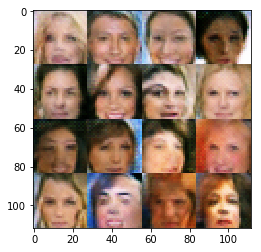

Epoch 1/1... Generator Loss: 0.6968 Discriminator Loss: 1.3600...
Epoch 1/1... Generator Loss: 0.9173 Discriminator Loss: 1.2131...
Epoch 1/1... Generator Loss: 0.7883 Discriminator Loss: 1.2375...
Epoch 1/1... Generator Loss: 0.8836 Discriminator Loss: 1.1325...
Epoch 1/1... Generator Loss: 0.4957 Discriminator Loss: 1.6397...
Epoch 1/1... Generator Loss: 0.7547 Discriminator Loss: 1.3467...
Epoch 1/1... Generator Loss: 0.7494 Discriminator Loss: 1.3258...
Epoch 1/1... Generator Loss: 0.7489 Discriminator Loss: 1.3016...
Epoch 1/1... Generator Loss: 0.9292 Discriminator Loss: 1.1548...
Epoch 1/1... Generator Loss: 0.8780 Discriminator Loss: 1.4056...


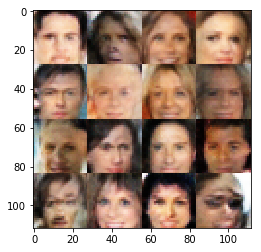

Epoch 1/1... Generator Loss: 0.9582 Discriminator Loss: 1.1470...
Epoch 1/1... Generator Loss: 0.5591 Discriminator Loss: 1.4537...
Epoch 1/1... Generator Loss: 0.6505 Discriminator Loss: 1.3882...
Epoch 1/1... Generator Loss: 0.9005 Discriminator Loss: 1.2000...
Epoch 1/1... Generator Loss: 0.7026 Discriminator Loss: 1.2095...
Epoch 1/1... Generator Loss: 0.7050 Discriminator Loss: 1.4145...
Epoch 1/1... Generator Loss: 0.8442 Discriminator Loss: 1.3290...
Epoch 1/1... Generator Loss: 0.5959 Discriminator Loss: 1.3723...
Epoch 1/1... Generator Loss: 0.6351 Discriminator Loss: 1.3307...
Epoch 1/1... Generator Loss: 0.7887 Discriminator Loss: 1.2474...


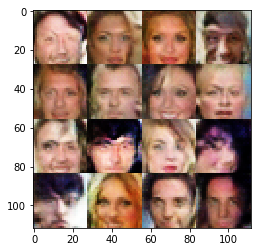

Epoch 1/1... Generator Loss: 0.5837 Discriminator Loss: 1.5140...
Epoch 1/1... Generator Loss: 0.7498 Discriminator Loss: 1.2245...
Epoch 1/1... Generator Loss: 0.7609 Discriminator Loss: 1.2803...
Epoch 1/1... Generator Loss: 0.8222 Discriminator Loss: 1.1538...
Epoch 1/1... Generator Loss: 0.8993 Discriminator Loss: 1.1004...
Epoch 1/1... Generator Loss: 0.7493 Discriminator Loss: 1.3787...
Epoch 1/1... Generator Loss: 0.7168 Discriminator Loss: 1.2984...
Epoch 1/1... Generator Loss: 0.6452 Discriminator Loss: 1.2789...
Epoch 1/1... Generator Loss: 0.7415 Discriminator Loss: 1.2556...
Epoch 1/1... Generator Loss: 0.7427 Discriminator Loss: 1.3858...


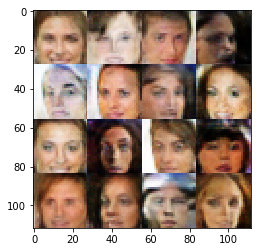

Epoch 1/1... Generator Loss: 0.6761 Discriminator Loss: 1.3740...
Epoch 1/1... Generator Loss: 0.8258 Discriminator Loss: 1.2192...
Epoch 1/1... Generator Loss: 0.7906 Discriminator Loss: 1.1830...
Epoch 1/1... Generator Loss: 0.5876 Discriminator Loss: 1.5900...
Epoch 1/1... Generator Loss: 0.5809 Discriminator Loss: 1.4029...
Epoch 1/1... Generator Loss: 0.5665 Discriminator Loss: 1.4121...
Epoch 1/1... Generator Loss: 0.7874 Discriminator Loss: 1.2126...
Epoch 1/1... Generator Loss: 0.7631 Discriminator Loss: 1.3001...
Epoch 1/1... Generator Loss: 0.8144 Discriminator Loss: 1.0723...
Epoch 1/1... Generator Loss: 1.0466 Discriminator Loss: 1.2979...


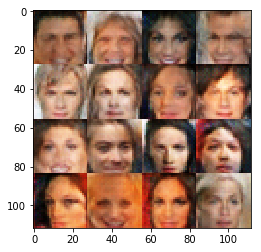

Epoch 1/1... Generator Loss: 0.7599 Discriminator Loss: 1.1910...
Epoch 1/1... Generator Loss: 0.7265 Discriminator Loss: 1.2212...
Epoch 1/1... Generator Loss: 0.7554 Discriminator Loss: 1.3511...
Epoch 1/1... Generator Loss: 0.7171 Discriminator Loss: 1.3581...
Epoch 1/1... Generator Loss: 0.9204 Discriminator Loss: 1.2296...
Epoch 1/1... Generator Loss: 0.5253 Discriminator Loss: 1.6014...
Epoch 1/1... Generator Loss: 0.7744 Discriminator Loss: 1.4376...
Epoch 1/1... Generator Loss: 0.7540 Discriminator Loss: 1.2726...
Epoch 1/1... Generator Loss: 0.6330 Discriminator Loss: 1.5367...
Epoch 1/1... Generator Loss: 0.7351 Discriminator Loss: 1.3058...


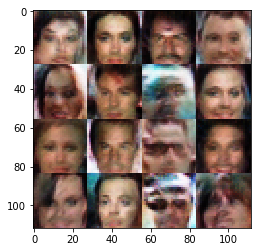

Epoch 1/1... Generator Loss: 0.8797 Discriminator Loss: 1.1734...
Epoch 1/1... Generator Loss: 0.6065 Discriminator Loss: 1.5852...
Epoch 1/1... Generator Loss: 0.6525 Discriminator Loss: 1.4142...
Epoch 1/1... Generator Loss: 0.6963 Discriminator Loss: 1.3042...
Epoch 1/1... Generator Loss: 0.7500 Discriminator Loss: 1.2222...
Epoch 1/1... Generator Loss: 0.7238 Discriminator Loss: 1.3872...
Epoch 1/1... Generator Loss: 0.5439 Discriminator Loss: 1.5740...
Epoch 1/1... Generator Loss: 0.7536 Discriminator Loss: 1.2015...
Epoch 1/1... Generator Loss: 0.7429 Discriminator Loss: 1.3925...
Epoch 1/1... Generator Loss: 0.7311 Discriminator Loss: 1.2857...


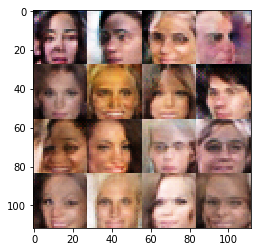

Epoch 1/1... Generator Loss: 0.6784 Discriminator Loss: 1.2849...
Epoch 1/1... Generator Loss: 0.6817 Discriminator Loss: 1.4541...
Epoch 1/1... Generator Loss: 0.8816 Discriminator Loss: 1.1598...
Epoch 1/1... Generator Loss: 0.5459 Discriminator Loss: 1.5363...
Epoch 1/1... Generator Loss: 0.9280 Discriminator Loss: 1.3221...
Epoch 1/1... Generator Loss: 0.6773 Discriminator Loss: 1.2874...
Epoch 1/1... Generator Loss: 0.9466 Discriminator Loss: 1.2027...
Epoch 1/1... Generator Loss: 0.9602 Discriminator Loss: 1.0991...
Epoch 1/1... Generator Loss: 0.6479 Discriminator Loss: 1.6201...
Epoch 1/1... Generator Loss: 0.6839 Discriminator Loss: 1.4739...


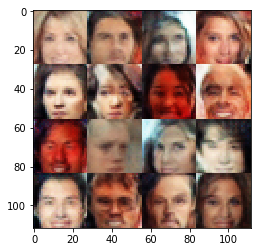

Epoch 1/1... Generator Loss: 0.7093 Discriminator Loss: 1.2731...
Epoch 1/1... Generator Loss: 0.7943 Discriminator Loss: 1.2305...
Epoch 1/1... Generator Loss: 0.7114 Discriminator Loss: 1.3812...
Epoch 1/1... Generator Loss: 0.9183 Discriminator Loss: 1.2368...
Epoch 1/1... Generator Loss: 0.7347 Discriminator Loss: 1.3654...
Epoch 1/1... Generator Loss: 0.8281 Discriminator Loss: 1.1854...
Epoch 1/1... Generator Loss: 0.7324 Discriminator Loss: 1.4895...
Epoch 1/1... Generator Loss: 0.8041 Discriminator Loss: 1.1871...
Epoch 1/1... Generator Loss: 0.8667 Discriminator Loss: 1.1252...
Epoch 1/1... Generator Loss: 0.6776 Discriminator Loss: 1.3302...


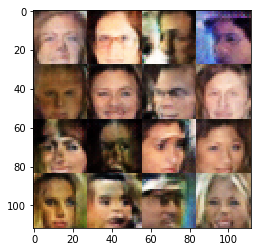

Epoch 1/1... Generator Loss: 0.7123 Discriminator Loss: 1.4930...
Epoch 1/1... Generator Loss: 0.7907 Discriminator Loss: 1.2950...
Epoch 1/1... Generator Loss: 0.7842 Discriminator Loss: 1.2905...
Epoch 1/1... Generator Loss: 0.8139 Discriminator Loss: 1.1513...
Epoch 1/1... Generator Loss: 0.8027 Discriminator Loss: 1.2999...
Epoch 1/1... Generator Loss: 0.8690 Discriminator Loss: 1.2160...
Epoch 1/1... Generator Loss: 0.7405 Discriminator Loss: 1.4111...
Epoch 1/1... Generator Loss: 0.6945 Discriminator Loss: 1.5353...
Epoch 1/1... Generator Loss: 0.7728 Discriminator Loss: 1.2705...
Epoch 1/1... Generator Loss: 0.7736 Discriminator Loss: 1.4201...


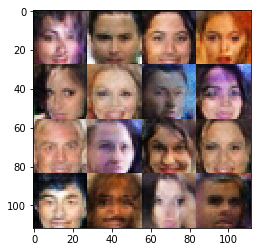

Epoch 1/1... Generator Loss: 0.5091 Discriminator Loss: 1.5917...
Epoch 1/1... Generator Loss: 0.6141 Discriminator Loss: 1.3452...
Epoch 1/1... Generator Loss: 0.7383 Discriminator Loss: 1.3055...
Epoch 1/1... Generator Loss: 0.8296 Discriminator Loss: 1.4087...
Epoch 1/1... Generator Loss: 0.8331 Discriminator Loss: 1.2483...
Epoch 1/1... Generator Loss: 0.7465 Discriminator Loss: 1.2319...
Epoch 1/1... Generator Loss: 0.9148 Discriminator Loss: 1.1567...
Epoch 1/1... Generator Loss: 0.8355 Discriminator Loss: 1.2450...
Epoch 1/1... Generator Loss: 0.7456 Discriminator Loss: 1.4048...
Epoch 1/1... Generator Loss: 1.0559 Discriminator Loss: 1.3517...


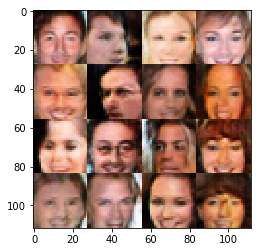

Epoch 1/1... Generator Loss: 0.6649 Discriminator Loss: 1.5923...
Epoch 1/1... Generator Loss: 0.8934 Discriminator Loss: 1.1911...
Epoch 1/1... Generator Loss: 0.7613 Discriminator Loss: 1.3056...
Epoch 1/1... Generator Loss: 0.9267 Discriminator Loss: 1.2008...
Epoch 1/1... Generator Loss: 0.5265 Discriminator Loss: 1.5380...
Epoch 1/1... Generator Loss: 0.7855 Discriminator Loss: 1.2070...
Epoch 1/1... Generator Loss: 0.7483 Discriminator Loss: 1.2112...
Epoch 1/1... Generator Loss: 0.8493 Discriminator Loss: 1.2921...
Epoch 1/1... Generator Loss: 0.6941 Discriminator Loss: 1.4451...
Epoch 1/1... Generator Loss: 0.7743 Discriminator Loss: 1.3715...


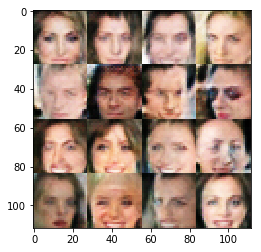

Epoch 1/1... Generator Loss: 0.7378 Discriminator Loss: 1.3757...
Epoch 1/1... Generator Loss: 0.6828 Discriminator Loss: 1.3781...
Epoch 1/1... Generator Loss: 0.6651 Discriminator Loss: 1.5481...
Epoch 1/1... Generator Loss: 0.9046 Discriminator Loss: 1.1811...
Epoch 1/1... Generator Loss: 0.8380 Discriminator Loss: 1.3170...
Epoch 1/1... Generator Loss: 0.6724 Discriminator Loss: 1.5044...
Epoch 1/1... Generator Loss: 0.8106 Discriminator Loss: 1.2050...
Epoch 1/1... Generator Loss: 0.7062 Discriminator Loss: 1.6092...
Epoch 1/1... Generator Loss: 0.8067 Discriminator Loss: 1.0697...
Epoch 1/1... Generator Loss: 0.6909 Discriminator Loss: 1.3840...


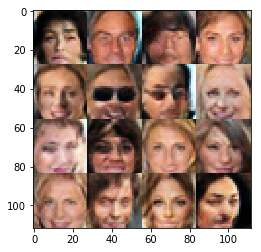

Epoch 1/1... Generator Loss: 1.0442 Discriminator Loss: 1.0919...
Epoch 1/1... Generator Loss: 0.8225 Discriminator Loss: 1.1813...
Epoch 1/1... Generator Loss: 0.8771 Discriminator Loss: 1.2361...
Epoch 1/1... Generator Loss: 0.8457 Discriminator Loss: 1.2528...
Epoch 1/1... Generator Loss: 0.3393 Discriminator Loss: 1.8548...
Epoch 1/1... Generator Loss: 0.5939 Discriminator Loss: 1.5757...
Epoch 1/1... Generator Loss: 1.0182 Discriminator Loss: 1.0759...
Epoch 1/1... Generator Loss: 0.7905 Discriminator Loss: 1.2071...
Epoch 1/1... Generator Loss: 0.6118 Discriminator Loss: 1.2928...
Epoch 1/1... Generator Loss: 0.8141 Discriminator Loss: 1.2009...


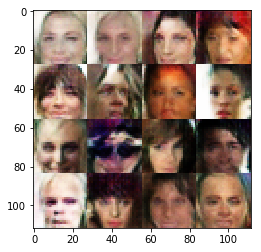

Epoch 1/1... Generator Loss: 0.8351 Discriminator Loss: 1.1718...
Epoch 1/1... Generator Loss: 0.9076 Discriminator Loss: 1.1368...
Epoch 1/1... Generator Loss: 0.6706 Discriminator Loss: 1.2872...
Epoch 1/1... Generator Loss: 0.7955 Discriminator Loss: 1.3693...
Epoch 1/1... Generator Loss: 0.7047 Discriminator Loss: 1.5505...
Epoch 1/1... Generator Loss: 0.5170 Discriminator Loss: 1.7403...
Epoch 1/1... Generator Loss: 0.6878 Discriminator Loss: 1.4190...
Epoch 1/1... Generator Loss: 0.8995 Discriminator Loss: 1.1895...
Epoch 1/1... Generator Loss: 0.6361 Discriminator Loss: 1.4846...
Epoch 1/1... Generator Loss: 0.5803 Discriminator Loss: 1.5121...


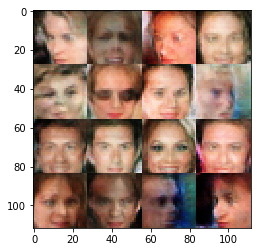

Epoch 1/1... Generator Loss: 0.6960 Discriminator Loss: 1.4886...
Epoch 1/1... Generator Loss: 0.8140 Discriminator Loss: 1.3745...
Epoch 1/1... Generator Loss: 0.8552 Discriminator Loss: 1.3024...
Epoch 1/1... Generator Loss: 0.9144 Discriminator Loss: 1.1496...
Epoch 1/1... Generator Loss: 0.6533 Discriminator Loss: 1.2852...
Epoch 1/1... Generator Loss: 0.6275 Discriminator Loss: 1.3430...
Epoch 1/1... Generator Loss: 0.7296 Discriminator Loss: 1.3706...
Epoch 1/1... Generator Loss: 0.8157 Discriminator Loss: 1.2498...
Epoch 1/1... Generator Loss: 0.6722 Discriminator Loss: 1.4692...
Epoch 1/1... Generator Loss: 0.9058 Discriminator Loss: 1.1379...


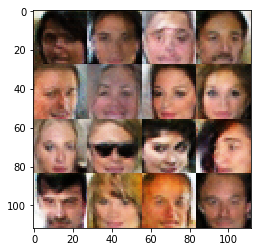

Epoch 1/1... Generator Loss: 0.8157 Discriminator Loss: 1.3097...
Epoch 1/1... Generator Loss: 0.9367 Discriminator Loss: 1.1166...
Epoch 1/1... Generator Loss: 0.6369 Discriminator Loss: 1.4759...
Epoch 1/1... Generator Loss: 0.4678 Discriminator Loss: 1.6784...
Epoch 1/1... Generator Loss: 0.7199 Discriminator Loss: 1.2623...
Epoch 1/1... Generator Loss: 0.7242 Discriminator Loss: 1.2585...
Epoch 1/1... Generator Loss: 0.6206 Discriminator Loss: 1.6104...
Epoch 1/1... Generator Loss: 0.8135 Discriminator Loss: 1.3685...
Epoch 1/1... Generator Loss: 0.7510 Discriminator Loss: 1.2189...
Epoch 1/1... Generator Loss: 0.8227 Discriminator Loss: 1.2245...


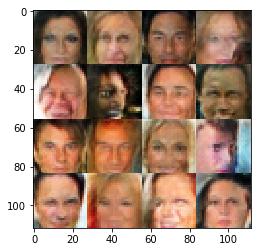

Epoch 1/1... Generator Loss: 0.7495 Discriminator Loss: 1.2743...
Epoch 1/1... Generator Loss: 0.6998 Discriminator Loss: 1.4531...
Epoch 1/1... Generator Loss: 0.7741 Discriminator Loss: 1.2678...
Epoch 1/1... Generator Loss: 0.6983 Discriminator Loss: 1.2462...
Epoch 1/1... Generator Loss: 0.8530 Discriminator Loss: 1.2391...
Epoch 1/1... Generator Loss: 0.9497 Discriminator Loss: 0.9140...
Epoch 1/1... Generator Loss: 0.5903 Discriminator Loss: 1.4409...
Epoch 1/1... Generator Loss: 0.7416 Discriminator Loss: 1.1993...
Epoch 1/1... Generator Loss: 0.6989 Discriminator Loss: 1.3411...
Epoch 1/1... Generator Loss: 0.6118 Discriminator Loss: 1.5360...


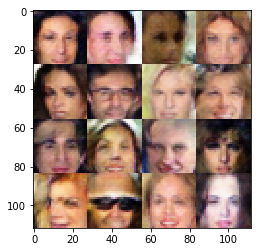

Epoch 1/1... Generator Loss: 0.7484 Discriminator Loss: 1.3462...
Epoch 1/1... Generator Loss: 0.7622 Discriminator Loss: 1.2722...
Epoch 1/1... Generator Loss: 0.8103 Discriminator Loss: 1.2574...
Epoch 1/1... Generator Loss: 0.7903 Discriminator Loss: 1.4104...
Epoch 1/1... Generator Loss: 0.7916 Discriminator Loss: 1.2161...
Epoch 1/1... Generator Loss: 0.7478 Discriminator Loss: 1.1903...
Epoch 1/1... Generator Loss: 0.7343 Discriminator Loss: 1.2733...
Epoch 1/1... Generator Loss: 0.9134 Discriminator Loss: 1.2903...
Epoch 1/1... Generator Loss: 0.7193 Discriminator Loss: 1.4873...
Epoch 1/1... Generator Loss: 0.6068 Discriminator Loss: 1.4926...


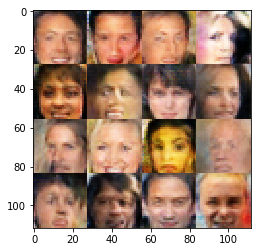

Epoch 1/1... Generator Loss: 0.7539 Discriminator Loss: 1.3677...
Epoch 1/1... Generator Loss: 0.6730 Discriminator Loss: 1.3226...
Epoch 1/1... Generator Loss: 0.5897 Discriminator Loss: 1.5098...
Epoch 1/1... Generator Loss: 0.7202 Discriminator Loss: 1.3638...
Epoch 1/1... Generator Loss: 0.7226 Discriminator Loss: 1.3739...
Epoch 1/1... Generator Loss: 0.9046 Discriminator Loss: 1.1348...
Epoch 1/1... Generator Loss: 0.9578 Discriminator Loss: 1.1870...
Epoch 1/1... Generator Loss: 0.7164 Discriminator Loss: 1.3830...
Epoch 1/1... Generator Loss: 0.5605 Discriminator Loss: 1.5163...
Epoch 1/1... Generator Loss: 0.7798 Discriminator Loss: 1.1989...


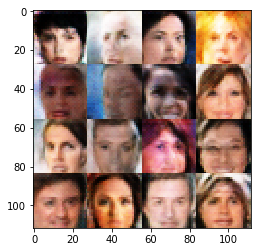

Epoch 1/1... Generator Loss: 0.5764 Discriminator Loss: 1.3548...
Epoch 1/1... Generator Loss: 0.5067 Discriminator Loss: 1.5376...
Epoch 1/1... Generator Loss: 0.7808 Discriminator Loss: 1.3604...
Epoch 1/1... Generator Loss: 0.8412 Discriminator Loss: 1.2723...
Epoch 1/1... Generator Loss: 0.6788 Discriminator Loss: 1.3871...
Epoch 1/1... Generator Loss: 0.8554 Discriminator Loss: 1.2788...
Epoch 1/1... Generator Loss: 0.8354 Discriminator Loss: 1.2235...
Epoch 1/1... Generator Loss: 0.6553 Discriminator Loss: 1.4697...
Epoch 1/1... Generator Loss: 0.7031 Discriminator Loss: 1.4715...
Epoch 1/1... Generator Loss: 0.8806 Discriminator Loss: 1.0844...


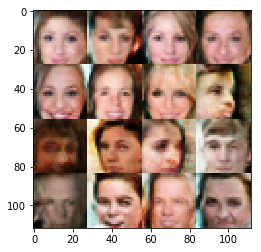

Epoch 1/1... Generator Loss: 0.6436 Discriminator Loss: 1.4190...
Epoch 1/1... Generator Loss: 0.8887 Discriminator Loss: 1.1807...
Epoch 1/1... Generator Loss: 0.7757 Discriminator Loss: 1.3335...
Epoch 1/1... Generator Loss: 0.9749 Discriminator Loss: 1.1964...
Epoch 1/1... Generator Loss: 0.5445 Discriminator Loss: 1.5533...
Epoch 1/1... Generator Loss: 0.6988 Discriminator Loss: 1.2564...
Epoch 1/1... Generator Loss: 0.7371 Discriminator Loss: 1.3882...
Epoch 1/1... Generator Loss: 0.7945 Discriminator Loss: 1.1844...
Epoch 1/1... Generator Loss: 0.6187 Discriminator Loss: 1.4909...
Epoch 1/1... Generator Loss: 0.5776 Discriminator Loss: 1.4555...


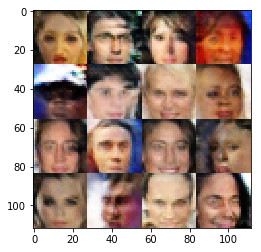

Epoch 1/1... Generator Loss: 0.7307 Discriminator Loss: 1.3235...
Epoch 1/1... Generator Loss: 0.7722 Discriminator Loss: 1.2989...
Epoch 1/1... Generator Loss: 0.8448 Discriminator Loss: 1.2637...
Epoch 1/1... Generator Loss: 1.0283 Discriminator Loss: 1.0383...
Epoch 1/1... Generator Loss: 0.5550 Discriminator Loss: 1.4665...
Epoch 1/1... Generator Loss: 0.9099 Discriminator Loss: 1.1233...
Epoch 1/1... Generator Loss: 0.7927 Discriminator Loss: 1.2284...
Epoch 1/1... Generator Loss: 0.5177 Discriminator Loss: 1.6090...
Epoch 1/1... Generator Loss: 0.8488 Discriminator Loss: 1.0414...
Epoch 1/1... Generator Loss: 1.0682 Discriminator Loss: 0.9889...


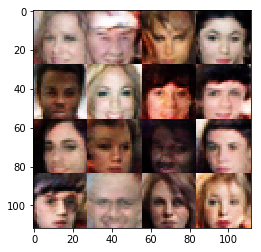

Epoch 1/1... Generator Loss: 0.6435 Discriminator Loss: 1.4226...
Epoch 1/1... Generator Loss: 0.6994 Discriminator Loss: 1.4153...
Epoch 1/1... Generator Loss: 0.7988 Discriminator Loss: 1.1757...
Epoch 1/1... Generator Loss: 0.9607 Discriminator Loss: 1.1830...
Epoch 1/1... Generator Loss: 1.0203 Discriminator Loss: 1.2730...
Epoch 1/1... Generator Loss: 0.6481 Discriminator Loss: 1.2621...
Epoch 1/1... Generator Loss: 0.7429 Discriminator Loss: 1.2544...
Epoch 1/1... Generator Loss: 1.1022 Discriminator Loss: 1.0189...
Epoch 1/1... Generator Loss: 0.3729 Discriminator Loss: 1.8435...
Epoch 1/1... Generator Loss: 0.6700 Discriminator Loss: 1.4247...


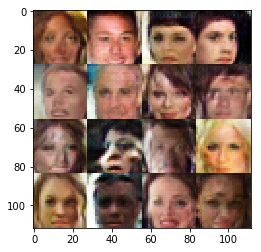

Epoch 1/1... Generator Loss: 0.7118 Discriminator Loss: 1.2269...
Epoch 1/1... Generator Loss: 0.5566 Discriminator Loss: 1.6792...
Epoch 1/1... Generator Loss: 0.7072 Discriminator Loss: 1.5013...
Epoch 1/1... Generator Loss: 0.8558 Discriminator Loss: 1.2355...
Epoch 1/1... Generator Loss: 0.5887 Discriminator Loss: 1.4492...
Epoch 1/1... Generator Loss: 0.8008 Discriminator Loss: 1.0863...
Epoch 1/1... Generator Loss: 1.0236 Discriminator Loss: 0.9798...
Epoch 1/1... Generator Loss: 0.6960 Discriminator Loss: 1.2338...
Epoch 1/1... Generator Loss: 0.8827 Discriminator Loss: 1.2027...
Epoch 1/1... Generator Loss: 0.8985 Discriminator Loss: 0.9507...


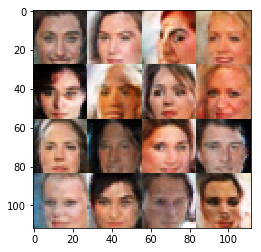

Epoch 1/1... Generator Loss: 0.7478 Discriminator Loss: 1.4299...
Epoch 1/1... Generator Loss: 0.6511 Discriminator Loss: 1.4162...
Epoch 1/1... Generator Loss: 0.6159 Discriminator Loss: 1.4550...
Epoch 1/1... Generator Loss: 0.5452 Discriminator Loss: 1.5529...
Epoch 1/1... Generator Loss: 0.6764 Discriminator Loss: 1.2941...
Epoch 1/1... Generator Loss: 0.6734 Discriminator Loss: 1.4021...
Epoch 1/1... Generator Loss: 0.6603 Discriminator Loss: 1.3675...
Epoch 1/1... Generator Loss: 0.6928 Discriminator Loss: 1.3642...
Epoch 1/1... Generator Loss: 0.7189 Discriminator Loss: 1.4351...
Epoch 1/1... Generator Loss: 1.0744 Discriminator Loss: 1.2005...


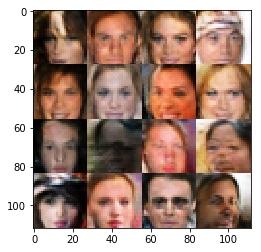

Epoch 1/1... Generator Loss: 0.7234 Discriminator Loss: 1.3501...
Epoch 1/1... Generator Loss: 0.9137 Discriminator Loss: 1.0821...
Epoch 1/1... Generator Loss: 0.8626 Discriminator Loss: 1.4000...
Epoch 1/1... Generator Loss: 0.7271 Discriminator Loss: 1.2860...
Epoch 1/1... Generator Loss: 0.7351 Discriminator Loss: 1.4337...
Epoch 1/1... Generator Loss: 0.5507 Discriminator Loss: 1.5330...
Epoch 1/1... Generator Loss: 0.7241 Discriminator Loss: 1.2171...
Epoch 1/1... Generator Loss: 1.2693 Discriminator Loss: 0.9922...
Epoch 1/1... Generator Loss: 0.8409 Discriminator Loss: 1.2885...
Epoch 1/1... Generator Loss: 0.8757 Discriminator Loss: 1.1423...


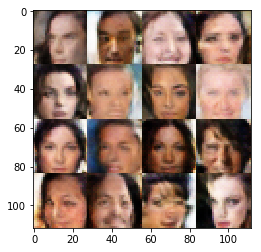

Epoch 1/1... Generator Loss: 0.7250 Discriminator Loss: 1.3512...
Epoch 1/1... Generator Loss: 0.9449 Discriminator Loss: 1.1974...
Epoch 1/1... Generator Loss: 0.7875 Discriminator Loss: 1.4322...
Epoch 1/1... Generator Loss: 0.8009 Discriminator Loss: 1.2309...
Epoch 1/1... Generator Loss: 0.8978 Discriminator Loss: 1.1677...
Epoch 1/1... Generator Loss: 0.4768 Discriminator Loss: 1.7811...
Epoch 1/1... Generator Loss: 0.9188 Discriminator Loss: 0.9778...
Epoch 1/1... Generator Loss: 0.9924 Discriminator Loss: 1.3091...
Epoch 1/1... Generator Loss: 0.9623 Discriminator Loss: 1.0890...
Epoch 1/1... Generator Loss: 0.8021 Discriminator Loss: 1.4374...


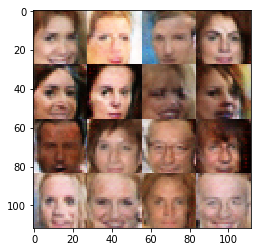

Epoch 1/1... Generator Loss: 0.5434 Discriminator Loss: 1.4283...
Epoch 1/1... Generator Loss: 0.5628 Discriminator Loss: 1.3903...
Epoch 1/1... Generator Loss: 0.5963 Discriminator Loss: 1.3234...
Epoch 1/1... Generator Loss: 0.6446 Discriminator Loss: 1.7018...
Epoch 1/1... Generator Loss: 0.6921 Discriminator Loss: 1.1691...
Epoch 1/1... Generator Loss: 0.8240 Discriminator Loss: 1.0317...
Epoch 1/1... Generator Loss: 0.5307 Discriminator Loss: 1.7589...
Epoch 1/1... Generator Loss: 0.7462 Discriminator Loss: 1.3593...
Epoch 1/1... Generator Loss: 0.8533 Discriminator Loss: 1.2484...
Epoch 1/1... Generator Loss: 1.0888 Discriminator Loss: 1.2923...


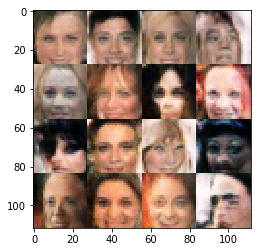

Epoch 1/1... Generator Loss: 0.5662 Discriminator Loss: 1.2955...
Epoch 1/1... Generator Loss: 0.6637 Discriminator Loss: 1.3698...
Epoch 1/1... Generator Loss: 0.6583 Discriminator Loss: 1.4591...
Epoch 1/1... Generator Loss: 0.9856 Discriminator Loss: 0.9866...
Epoch 1/1... Generator Loss: 0.6666 Discriminator Loss: 1.4492...
Epoch 1/1... Generator Loss: 0.7825 Discriminator Loss: 1.2722...
Epoch 1/1... Generator Loss: 1.0102 Discriminator Loss: 1.3268...
Epoch 1/1... Generator Loss: 0.5790 Discriminator Loss: 1.3330...
Epoch 1/1... Generator Loss: 0.4415 Discriminator Loss: 1.4582...
Epoch 1/1... Generator Loss: 0.8587 Discriminator Loss: 1.1614...


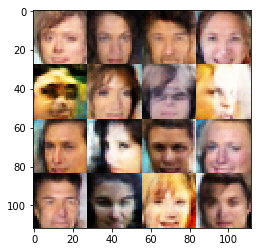

Epoch 1/1... Generator Loss: 0.7394 Discriminator Loss: 1.3904...
Epoch 1/1... Generator Loss: 0.9011 Discriminator Loss: 1.2677...
Epoch 1/1... Generator Loss: 0.6140 Discriminator Loss: 1.3910...
Epoch 1/1... Generator Loss: 0.7646 Discriminator Loss: 1.4151...
Epoch 1/1... Generator Loss: 0.6159 Discriminator Loss: 1.3080...
Epoch 1/1... Generator Loss: 0.6908 Discriminator Loss: 1.5527...
Epoch 1/1... Generator Loss: 0.7559 Discriminator Loss: 1.2710...
Epoch 1/1... Generator Loss: 0.9002 Discriminator Loss: 1.2657...
Epoch 1/1... Generator Loss: 0.8903 Discriminator Loss: 1.3086...
Epoch 1/1... Generator Loss: 0.9738 Discriminator Loss: 1.0614...


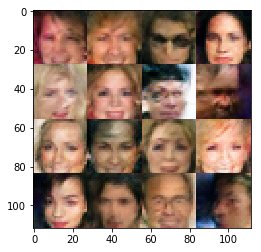

Epoch 1/1... Generator Loss: 0.6308 Discriminator Loss: 1.3776...
Epoch 1/1... Generator Loss: 0.7525 Discriminator Loss: 1.2054...
Epoch 1/1... Generator Loss: 0.4632 Discriminator Loss: 1.8581...
Epoch 1/1... Generator Loss: 0.5855 Discriminator Loss: 1.4860...
Epoch 1/1... Generator Loss: 0.8351 Discriminator Loss: 1.2199...
Epoch 1/1... Generator Loss: 0.7369 Discriminator Loss: 1.3467...
Epoch 1/1... Generator Loss: 0.7788 Discriminator Loss: 1.3325...
Epoch 1/1... Generator Loss: 0.9517 Discriminator Loss: 1.1682...
Epoch 1/1... Generator Loss: 0.7462 Discriminator Loss: 1.3511...
Epoch 1/1... Generator Loss: 0.9563 Discriminator Loss: 1.1744...


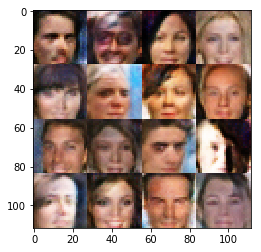

Epoch 1/1... Generator Loss: 0.6986 Discriminator Loss: 1.2909...
Epoch 1/1... Generator Loss: 0.5838 Discriminator Loss: 1.3412...
Epoch 1/1... Generator Loss: 0.7077 Discriminator Loss: 1.4863...
Epoch 1/1... Generator Loss: 0.7179 Discriminator Loss: 1.4542...
Epoch 1/1... Generator Loss: 0.6368 Discriminator Loss: 1.2595...
Epoch 1/1... Generator Loss: 1.0000 Discriminator Loss: 1.1007...
Epoch 1/1... Generator Loss: 0.7987 Discriminator Loss: 1.3875...
Epoch 1/1... Generator Loss: 0.7646 Discriminator Loss: 1.2364...
Epoch 1/1... Generator Loss: 0.6430 Discriminator Loss: 1.3467...
Epoch 1/1... Generator Loss: 0.7885 Discriminator Loss: 1.2132...


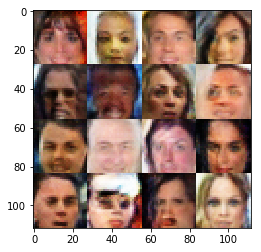

Epoch 1/1... Generator Loss: 0.5649 Discriminator Loss: 1.2937...
Epoch 1/1... Generator Loss: 0.7542 Discriminator Loss: 1.0890...
Epoch 1/1... Generator Loss: 0.7806 Discriminator Loss: 1.1061...
Epoch 1/1... Generator Loss: 0.6381 Discriminator Loss: 1.3846...
Epoch 1/1... Generator Loss: 0.7430 Discriminator Loss: 1.3764...
Epoch 1/1... Generator Loss: 0.7105 Discriminator Loss: 1.3091...
Epoch 1/1... Generator Loss: 0.9005 Discriminator Loss: 1.0793...
Epoch 1/1... Generator Loss: 1.0090 Discriminator Loss: 1.2337...
Epoch 1/1... Generator Loss: 0.8238 Discriminator Loss: 1.2060...
Epoch 1/1... Generator Loss: 0.7036 Discriminator Loss: 1.3336...


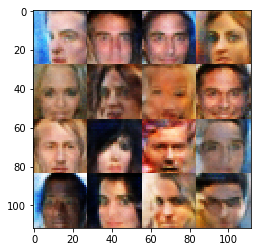

Epoch 1/1... Generator Loss: 0.7110 Discriminator Loss: 1.2481...
Epoch 1/1... Generator Loss: 0.9491 Discriminator Loss: 1.3514...
Epoch 1/1... Generator Loss: 0.6911 Discriminator Loss: 1.4279...
Epoch 1/1... Generator Loss: 0.7945 Discriminator Loss: 1.2605...
Epoch 1/1... Generator Loss: 0.8061 Discriminator Loss: 1.3467...
Epoch 1/1... Generator Loss: 1.0224 Discriminator Loss: 1.0360...
Epoch 1/1... Generator Loss: 0.8730 Discriminator Loss: 0.9659...
Epoch 1/1... Generator Loss: 0.5780 Discriminator Loss: 1.5583...
Epoch 1/1... Generator Loss: 0.7291 Discriminator Loss: 1.2608...
Epoch 1/1... Generator Loss: 0.5457 Discriminator Loss: 1.4824...


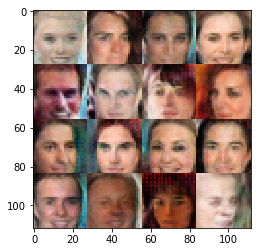

Epoch 1/1... Generator Loss: 0.6809 Discriminator Loss: 1.3891...
Epoch 1/1... Generator Loss: 1.0373 Discriminator Loss: 1.1217...
Epoch 1/1... Generator Loss: 0.7594 Discriminator Loss: 1.4219...
Epoch 1/1... Generator Loss: 0.9062 Discriminator Loss: 1.4490...
Epoch 1/1... Generator Loss: 0.7560 Discriminator Loss: 1.3502...
Epoch 1/1... Generator Loss: 0.9659 Discriminator Loss: 1.1548...
Epoch 1/1... Generator Loss: 0.6077 Discriminator Loss: 1.4869...
Epoch 1/1... Generator Loss: 0.6064 Discriminator Loss: 1.5433...
Epoch 1/1... Generator Loss: 0.6799 Discriminator Loss: 1.2518...
Epoch 1/1... Generator Loss: 0.7357 Discriminator Loss: 1.5621...


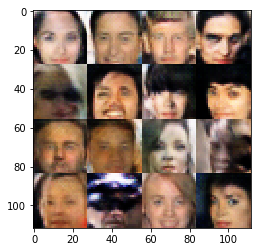

Epoch 1/1... Generator Loss: 0.7833 Discriminator Loss: 1.2180...
Epoch 1/1... Generator Loss: 0.8316 Discriminator Loss: 1.1841...
Epoch 1/1... Generator Loss: 0.6741 Discriminator Loss: 1.2254...
Epoch 1/1... Generator Loss: 0.7134 Discriminator Loss: 1.2791...
Epoch 1/1... Generator Loss: 0.6918 Discriminator Loss: 1.4139...
Epoch 1/1... Generator Loss: 0.6629 Discriminator Loss: 1.2583...
Epoch 1/1... Generator Loss: 0.8070 Discriminator Loss: 1.4788...
Epoch 1/1... Generator Loss: 0.9392 Discriminator Loss: 1.1289...
Epoch 1/1... Generator Loss: 0.4941 Discriminator Loss: 1.4597...
Epoch 1/1... Generator Loss: 0.6007 Discriminator Loss: 1.3253...


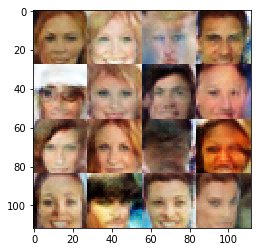

Epoch 1/1... Generator Loss: 0.8639 Discriminator Loss: 1.2661...
Epoch 1/1... Generator Loss: 0.8810 Discriminator Loss: 1.0947...
Epoch 1/1... Generator Loss: 0.7695 Discriminator Loss: 1.3630...
Epoch 1/1... Generator Loss: 0.8208 Discriminator Loss: 1.3306...
Epoch 1/1... Generator Loss: 0.5648 Discriminator Loss: 1.4310...
Epoch 1/1... Generator Loss: 0.5989 Discriminator Loss: 1.4325...
Epoch 1/1... Generator Loss: 0.6742 Discriminator Loss: 1.4107...
Epoch 1/1... Generator Loss: 0.7353 Discriminator Loss: 1.1092...
Epoch 1/1... Generator Loss: 0.6481 Discriminator Loss: 1.2849...
Epoch 1/1... Generator Loss: 0.8437 Discriminator Loss: 1.3733...


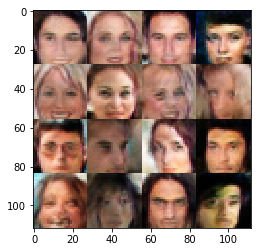

Epoch 1/1... Generator Loss: 0.8581 Discriminator Loss: 1.1353...
Epoch 1/1... Generator Loss: 0.7514 Discriminator Loss: 1.2388...
Epoch 1/1... Generator Loss: 0.8330 Discriminator Loss: 1.2449...
Epoch 1/1... Generator Loss: 0.8828 Discriminator Loss: 1.3045...
Epoch 1/1... Generator Loss: 0.7630 Discriminator Loss: 1.3665...
Epoch 1/1... Generator Loss: 0.5885 Discriminator Loss: 1.3352...
Epoch 1/1... Generator Loss: 0.8586 Discriminator Loss: 1.1719...
Epoch 1/1... Generator Loss: 0.7078 Discriminator Loss: 1.2773...
Epoch 1/1... Generator Loss: 0.6548 Discriminator Loss: 1.3357...
Epoch 1/1... Generator Loss: 0.6592 Discriminator Loss: 1.3814...


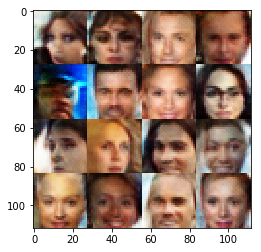

Epoch 1/1... Generator Loss: 0.8642 Discriminator Loss: 1.3222...
Epoch 1/1... Generator Loss: 0.4900 Discriminator Loss: 1.7936...
Epoch 1/1... Generator Loss: 0.6213 Discriminator Loss: 1.4629...
Epoch 1/1... Generator Loss: 0.6799 Discriminator Loss: 1.2366...
Epoch 1/1... Generator Loss: 0.7495 Discriminator Loss: 1.3409...
Epoch 1/1... Generator Loss: 0.8356 Discriminator Loss: 1.2078...
Epoch 1/1... Generator Loss: 0.7895 Discriminator Loss: 1.2766...
Epoch 1/1... Generator Loss: 0.5456 Discriminator Loss: 1.4614...
Epoch 1/1... Generator Loss: 0.8796 Discriminator Loss: 1.3394...
Epoch 1/1... Generator Loss: 0.8462 Discriminator Loss: 1.3541...


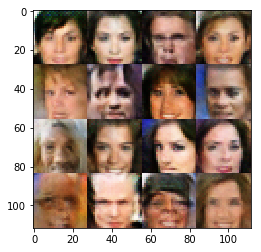

Epoch 1/1... Generator Loss: 0.6346 Discriminator Loss: 1.3404...
Epoch 1/1... Generator Loss: 0.7397 Discriminator Loss: 1.2596...
Epoch 1/1... Generator Loss: 0.8951 Discriminator Loss: 1.4234...
Epoch 1/1... Generator Loss: 0.6983 Discriminator Loss: 1.2318...
Epoch 1/1... Generator Loss: 0.9201 Discriminator Loss: 1.2884...
Epoch 1/1... Generator Loss: 0.6907 Discriminator Loss: 1.4220...
Epoch 1/1... Generator Loss: 0.6913 Discriminator Loss: 1.3862...
Epoch 1/1... Generator Loss: 1.1056 Discriminator Loss: 0.9458...
Epoch 1/1... Generator Loss: 0.7450 Discriminator Loss: 1.2611...
Epoch 1/1... Generator Loss: 0.6628 Discriminator Loss: 1.6140...


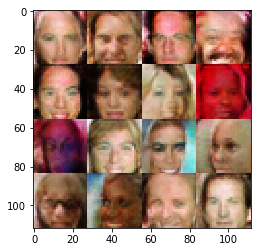

Epoch 1/1... Generator Loss: 0.7040 Discriminator Loss: 1.2872...
Epoch 1/1... Generator Loss: 0.9178 Discriminator Loss: 1.1771...
Epoch 1/1... Generator Loss: 0.7324 Discriminator Loss: 1.2340...
Epoch 1/1... Generator Loss: 0.7574 Discriminator Loss: 1.3052...
Epoch 1/1... Generator Loss: 1.0118 Discriminator Loss: 1.0935...
Epoch 1/1... Generator Loss: 0.7715 Discriminator Loss: 1.3371...
Epoch 1/1... Generator Loss: 0.6101 Discriminator Loss: 1.5410...
Epoch 1/1... Generator Loss: 0.6273 Discriminator Loss: 1.4049...
Epoch 1/1... Generator Loss: 0.7718 Discriminator Loss: 1.2414...
Epoch 1/1... Generator Loss: 0.7990 Discriminator Loss: 1.1505...


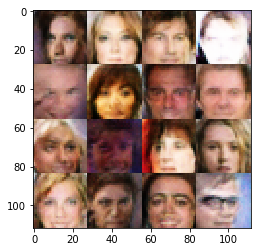

Epoch 1/1... Generator Loss: 0.8601 Discriminator Loss: 1.1612...
Epoch 1/1... Generator Loss: 0.6919 Discriminator Loss: 1.3472...
Epoch 1/1... Generator Loss: 0.6654 Discriminator Loss: 1.3213...
Epoch 1/1... Generator Loss: 0.8467 Discriminator Loss: 1.2469...
Epoch 1/1... Generator Loss: 0.5625 Discriminator Loss: 1.4677...
Epoch 1/1... Generator Loss: 0.6061 Discriminator Loss: 1.3109...
Epoch 1/1... Generator Loss: 0.9200 Discriminator Loss: 1.1213...
Epoch 1/1... Generator Loss: 0.7726 Discriminator Loss: 1.1548...
Epoch 1/1... Generator Loss: 0.7608 Discriminator Loss: 1.3767...
Epoch 1/1... Generator Loss: 0.7644 Discriminator Loss: 1.2203...


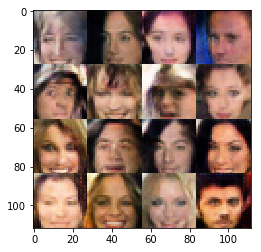

Epoch 1/1... Generator Loss: 0.6079 Discriminator Loss: 1.3816...
Epoch 1/1... Generator Loss: 0.9683 Discriminator Loss: 1.0349...
Epoch 1/1... Generator Loss: 0.6588 Discriminator Loss: 1.2551...
Epoch 1/1... Generator Loss: 0.8106 Discriminator Loss: 1.2374...
Epoch 1/1... Generator Loss: 0.6464 Discriminator Loss: 1.2916...
Epoch 1/1... Generator Loss: 0.7672 Discriminator Loss: 1.4625...
Epoch 1/1... Generator Loss: 0.8783 Discriminator Loss: 1.0561...
Epoch 1/1... Generator Loss: 0.5650 Discriminator Loss: 1.2921...
Epoch 1/1... Generator Loss: 0.7990 Discriminator Loss: 1.0916...
Epoch 1/1... Generator Loss: 0.9945 Discriminator Loss: 1.3201...


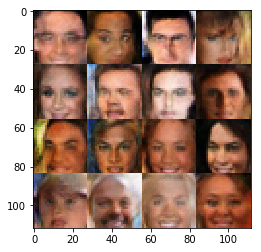

Epoch 1/1... Generator Loss: 0.5990 Discriminator Loss: 1.4111...
Epoch 1/1... Generator Loss: 0.4878 Discriminator Loss: 1.6760...
Epoch 1/1... Generator Loss: 0.6605 Discriminator Loss: 1.3514...
Epoch 1/1... Generator Loss: 0.8422 Discriminator Loss: 1.2343...
Epoch 1/1... Generator Loss: 0.6802 Discriminator Loss: 1.4142...
Epoch 1/1... Generator Loss: 0.8125 Discriminator Loss: 1.0949...
Epoch 1/1... Generator Loss: 0.8365 Discriminator Loss: 1.2822...
Epoch 1/1... Generator Loss: 0.8400 Discriminator Loss: 1.2713...
Epoch 1/1... Generator Loss: 0.8019 Discriminator Loss: 1.3132...
Epoch 1/1... Generator Loss: 0.8915 Discriminator Loss: 1.1744...


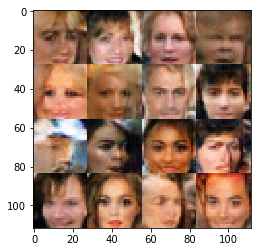

Epoch 1/1... Generator Loss: 0.6197 Discriminator Loss: 1.4289...
Epoch 1/1... Generator Loss: 0.5922 Discriminator Loss: 1.2673...
Epoch 1/1... Generator Loss: 0.8192 Discriminator Loss: 1.3032...
Epoch 1/1... Generator Loss: 0.7193 Discriminator Loss: 1.4344...
Epoch 1/1... Generator Loss: 0.6175 Discriminator Loss: 1.3285...
Epoch 1/1... Generator Loss: 1.2104 Discriminator Loss: 0.9437...
Epoch 1/1... Generator Loss: 0.6715 Discriminator Loss: 1.5849...
Epoch 1/1... Generator Loss: 0.6037 Discriminator Loss: 1.3336...
Epoch 1/1... Generator Loss: 0.9532 Discriminator Loss: 1.0734...
Epoch 1/1... Generator Loss: 0.8155 Discriminator Loss: 1.3354...


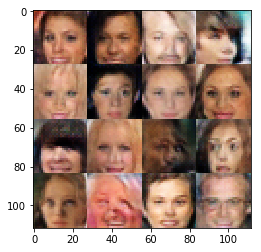

Epoch 1/1... Generator Loss: 0.7098 Discriminator Loss: 1.3252...
Epoch 1/1... Generator Loss: 0.7851 Discriminator Loss: 1.3381...
Epoch 1/1... Generator Loss: 0.7002 Discriminator Loss: 1.4057...
Epoch 1/1... Generator Loss: 0.8203 Discriminator Loss: 1.1834...
Epoch 1/1... Generator Loss: 0.8105 Discriminator Loss: 1.1777...
Epoch 1/1... Generator Loss: 0.9309 Discriminator Loss: 1.1931...
Epoch 1/1... Generator Loss: 0.7173 Discriminator Loss: 1.3515...
Epoch 1/1... Generator Loss: 0.6872 Discriminator Loss: 1.4396...
Epoch 1/1... Generator Loss: 0.8929 Discriminator Loss: 1.1916...
Epoch 1/1... Generator Loss: 0.8063 Discriminator Loss: 1.2864...


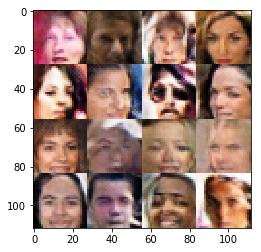

Epoch 1/1... Generator Loss: 0.4881 Discriminator Loss: 1.4299...
Epoch 1/1... Generator Loss: 0.5765 Discriminator Loss: 1.6063...
Epoch 1/1... Generator Loss: 0.5962 Discriminator Loss: 1.4790...
Epoch 1/1... Generator Loss: 0.8685 Discriminator Loss: 1.4258...
Epoch 1/1... Generator Loss: 0.6721 Discriminator Loss: 1.3599...
Epoch 1/1... Generator Loss: 0.7105 Discriminator Loss: 1.1743...
Epoch 1/1... Generator Loss: 0.8191 Discriminator Loss: 1.2514...
Epoch 1/1... Generator Loss: 0.5929 Discriminator Loss: 1.3240...
Epoch 1/1... Generator Loss: 0.7227 Discriminator Loss: 1.4305...
Epoch 1/1... Generator Loss: 0.8495 Discriminator Loss: 1.0385...


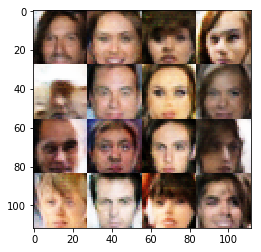

Epoch 1/1... Generator Loss: 0.8314 Discriminator Loss: 1.2692...
Epoch 1/1... Generator Loss: 0.7029 Discriminator Loss: 1.2925...
Epoch 1/1... Generator Loss: 0.5042 Discriminator Loss: 1.4829...
Epoch 1/1... Generator Loss: 0.7310 Discriminator Loss: 1.3868...
Epoch 1/1... Generator Loss: 0.7504 Discriminator Loss: 1.3568...
Epoch 1/1... Generator Loss: 0.8073 Discriminator Loss: 1.3352...
Epoch 1/1... Generator Loss: 0.7943 Discriminator Loss: 1.1551...
Epoch 1/1... Generator Loss: 0.6160 Discriminator Loss: 1.5096...
Epoch 1/1... Generator Loss: 0.7871 Discriminator Loss: 1.1087...
Epoch 1/1... Generator Loss: 0.6436 Discriminator Loss: 1.5064...


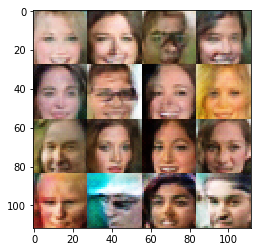

Epoch 1/1... Generator Loss: 0.6603 Discriminator Loss: 1.3432...
Epoch 1/1... Generator Loss: 0.6752 Discriminator Loss: 1.2864...
Epoch 1/1... Generator Loss: 0.6948 Discriminator Loss: 1.4126...
Epoch 1/1... Generator Loss: 0.5499 Discriminator Loss: 1.4264...
Epoch 1/1... Generator Loss: 0.7043 Discriminator Loss: 1.2198...
Epoch 1/1... Generator Loss: 0.8221 Discriminator Loss: 1.1597...
Epoch 1/1... Generator Loss: 0.6342 Discriminator Loss: 1.4571...
Epoch 1/1... Generator Loss: 0.8196 Discriminator Loss: 1.2599...
Epoch 1/1... Generator Loss: 0.7304 Discriminator Loss: 1.2798...
Epoch 1/1... Generator Loss: 0.7827 Discriminator Loss: 1.3751...


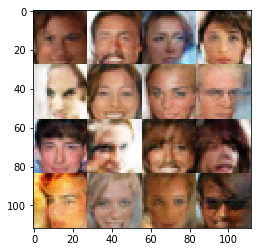

Epoch 1/1... Generator Loss: 0.9217 Discriminator Loss: 1.2573...
Epoch 1/1... Generator Loss: 0.8119 Discriminator Loss: 1.1696...
Epoch 1/1... Generator Loss: 0.7949 Discriminator Loss: 1.3268...
Epoch 1/1... Generator Loss: 0.8919 Discriminator Loss: 1.1475...
Epoch 1/1... Generator Loss: 0.7053 Discriminator Loss: 1.4618...
Epoch 1/1... Generator Loss: 0.8124 Discriminator Loss: 1.3217...
Epoch 1/1... Generator Loss: 0.7467 Discriminator Loss: 1.1102...
Epoch 1/1... Generator Loss: 0.8441 Discriminator Loss: 1.2909...
Epoch 1/1... Generator Loss: 0.6813 Discriminator Loss: 1.4301...
Epoch 1/1... Generator Loss: 0.9605 Discriminator Loss: 1.2149...


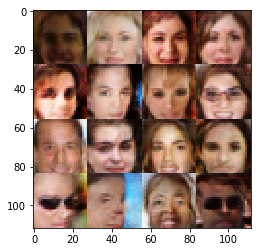

Epoch 1/1... Generator Loss: 0.8413 Discriminator Loss: 1.2817...
Epoch 1/1... Generator Loss: 0.7759 Discriminator Loss: 1.4066...
Epoch 1/1... Generator Loss: 0.8566 Discriminator Loss: 1.2178...
Epoch 1/1... Generator Loss: 0.5941 Discriminator Loss: 1.4680...
Epoch 1/1... Generator Loss: 1.0792 Discriminator Loss: 1.1416...
Epoch 1/1... Generator Loss: 0.6206 Discriminator Loss: 1.2676...
Epoch 1/1... Generator Loss: 0.9046 Discriminator Loss: 1.1910...
Epoch 1/1... Generator Loss: 0.7127 Discriminator Loss: 1.2891...
Epoch 1/1... Generator Loss: 0.8695 Discriminator Loss: 1.3910...
Epoch 1/1... Generator Loss: 0.8381 Discriminator Loss: 1.1634...


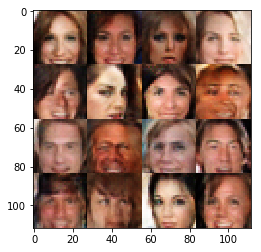

Epoch 1/1... Generator Loss: 0.6783 Discriminator Loss: 1.4652...
Epoch 1/1... Generator Loss: 0.6675 Discriminator Loss: 1.1735...
Epoch 1/1... Generator Loss: 0.7826 Discriminator Loss: 1.2051...
Epoch 1/1... Generator Loss: 0.6497 Discriminator Loss: 1.3076...
Epoch 1/1... Generator Loss: 0.6442 Discriminator Loss: 1.3613...
Epoch 1/1... Generator Loss: 0.8153 Discriminator Loss: 1.4235...
Epoch 1/1... Generator Loss: 0.9878 Discriminator Loss: 1.2068...
Epoch 1/1... Generator Loss: 0.7216 Discriminator Loss: 1.3774...
Epoch 1/1... Generator Loss: 0.8849 Discriminator Loss: 1.1123...
Epoch 1/1... Generator Loss: 0.7632 Discriminator Loss: 1.2844...


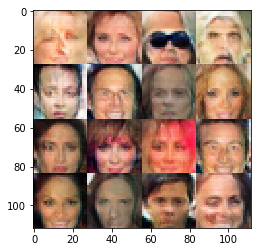

Epoch 1/1... Generator Loss: 0.7432 Discriminator Loss: 1.1512...
Epoch 1/1... Generator Loss: 0.7272 Discriminator Loss: 1.2266...
Epoch 1/1... Generator Loss: 1.0480 Discriminator Loss: 1.0623...
Epoch 1/1... Generator Loss: 0.9778 Discriminator Loss: 1.2779...
Epoch 1/1... Generator Loss: 1.1141 Discriminator Loss: 0.9771...
Epoch 1/1... Generator Loss: 0.6264 Discriminator Loss: 1.4324...
Epoch 1/1... Generator Loss: 0.8396 Discriminator Loss: 1.3132...
Epoch 1/1... Generator Loss: 0.7439 Discriminator Loss: 1.1701...
Epoch 1/1... Generator Loss: 0.7605 Discriminator Loss: 1.3212...
Epoch 1/1... Generator Loss: 0.8108 Discriminator Loss: 1.3304...


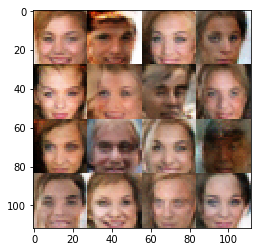

Epoch 1/1... Generator Loss: 0.7496 Discriminator Loss: 1.1041...
Epoch 1/1... Generator Loss: 1.0527 Discriminator Loss: 1.1132...
Epoch 1/1... Generator Loss: 0.5515 Discriminator Loss: 1.3922...
Epoch 1/1... Generator Loss: 0.7907 Discriminator Loss: 1.1700...
Epoch 1/1... Generator Loss: 0.5322 Discriminator Loss: 1.4961...
Epoch 1/1... Generator Loss: 0.7151 Discriminator Loss: 1.2437...
Epoch 1/1... Generator Loss: 0.7024 Discriminator Loss: 1.2990...
Epoch 1/1... Generator Loss: 0.6596 Discriminator Loss: 1.4548...
Epoch 1/1... Generator Loss: 1.0495 Discriminator Loss: 1.2547...
Epoch 1/1... Generator Loss: 0.7466 Discriminator Loss: 1.2996...


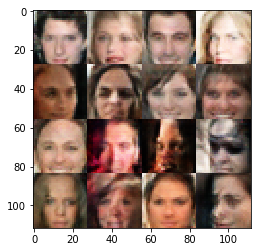

Epoch 1/1... Generator Loss: 0.8730 Discriminator Loss: 1.0753...
Epoch 1/1... Generator Loss: 0.8657 Discriminator Loss: 1.2994...
Epoch 1/1... Generator Loss: 0.6997 Discriminator Loss: 1.5478...
Epoch 1/1... Generator Loss: 0.7214 Discriminator Loss: 1.3980...
Epoch 1/1... Generator Loss: 0.7523 Discriminator Loss: 1.3349...
Epoch 1/1... Generator Loss: 0.8267 Discriminator Loss: 1.3191...
Epoch 1/1... Generator Loss: 0.8633 Discriminator Loss: 1.1333...
Epoch 1/1... Generator Loss: 0.7352 Discriminator Loss: 1.0399...
Epoch 1/1... Generator Loss: 0.7715 Discriminator Loss: 1.3881...
Epoch 1/1... Generator Loss: 0.7608 Discriminator Loss: 1.2899...


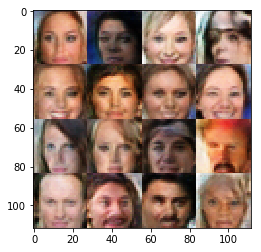

Epoch 1/1... Generator Loss: 1.0623 Discriminator Loss: 1.0838...
Epoch 1/1... Generator Loss: 0.7700 Discriminator Loss: 1.3083...
Epoch 1/1... Generator Loss: 0.7326 Discriminator Loss: 1.0574...
Epoch 1/1... Generator Loss: 0.6190 Discriminator Loss: 1.3931...
Epoch 1/1... Generator Loss: 0.8309 Discriminator Loss: 1.3022...
Epoch 1/1... Generator Loss: 0.6173 Discriminator Loss: 1.3583...
Epoch 1/1... Generator Loss: 0.7212 Discriminator Loss: 1.3673...
Epoch 1/1... Generator Loss: 0.9556 Discriminator Loss: 1.1253...
Epoch 1/1... Generator Loss: 0.7338 Discriminator Loss: 1.4171...
Epoch 1/1... Generator Loss: 1.0425 Discriminator Loss: 1.1418...


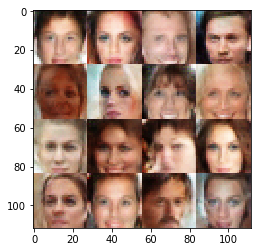

Epoch 1/1... Generator Loss: 0.8046 Discriminator Loss: 1.3286...
Epoch 1/1... Generator Loss: 0.8830 Discriminator Loss: 1.2106...
Epoch 1/1... Generator Loss: 0.7662 Discriminator Loss: 1.1604...
Epoch 1/1... Generator Loss: 0.8738 Discriminator Loss: 1.0967...
Epoch 1/1... Generator Loss: 0.9000 Discriminator Loss: 1.2979...
Epoch 1/1... Generator Loss: 0.6344 Discriminator Loss: 1.3553...
Epoch 1/1... Generator Loss: 0.5629 Discriminator Loss: 1.5470...
Epoch 1/1... Generator Loss: 0.8605 Discriminator Loss: 1.2002...
Epoch 1/1... Generator Loss: 0.8433 Discriminator Loss: 1.3698...
Epoch 1/1... Generator Loss: 0.7307 Discriminator Loss: 1.2903...


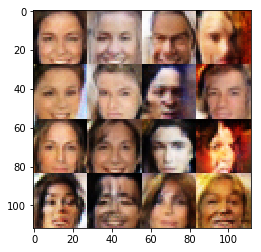

Epoch 1/1... Generator Loss: 0.8060 Discriminator Loss: 1.1211...
Epoch 1/1... Generator Loss: 0.6395 Discriminator Loss: 1.3369...
Epoch 1/1... Generator Loss: 0.8895 Discriminator Loss: 1.0370...
Epoch 1/1... Generator Loss: 0.7429 Discriminator Loss: 1.5057...
Epoch 1/1... Generator Loss: 0.9636 Discriminator Loss: 1.1996...
Epoch 1/1... Generator Loss: 0.6502 Discriminator Loss: 1.3377...
Epoch 1/1... Generator Loss: 0.6358 Discriminator Loss: 1.3974...
Epoch 1/1... Generator Loss: 0.6488 Discriminator Loss: 1.5117...
Epoch 1/1... Generator Loss: 0.7763 Discriminator Loss: 1.1426...
Epoch 1/1... Generator Loss: 0.6939 Discriminator Loss: 1.2229...


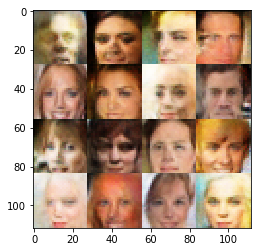

Epoch 1/1... Generator Loss: 0.7953 Discriminator Loss: 1.2247...
Epoch 1/1... Generator Loss: 0.6428 Discriminator Loss: 1.3788...
Epoch 1/1... Generator Loss: 0.6609 Discriminator Loss: 1.7182...
Epoch 1/1... Generator Loss: 1.0958 Discriminator Loss: 1.2923...
Epoch 1/1... Generator Loss: 0.9317 Discriminator Loss: 1.1803...
Epoch 1/1... Generator Loss: 1.0351 Discriminator Loss: 1.0182...
Epoch 1/1... Generator Loss: 0.9613 Discriminator Loss: 1.1518...
Epoch 1/1... Generator Loss: 0.7828 Discriminator Loss: 1.5260...
Epoch 1/1... Generator Loss: 1.2829 Discriminator Loss: 0.9257...
Epoch 1/1... Generator Loss: 0.9397 Discriminator Loss: 1.0564...


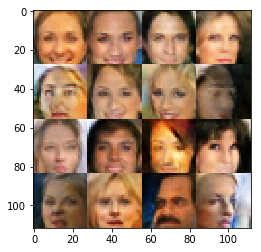

Epoch 1/1... Generator Loss: 0.9723 Discriminator Loss: 1.0774...
Epoch 1/1... Generator Loss: 0.8470 Discriminator Loss: 1.0158...
Epoch 1/1... Generator Loss: 0.7632 Discriminator Loss: 1.2992...
Epoch 1/1... Generator Loss: 0.8339 Discriminator Loss: 1.1479...
Epoch 1/1... Generator Loss: 0.5745 Discriminator Loss: 1.5122...
Epoch 1/1... Generator Loss: 0.6528 Discriminator Loss: 1.2593...
Epoch 1/1... Generator Loss: 0.9485 Discriminator Loss: 1.1850...
Epoch 1/1... Generator Loss: 0.7454 Discriminator Loss: 1.2032...
Epoch 1/1... Generator Loss: 0.7041 Discriminator Loss: 1.4774...
Epoch 1/1... Generator Loss: 0.6353 Discriminator Loss: 1.5016...


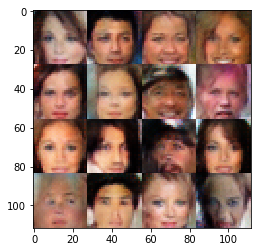

Epoch 1/1... Generator Loss: 0.5582 Discriminator Loss: 1.5560...
Epoch 1/1... Generator Loss: 0.6960 Discriminator Loss: 1.3542...
Epoch 1/1... Generator Loss: 1.0936 Discriminator Loss: 1.0657...
Epoch 1/1... Generator Loss: 0.7782 Discriminator Loss: 1.2334...
Epoch 1/1... Generator Loss: 0.5418 Discriminator Loss: 1.3562...
Epoch 1/1... Generator Loss: 0.6779 Discriminator Loss: 1.3236...
Epoch 1/1... Generator Loss: 0.8143 Discriminator Loss: 1.2748...
Epoch 1/1... Generator Loss: 0.6889 Discriminator Loss: 1.3120...
Epoch 1/1... Generator Loss: 0.7566 Discriminator Loss: 1.3583...
Epoch 1/1... Generator Loss: 0.7312 Discriminator Loss: 1.1977...


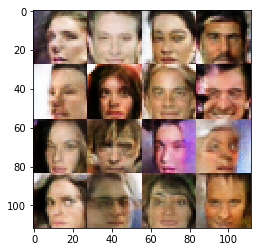

Epoch 1/1... Generator Loss: 0.8350 Discriminator Loss: 1.1488...
Epoch 1/1... Generator Loss: 0.8047 Discriminator Loss: 1.3906...
Epoch 1/1... Generator Loss: 0.8032 Discriminator Loss: 1.2261...
Epoch 1/1... Generator Loss: 0.7752 Discriminator Loss: 1.4483...
Epoch 1/1... Generator Loss: 0.9144 Discriminator Loss: 0.9944...
Epoch 1/1... Generator Loss: 0.8068 Discriminator Loss: 1.2524...
Epoch 1/1... Generator Loss: 0.7444 Discriminator Loss: 1.1879...
Epoch 1/1... Generator Loss: 0.7394 Discriminator Loss: 1.2671...
Epoch 1/1... Generator Loss: 0.6309 Discriminator Loss: 1.3733...
Epoch 1/1... Generator Loss: 0.7715 Discriminator Loss: 1.3966...


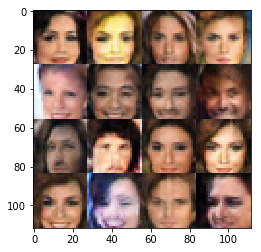

Epoch 1/1... Generator Loss: 0.7737 Discriminator Loss: 1.2679...
Epoch 1/1... Generator Loss: 1.2191 Discriminator Loss: 0.9885...
Epoch 1/1... Generator Loss: 0.9374 Discriminator Loss: 1.1359...
Epoch 1/1... Generator Loss: 0.8914 Discriminator Loss: 1.4035...
Epoch 1/1... Generator Loss: 0.8332 Discriminator Loss: 1.2808...
Epoch 1/1... Generator Loss: 0.7883 Discriminator Loss: 1.5531...
Epoch 1/1... Generator Loss: 0.7487 Discriminator Loss: 1.2091...
Epoch 1/1... Generator Loss: 0.8380 Discriminator Loss: 1.2496...
Epoch 1/1... Generator Loss: 0.8343 Discriminator Loss: 1.3329...
Epoch 1/1... Generator Loss: 0.5880 Discriminator Loss: 1.3561...


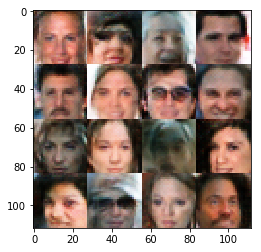

Epoch 1/1... Generator Loss: 0.6243 Discriminator Loss: 1.3132...
Epoch 1/1... Generator Loss: 0.9990 Discriminator Loss: 1.1142...
Epoch 1/1... Generator Loss: 0.5498 Discriminator Loss: 1.4655...
Epoch 1/1... Generator Loss: 0.6821 Discriminator Loss: 1.3595...
Epoch 1/1... Generator Loss: 0.9744 Discriminator Loss: 1.1462...
Epoch 1/1... Generator Loss: 0.7027 Discriminator Loss: 1.4334...
Epoch 1/1... Generator Loss: 0.6353 Discriminator Loss: 1.2800...
Epoch 1/1... Generator Loss: 0.6797 Discriminator Loss: 1.5782...
Epoch 1/1... Generator Loss: 0.8370 Discriminator Loss: 1.2383...
Epoch 1/1... Generator Loss: 0.7473 Discriminator Loss: 1.3442...


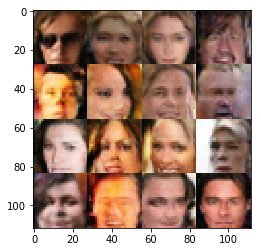

Epoch 1/1... Generator Loss: 0.7174 Discriminator Loss: 1.2758...
Epoch 1/1... Generator Loss: 0.8298 Discriminator Loss: 1.3494...
Epoch 1/1... Generator Loss: 0.8203 Discriminator Loss: 1.3761...
Epoch 1/1... Generator Loss: 0.5379 Discriminator Loss: 1.8096...
Epoch 1/1... Generator Loss: 0.9486 Discriminator Loss: 1.0030...
Epoch 1/1... Generator Loss: 0.8617 Discriminator Loss: 1.2658...
Epoch 1/1... Generator Loss: 0.7235 Discriminator Loss: 1.5095...
Epoch 1/1... Generator Loss: 1.0566 Discriminator Loss: 0.9242...
Epoch 1/1... Generator Loss: 0.7114 Discriminator Loss: 1.5156...
Epoch 1/1... Generator Loss: 0.8085 Discriminator Loss: 1.1806...


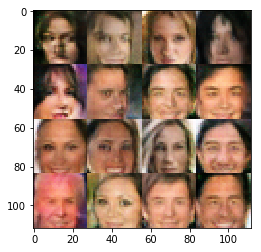

Epoch 1/1... Generator Loss: 0.7435 Discriminator Loss: 1.3253...
Epoch 1/1... Generator Loss: 1.0368 Discriminator Loss: 1.0969...
Epoch 1/1... Generator Loss: 0.9550 Discriminator Loss: 0.9303...
Epoch 1/1... Generator Loss: 0.9598 Discriminator Loss: 1.1635...
Epoch 1/1... Generator Loss: 0.7261 Discriminator Loss: 1.5133...
Epoch 1/1... Generator Loss: 0.9191 Discriminator Loss: 1.0647...
Epoch 1/1... Generator Loss: 0.6850 Discriminator Loss: 1.3120...
Epoch 1/1... Generator Loss: 0.8936 Discriminator Loss: 1.3652...
Epoch 1/1... Generator Loss: 0.8566 Discriminator Loss: 1.2007...
Epoch 1/1... Generator Loss: 0.6422 Discriminator Loss: 1.3237...


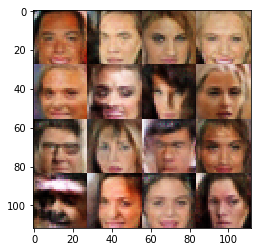

Epoch 1/1... Generator Loss: 0.6913 Discriminator Loss: 1.4813...
Epoch 1/1... Generator Loss: 0.7703 Discriminator Loss: 1.4386...
Epoch 1/1... Generator Loss: 0.5487 Discriminator Loss: 1.3354...
Epoch 1/1... Generator Loss: 0.6558 Discriminator Loss: 1.2817...
Epoch 1/1... Generator Loss: 0.8169 Discriminator Loss: 1.3532...
Epoch 1/1... Generator Loss: 0.9074 Discriminator Loss: 1.1781...
Epoch 1/1... Generator Loss: 0.9208 Discriminator Loss: 1.1997...
Epoch 1/1... Generator Loss: 0.7931 Discriminator Loss: 1.3172...
Epoch 1/1... Generator Loss: 0.6194 Discriminator Loss: 1.3541...
Epoch 1/1... Generator Loss: 0.8230 Discriminator Loss: 1.1144...


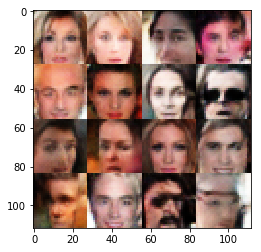

Epoch 1/1... Generator Loss: 0.7233 Discriminator Loss: 1.1543...
Epoch 1/1... Generator Loss: 0.9174 Discriminator Loss: 1.2016...
Epoch 1/1... Generator Loss: 0.7494 Discriminator Loss: 1.3656...
Epoch 1/1... Generator Loss: 1.0185 Discriminator Loss: 1.0400...
Epoch 1/1... Generator Loss: 0.9717 Discriminator Loss: 1.1503...
Epoch 1/1... Generator Loss: 0.8816 Discriminator Loss: 1.1085...
Epoch 1/1... Generator Loss: 0.8048 Discriminator Loss: 1.2818...
Epoch 1/1... Generator Loss: 0.8500 Discriminator Loss: 1.2622...
Epoch 1/1... Generator Loss: 0.8332 Discriminator Loss: 1.3316...
Epoch 1/1... Generator Loss: 0.9015 Discriminator Loss: 1.1937...


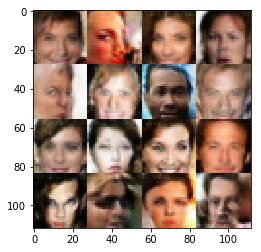

Epoch 1/1... Generator Loss: 0.8803 Discriminator Loss: 1.2031...
Epoch 1/1... Generator Loss: 0.7505 Discriminator Loss: 1.3425...
Epoch 1/1... Generator Loss: 0.7542 Discriminator Loss: 1.2199...
Epoch 1/1... Generator Loss: 0.8059 Discriminator Loss: 1.2821...
Epoch 1/1... Generator Loss: 0.5750 Discriminator Loss: 1.4327...
Epoch 1/1... Generator Loss: 0.9051 Discriminator Loss: 1.1896...
Epoch 1/1... Generator Loss: 0.7389 Discriminator Loss: 1.2839...
Epoch 1/1... Generator Loss: 0.8771 Discriminator Loss: 1.3493...
Epoch 1/1... Generator Loss: 0.7808 Discriminator Loss: 1.5398...
Epoch 1/1... Generator Loss: 0.8996 Discriminator Loss: 1.0195...


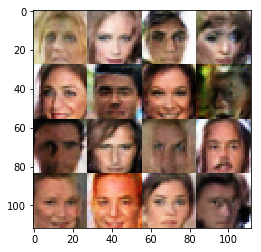

Epoch 1/1... Generator Loss: 1.1232 Discriminator Loss: 1.1353...
Epoch 1/1... Generator Loss: 0.9828 Discriminator Loss: 1.0841...
Epoch 1/1... Generator Loss: 0.4651 Discriminator Loss: 1.9099...
Epoch 1/1... Generator Loss: 0.9346 Discriminator Loss: 1.3262...
Epoch 1/1... Generator Loss: 0.5823 Discriminator Loss: 1.4174...
Epoch 1/1... Generator Loss: 0.8264 Discriminator Loss: 1.4443...
Epoch 1/1... Generator Loss: 0.7197 Discriminator Loss: 1.1886...
Epoch 1/1... Generator Loss: 0.8537 Discriminator Loss: 1.1406...
Epoch 1/1... Generator Loss: 0.7305 Discriminator Loss: 1.3297...
Epoch 1/1... Generator Loss: 0.7371 Discriminator Loss: 1.4976...


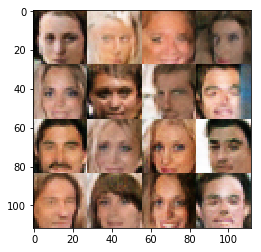

Epoch 1/1... Generator Loss: 0.9198 Discriminator Loss: 1.1016...
Epoch 1/1... Generator Loss: 0.9093 Discriminator Loss: 1.2118...
Epoch 1/1... Generator Loss: 0.8063 Discriminator Loss: 1.2593...
Epoch 1/1... Generator Loss: 0.8068 Discriminator Loss: 1.1769...
Epoch 1/1... Generator Loss: 0.7717 Discriminator Loss: 1.4656...
Epoch 1/1... Generator Loss: 0.7887 Discriminator Loss: 1.2467...
Epoch 1/1... Generator Loss: 0.6314 Discriminator Loss: 1.4410...
Epoch 1/1... Generator Loss: 0.6846 Discriminator Loss: 1.1654...
Epoch 1/1... Generator Loss: 0.7967 Discriminator Loss: 1.1631...
Epoch 1/1... Generator Loss: 0.7628 Discriminator Loss: 1.3064...


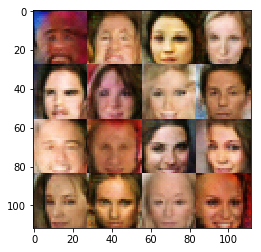

Epoch 1/1... Generator Loss: 0.6376 Discriminator Loss: 1.5068...
Epoch 1/1... Generator Loss: 0.6572 Discriminator Loss: 1.4136...
Epoch 1/1... Generator Loss: 0.7422 Discriminator Loss: 1.4972...
Epoch 1/1... Generator Loss: 0.9176 Discriminator Loss: 1.0993...
Epoch 1/1... Generator Loss: 0.8498 Discriminator Loss: 1.0695...
Epoch 1/1... Generator Loss: 0.7092 Discriminator Loss: 1.2896...
Epoch 1/1... Generator Loss: 1.1330 Discriminator Loss: 1.1234...
Epoch 1/1... Generator Loss: 1.0201 Discriminator Loss: 0.9528...
Epoch 1/1... Generator Loss: 0.5911 Discriminator Loss: 1.4875...
Epoch 1/1... Generator Loss: 0.7610 Discriminator Loss: 1.2099...


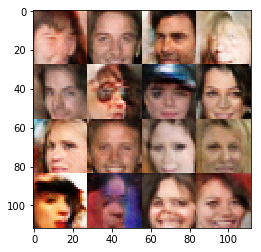

Epoch 1/1... Generator Loss: 0.9820 Discriminator Loss: 0.9963...
Epoch 1/1... Generator Loss: 0.6206 Discriminator Loss: 1.5215...
Epoch 1/1... Generator Loss: 0.8835 Discriminator Loss: 1.0615...
Epoch 1/1... Generator Loss: 0.6720 Discriminator Loss: 1.3436...
Epoch 1/1... Generator Loss: 0.8122 Discriminator Loss: 1.2798...
Epoch 1/1... Generator Loss: 0.6447 Discriminator Loss: 1.5930...
Epoch 1/1... Generator Loss: 0.5706 Discriminator Loss: 1.5000...
Epoch 1/1... Generator Loss: 0.6597 Discriminator Loss: 1.3244...
Epoch 1/1... Generator Loss: 1.1171 Discriminator Loss: 1.0037...
Epoch 1/1... Generator Loss: 0.6771 Discriminator Loss: 1.2168...


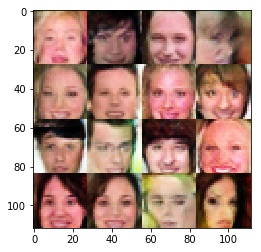

Epoch 1/1... Generator Loss: 0.6378 Discriminator Loss: 1.3836...
Epoch 1/1... Generator Loss: 0.8220 Discriminator Loss: 1.1344...
Epoch 1/1... Generator Loss: 0.6600 Discriminator Loss: 1.3639...
Epoch 1/1... Generator Loss: 0.5796 Discriminator Loss: 1.5615...
Epoch 1/1... Generator Loss: 0.9361 Discriminator Loss: 1.2574...
Epoch 1/1... Generator Loss: 0.6355 Discriminator Loss: 1.4153...
Epoch 1/1... Generator Loss: 0.8069 Discriminator Loss: 1.0567...
Epoch 1/1... Generator Loss: 0.8277 Discriminator Loss: 1.1124...
Epoch 1/1... Generator Loss: 1.0384 Discriminator Loss: 1.2917...
Epoch 1/1... Generator Loss: 0.6484 Discriminator Loss: 1.1896...


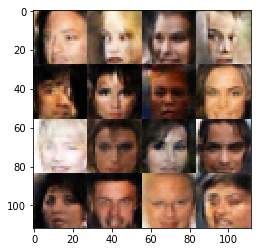

Epoch 1/1... Generator Loss: 0.9866 Discriminator Loss: 1.1097...
Epoch 1/1... Generator Loss: 0.9532 Discriminator Loss: 1.2897...
Epoch 1/1... Generator Loss: 0.8139 Discriminator Loss: 1.3501...
Epoch 1/1... Generator Loss: 0.6815 Discriminator Loss: 1.4964...
Epoch 1/1... Generator Loss: 0.6409 Discriminator Loss: 1.2707...
Epoch 1/1... Generator Loss: 0.8957 Discriminator Loss: 1.1804...
Epoch 1/1... Generator Loss: 1.0441 Discriminator Loss: 1.1156...
Epoch 1/1... Generator Loss: 0.7109 Discriminator Loss: 1.1724...
Epoch 1/1... Generator Loss: 0.8382 Discriminator Loss: 1.2574...
Epoch 1/1... Generator Loss: 0.7546 Discriminator Loss: 1.3076...


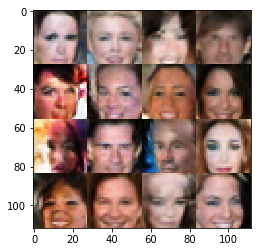

Epoch 1/1... Generator Loss: 0.8839 Discriminator Loss: 1.2656...
Epoch 1/1... Generator Loss: 0.9280 Discriminator Loss: 1.3925...
Epoch 1/1... Generator Loss: 0.8659 Discriminator Loss: 1.1054...
Epoch 1/1... Generator Loss: 0.6600 Discriminator Loss: 1.2137...
Epoch 1/1... Generator Loss: 0.8016 Discriminator Loss: 1.4394...
Epoch 1/1... Generator Loss: 0.6498 Discriminator Loss: 1.4035...
Epoch 1/1... Generator Loss: 0.8967 Discriminator Loss: 1.3491...
Epoch 1/1... Generator Loss: 1.0984 Discriminator Loss: 1.1298...
Epoch 1/1... Generator Loss: 1.0706 Discriminator Loss: 0.9057...
Epoch 1/1... Generator Loss: 0.9504 Discriminator Loss: 0.9257...


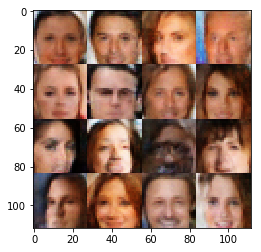

Epoch 1/1... Generator Loss: 1.0770 Discriminator Loss: 1.1326...
Epoch 1/1... Generator Loss: 0.7769 Discriminator Loss: 1.1093...
Epoch 1/1... Generator Loss: 0.7351 Discriminator Loss: 1.4507...
Epoch 1/1... Generator Loss: 1.2648 Discriminator Loss: 1.1781...
Epoch 1/1... Generator Loss: 0.8571 Discriminator Loss: 1.1480...
Epoch 1/1... Generator Loss: 0.7743 Discriminator Loss: 1.2026...
Epoch 1/1... Generator Loss: 0.8091 Discriminator Loss: 1.3052...
Epoch 1/1... Generator Loss: 0.9561 Discriminator Loss: 1.1278...
Epoch 1/1... Generator Loss: 0.8463 Discriminator Loss: 1.3512...
Epoch 1/1... Generator Loss: 0.8123 Discriminator Loss: 1.1259...


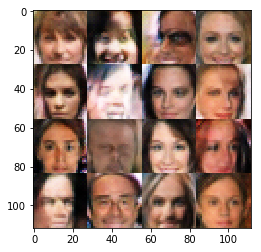

Epoch 1/1... Generator Loss: 0.8875 Discriminator Loss: 1.1582...
Epoch 1/1... Generator Loss: 0.4989 Discriminator Loss: 1.6857...
Epoch 1/1... Generator Loss: 0.5306 Discriminator Loss: 1.5442...
Epoch 1/1... Generator Loss: 0.8608 Discriminator Loss: 1.3406...
Epoch 1/1... Generator Loss: 0.6741 Discriminator Loss: 1.3826...
Epoch 1/1... Generator Loss: 0.8847 Discriminator Loss: 1.3194...
Epoch 1/1... Generator Loss: 0.8951 Discriminator Loss: 1.1829...
Epoch 1/1... Generator Loss: 0.9956 Discriminator Loss: 1.2090...
Epoch 1/1... Generator Loss: 0.8239 Discriminator Loss: 1.1795...
Epoch 1/1... Generator Loss: 0.7544 Discriminator Loss: 1.3665...


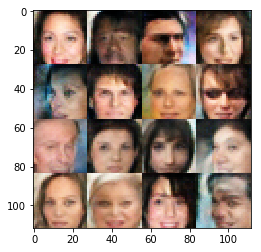

Epoch 1/1... Generator Loss: 0.9237 Discriminator Loss: 1.2067...
Epoch 1/1... Generator Loss: 0.7891 Discriminator Loss: 1.3481...
Epoch 1/1... Generator Loss: 0.6791 Discriminator Loss: 1.2074...
Epoch 1/1... Generator Loss: 0.6633 Discriminator Loss: 1.5064...
Epoch 1/1... Generator Loss: 0.8946 Discriminator Loss: 1.0775...
Epoch 1/1... Generator Loss: 0.7645 Discriminator Loss: 1.3037...
Epoch 1/1... Generator Loss: 0.7513 Discriminator Loss: 1.2722...
Epoch 1/1... Generator Loss: 0.9607 Discriminator Loss: 1.0032...
Epoch 1/1... Generator Loss: 0.8468 Discriminator Loss: 1.2592...
Epoch 1/1... Generator Loss: 0.7404 Discriminator Loss: 1.3517...


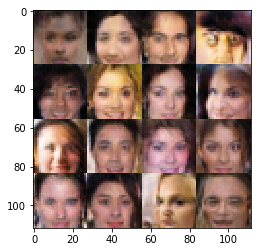

Epoch 1/1... Generator Loss: 0.7162 Discriminator Loss: 1.4301...
Epoch 1/1... Generator Loss: 0.8672 Discriminator Loss: 1.1368...
Epoch 1/1... Generator Loss: 0.7679 Discriminator Loss: 1.4409...
Epoch 1/1... Generator Loss: 0.6613 Discriminator Loss: 1.2368...
Epoch 1/1... Generator Loss: 0.7646 Discriminator Loss: 1.2476...
Epoch 1/1... Generator Loss: 0.7737 Discriminator Loss: 1.3396...
Epoch 1/1... Generator Loss: 0.6623 Discriminator Loss: 1.3465...
Epoch 1/1... Generator Loss: 0.7808 Discriminator Loss: 1.4022...
Epoch 1/1... Generator Loss: 0.8541 Discriminator Loss: 1.3800...
Epoch 1/1... Generator Loss: 0.8537 Discriminator Loss: 1.2730...


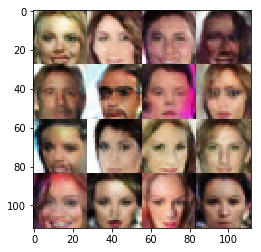

Epoch 1/1... Generator Loss: 0.8775 Discriminator Loss: 1.2825...
Epoch 1/1... Generator Loss: 0.6437 Discriminator Loss: 1.3416...
Epoch 1/1... Generator Loss: 0.6000 Discriminator Loss: 1.2166...
Epoch 1/1... Generator Loss: 0.7960 Discriminator Loss: 1.1757...
Epoch 1/1... Generator Loss: 0.6784 Discriminator Loss: 1.3096...
Epoch 1/1... Generator Loss: 1.0531 Discriminator Loss: 1.1252...
Epoch 1/1... Generator Loss: 0.8836 Discriminator Loss: 1.1404...
Epoch 1/1... Generator Loss: 0.8350 Discriminator Loss: 1.1795...
Epoch 1/1... Generator Loss: 0.9442 Discriminator Loss: 1.1942...
Epoch 1/1... Generator Loss: 0.8204 Discriminator Loss: 1.2781...


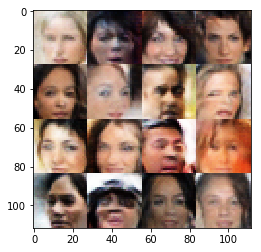

Epoch 1/1... Generator Loss: 0.9052 Discriminator Loss: 1.2811...
Epoch 1/1... Generator Loss: 0.8489 Discriminator Loss: 1.2941...
Epoch 1/1... Generator Loss: 0.6485 Discriminator Loss: 1.3369...
Epoch 1/1... Generator Loss: 0.9215 Discriminator Loss: 1.1205...
Epoch 1/1... Generator Loss: 0.9916 Discriminator Loss: 0.9380...
Epoch 1/1... Generator Loss: 1.0630 Discriminator Loss: 1.1866...
Epoch 1/1... Generator Loss: 1.0002 Discriminator Loss: 1.1545...
Epoch 1/1... Generator Loss: 0.7449 Discriminator Loss: 1.4932...
Epoch 1/1... Generator Loss: 0.7007 Discriminator Loss: 1.3547...
Epoch 1/1... Generator Loss: 0.7626 Discriminator Loss: 1.4635...


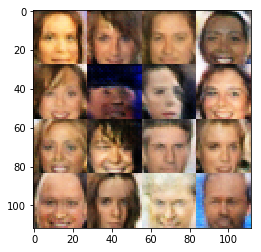

Epoch 1/1... Generator Loss: 0.8322 Discriminator Loss: 1.0521...
Epoch 1/1... Generator Loss: 0.9394 Discriminator Loss: 1.1957...
Epoch 1/1... Generator Loss: 0.7969 Discriminator Loss: 1.1171...
Epoch 1/1... Generator Loss: 0.7236 Discriminator Loss: 1.3998...
Epoch 1/1... Generator Loss: 0.6394 Discriminator Loss: 1.3672...
Epoch 1/1... Generator Loss: 0.8073 Discriminator Loss: 1.1670...
Epoch 1/1... Generator Loss: 0.7021 Discriminator Loss: 1.4172...
Epoch 1/1... Generator Loss: 0.9319 Discriminator Loss: 1.1122...
Epoch 1/1... Generator Loss: 0.6705 Discriminator Loss: 1.3531...
Epoch 1/1... Generator Loss: 0.8641 Discriminator Loss: 1.1828...


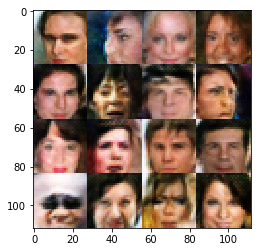

Epoch 1/1... Generator Loss: 0.8645 Discriminator Loss: 1.2145...
Epoch 1/1... Generator Loss: 0.7841 Discriminator Loss: 1.2776...
Epoch 1/1... Generator Loss: 0.5385 Discriminator Loss: 1.7110...
Epoch 1/1... Generator Loss: 0.9053 Discriminator Loss: 1.1345...
Epoch 1/1... Generator Loss: 0.7101 Discriminator Loss: 1.4635...
Epoch 1/1... Generator Loss: 0.8206 Discriminator Loss: 1.2236...
Epoch 1/1... Generator Loss: 1.3419 Discriminator Loss: 0.8736...
Epoch 1/1... Generator Loss: 0.9614 Discriminator Loss: 0.9875...
Epoch 1/1... Generator Loss: 0.8738 Discriminator Loss: 1.1855...
Epoch 1/1... Generator Loss: 0.5678 Discriminator Loss: 1.3149...


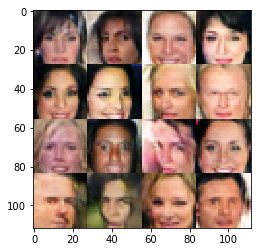

Epoch 1/1... Generator Loss: 0.7974 Discriminator Loss: 1.3931...
Epoch 1/1... Generator Loss: 1.0220 Discriminator Loss: 1.1525...
Epoch 1/1... Generator Loss: 0.6879 Discriminator Loss: 1.4595...
Epoch 1/1... Generator Loss: 0.9594 Discriminator Loss: 1.0778...
Epoch 1/1... Generator Loss: 0.7609 Discriminator Loss: 1.3080...
Epoch 1/1... Generator Loss: 0.9670 Discriminator Loss: 1.2683...
Epoch 1/1... Generator Loss: 0.9461 Discriminator Loss: 1.2168...
Epoch 1/1... Generator Loss: 0.7839 Discriminator Loss: 1.1593...
Epoch 1/1... Generator Loss: 0.7979 Discriminator Loss: 1.2393...
Epoch 1/1... Generator Loss: 0.7653 Discriminator Loss: 1.3127...


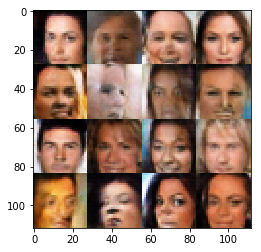

Epoch 1/1... Generator Loss: 0.7809 Discriminator Loss: 1.2349...
Epoch 1/1... Generator Loss: 0.8979 Discriminator Loss: 1.0730...
Epoch 1/1... Generator Loss: 0.7033 Discriminator Loss: 1.2850...
Epoch 1/1... Generator Loss: 0.8443 Discriminator Loss: 1.2012...
Epoch 1/1... Generator Loss: 0.7750 Discriminator Loss: 1.3129...
Epoch 1/1... Generator Loss: 0.6622 Discriminator Loss: 1.4086...
Epoch 1/1... Generator Loss: 0.8912 Discriminator Loss: 1.1114...
Epoch 1/1... Generator Loss: 0.5009 Discriminator Loss: 1.5635...
Epoch 1/1... Generator Loss: 0.8442 Discriminator Loss: 1.2046...
Epoch 1/1... Generator Loss: 0.8308 Discriminator Loss: 1.4212...


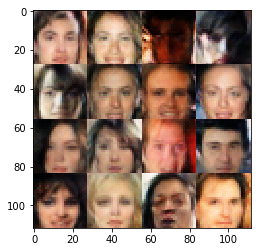

Epoch 1/1... Generator Loss: 0.8206 Discriminator Loss: 1.3980...
Epoch 1/1... Generator Loss: 0.6688 Discriminator Loss: 1.4028...
Epoch 1/1... Generator Loss: 0.6658 Discriminator Loss: 1.2794...
Epoch 1/1... Generator Loss: 0.6929 Discriminator Loss: 1.3405...
Epoch 1/1... Generator Loss: 0.6388 Discriminator Loss: 1.5746...
Epoch 1/1... Generator Loss: 0.8663 Discriminator Loss: 1.2577...
Epoch 1/1... Generator Loss: 0.9176 Discriminator Loss: 1.3632...
Epoch 1/1... Generator Loss: 0.8214 Discriminator Loss: 1.4164...
Epoch 1/1... Generator Loss: 0.7056 Discriminator Loss: 1.3080...
Epoch 1/1... Generator Loss: 0.9323 Discriminator Loss: 1.0719...


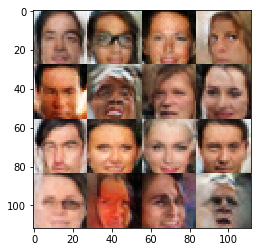

Epoch 1/1... Generator Loss: 0.7070 Discriminator Loss: 1.3385...
Epoch 1/1... Generator Loss: 0.8172 Discriminator Loss: 1.2593...
Epoch 1/1... Generator Loss: 0.8305 Discriminator Loss: 1.2401...
Epoch 1/1... Generator Loss: 0.5039 Discriminator Loss: 1.4991...
Epoch 1/1... Generator Loss: 0.6812 Discriminator Loss: 1.2773...
Epoch 1/1... Generator Loss: 0.8325 Discriminator Loss: 1.3671...
Epoch 1/1... Generator Loss: 0.8138 Discriminator Loss: 1.1313...
Epoch 1/1... Generator Loss: 0.5952 Discriminator Loss: 1.3996...
Epoch 1/1... Generator Loss: 0.6773 Discriminator Loss: 1.3211...
Epoch 1/1... Generator Loss: 0.7485 Discriminator Loss: 1.1959...


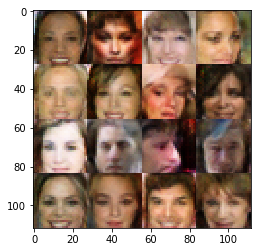

Epoch 1/1... Generator Loss: 0.7300 Discriminator Loss: 1.3782...
Epoch 1/1... Generator Loss: 0.9692 Discriminator Loss: 1.0778...
Epoch 1/1... Generator Loss: 0.7239 Discriminator Loss: 1.0264...
Epoch 1/1... Generator Loss: 0.9509 Discriminator Loss: 1.2138...
Epoch 1/1... Generator Loss: 0.6651 Discriminator Loss: 1.1844...
Epoch 1/1... Generator Loss: 0.7527 Discriminator Loss: 1.2827...
Epoch 1/1... Generator Loss: 0.8780 Discriminator Loss: 1.0364...
Epoch 1/1... Generator Loss: 0.8546 Discriminator Loss: 1.0972...
Epoch 1/1... Generator Loss: 0.6172 Discriminator Loss: 1.5606...
Epoch 1/1... Generator Loss: 0.9350 Discriminator Loss: 1.2564...


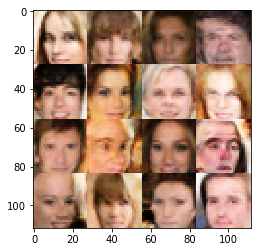

Epoch 1/1... Generator Loss: 0.9544 Discriminator Loss: 1.1115...
Epoch 1/1... Generator Loss: 0.7064 Discriminator Loss: 1.4552...
Epoch 1/1... Generator Loss: 0.6088 Discriminator Loss: 1.4042...
Epoch 1/1... Generator Loss: 0.8649 Discriminator Loss: 1.2093...
Epoch 1/1... Generator Loss: 0.8276 Discriminator Loss: 1.1182...
Epoch 1/1... Generator Loss: 0.8885 Discriminator Loss: 1.1411...
Epoch 1/1... Generator Loss: 0.6537 Discriminator Loss: 1.5311...
Epoch 1/1... Generator Loss: 0.3871 Discriminator Loss: 1.6993...
Epoch 1/1... Generator Loss: 0.7789 Discriminator Loss: 1.0769...
Epoch 1/1... Generator Loss: 1.0066 Discriminator Loss: 1.1840...


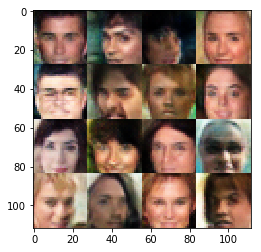

Epoch 1/1... Generator Loss: 0.8396 Discriminator Loss: 1.3681...
Epoch 1/1... Generator Loss: 0.7409 Discriminator Loss: 1.0807...
Epoch 1/1... Generator Loss: 0.9110 Discriminator Loss: 1.1349...
Epoch 1/1... Generator Loss: 0.7535 Discriminator Loss: 1.1599...
Epoch 1/1... Generator Loss: 0.9627 Discriminator Loss: 1.0242...


In [14]:
batch_size = 10
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.